# "Reduced" track finding model

In [1]:
import random
random.randint(100,1000)

987

Reduce the number of straws/features at the input of the model. Goal is to produce a model without performance loss but requiring much less parameters, and much better targeted training. 

After first tests it looks like this structure achieves good or better performance with fewer model parameters. 

## Define the Detector class

In [2]:
import os,sys
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import time

In [3]:
class Detector():
    """
    Simulate a 2D rectangular straw setup.
    Made of successive modules, each one consisting of U/V double layers of straws.
    """
    n_modules=8 ## number of modules, each with 4 layers of straws
    n_layersPerModule=4
    n_layers = n_modules*n_layersPerModule
    n_straws=32
    
    straw_radius=0.25 # [cm]
    straw_distance=1.2 # distance between neighboring straw centers in same layer [cm]
    UV_distance=1.7   # distance between successive U/V submodules [cm]
    module_distance=7   # distance between successive modules [cm]
    yOffset_PerModule = 5 # y-offset per module, to allow for inward bend of tracks

    module_length = (n_layersPerModule/2)*straw_distance + UV_distance + 2*straw_radius
    length=n_modules*module_length + (n_modules-1)*module_distance
    width=n_straws*straw_distance+2*straw_radius
    
    ## Occupancy characteristics
    avg_tracks=2 ## avg number of tracks per event
    max_tracks=3 ## max number of tracks allowed per event

    
    layers=np.zeros(n_layers)
    straws=np.zeros(n_straws)
    x=np.zeros(n_layers)
    y=np.zeros((n_layers, n_straws))
    
    def make_straws(self):
        ## make straws, based on their locations as found in:
        ## https://cdcvs.fnal.gov/redmine/projects/gm2dqm/repository/revisions/develop/entry/node/tracker/public/tracker/scripts/trackerTracks.js
        ## returns the x,y (length,width) vectors of straw locations
        UView = {
            'x': [-12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -12.696, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, -7.5, 121.6674, 121.6677, 121.6679, 121.6671, 121.6673, 121.6677, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 121.667, 126.8635, 126.8638, 126.863, 126.8632, 126.8634, 126.8637, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 126.863, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 256.021, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 261.217, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 390.375, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 395.571, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 524.725, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 529.921, 659.065,  659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 659.065, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 664.261, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 793.407, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 798.603, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 927.737, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933, 932.933],
            'y': [-64.3105, -58.2588, -52.207, -46.1552, -40.1034, -34.0517, -27.9999, -21.9481, -15.8963, -9.84457, -3.7928, 2.25898, 8.31075, 14.3625, 20.4143, 26.4661, 32.5178, 38.5696, 44.6214, 50.6732, 56.7249, 62.7767, 68.8285, 74.8803, 80.932, 86.9838, 93.0356, 99.0874, 105.139, 111.191, 117.243, 123.294, -61.2846, -55.2329, -49.1811, -43.1293, -37.0775, -31.0258, -24.974, -18.9222, -12.8704, -6.81867, -0.766897, 5.28488, 11.3367, 17.3884, 23.4402, 29.492, 35.5437, 41.5955, 47.6473, 53.6991, 59.7508, 65.8026, 71.8544, 77.9062, 83.9579, 90.0097, 96.0615, 102.113, 108.165, 114.217, 120.269, 126.32, -34.5014, -28.4497, -22.3979, -16.3461, -10.2943, -4.24257, 1.80921, 7.86098, 13.9128, 19.9645, 26.0163, 32.0681, 38.1198, 44.1716, 50.2234, 56.2752, 62.3269, 68.3787, 74.4305, 80.4823, 86.534, 92.5858, 98.6376, 104.689, 110.741, 116.793, 122.845, 128.896, 134.948, 141, 147.052, 153.104, -31.4755, -25.4238, -19.372, -13.3202, -7.26844, -1.21667, 4.83511, 10.8869, 16.9387, 22.9904, 29.0422, 35.094, 41.1457, 47.1975, 53.2493, 59.3011, 65.3528, 71.4046, 77.4564, 83.5082, 89.5599, 95.6117, 101.663, 107.715, 113.767, 119.819, 125.871, 131.922, 137.974, 144.026, 150.078, 156.129, -7.35165, -1.29987, 4.7519, 10.8037, 16.8554, 22.9072, 28.959, 35.0108, 41.0625, 47.1143, 53.1661, 59.2179, 65.2696, 71.3214, 77.3732, 83.425, 89.4767, 95.5285, 101.58, 107.632, 113.684, 119.736, 125.787, 131.839, 137.891, 143.943, 149.994, 156.046, 162.098, 168.15, 174.202, 180.253, -4.32575, 1.72603, 7.7778, 13.8296, 19.8813, 25.9331, 31.9849, 38.0367, 44.0884, 50.1402, 56.192, 62.2438, 68.2955, 74.3473, 80.3991, 86.4509, 92.5026, 98.5544, 104.606, 110.658, 116.71, 122.762, 128.813, 134.865, 140.917, 146.969, 153.02, 159.072, 165.124, 171.176, 177.227, 183.279, 17.1099, 23.1617, 29.2135, 35.2652, 41.317, 47.3688, 53.4206, 59.4723, 65.5241, 71.5759, 77.6277, 83.6794, 89.7312, 95.783, 101.835, 107.887, 113.938, 119.99, 126.042, 132.094, 138.145, 144.197, 150.249, 156.301, 162.352, 168.404, 174.456, 180.508, 186.56, 192.611, 198.663, 204.715, 20.1358, 26.1876, 32.2394, 38.2911, 44.3429, 50.3947, 56.4465, 62.4982, 68.55, 74.6018, 80.6536, 86.7053, 92.7571, 98.8089, 104.861, 110.912, 116.964, 123.016, 129.068, 135.12, 141.171, 147.223, 153.275, 159.327, 165.378, 171.43, 177.482, 183.534, 189.585, 195.637, 201.689, 207.741, 38.8201, 44.8719, 50.9237, 56.9754, 63.0272, 69.079, 75.1308, 81.1825, 87.2343, 93.2861, 99.3379, 105.39, 111.441, 117.493, 123.545, 129.597, 135.649, 141.7, 147.752, 153.804, 159.856, 165.907, 171.959, 178.011, 184.063, 190.114, 196.166, 202.218, 208.27, 214.322, 220.373, 226.425, 41.846, 47.8978, 53.9496, 60.0013, 66.0531, 72.1049, 78.1567, 84.2084, 90.2602, 96.312, 102.364, 108.416, 114.467, 120.519, 126.571, 132.623, 138.674, 144.726, 150.778, 156.83, 162.881, 168.933, 174.985, 181.037, 187.089, 193.14, 199.192, 205.244, 211.296, 217.347, 223.399, 229.451, 57.9122, 63.964, 70.0158, 76.0675, 82.1193, 88.1711, 94.2229, 100.275, 106.326, 112.378, 118.43, 124.482, 130.534, 136.585, 142.637, 148.689, 154.741, 160.792, 166.844, 172.896, 178.948, 184.999, 191.051, 197.103, 203.155, 209.207, 215.258, 221.31, 227.362, 233.414, 239.465, 245.517, 60.9381, 66.9899, 73.0417, 79.0934, 85.1452, 91.197, 97.2488, 103.301, 109.352, 115.404, 121.456, 127.508, 133.559, 139.611, 145.663, 151.715, 157.767, 163.818, 169.87, 175.922, 181.974, 188.025, 194.077, 200.129, 206.181, 212.232, 218.284, 224.336, 230.388, 236.44, 242.491, 248.543, 74.3793, 80.4311, 86.4828, 92.5346, 98.5864, 104.638, 110.69, 116.742, 122.793, 128.845, 134.897, 140.949, 147.001, 153.052, 159.104, 165.156, 171.208, 177.259, 183.311, 189.363, 195.415, 201.467, 207.518, 213.57, 219.622, 225.674, 231.725, 237.777, 243.829, 249.881, 255.932, 261.984, 77.4052, 83.457, 89.5087, 95.5605, 101.612, 107.664, 113.716, 119.768, 125.819, 131.871, 137.923, 143.975, 150.026, 156.078, 162.13, 168.182, 174.234, 180.285, 186.337, 192.389, 198.441, 204.492, 210.544, 216.596, 222.648, 228.7, 234.751, 240.803, 246.855, 252.907, 258.958, 265.01, 88.2379, 94.2896, 100.341, 106.393, 112.445, 118.497, 124.549, 130.6, 136.652, 142.704, 148.756, 154.807, 160.859, 166.911, 172.963, 179.014, 185.066, 191.118, 197.17, 203.222, 209.273, 215.325, 221.377, 227.429, 233.48, 239.532, 245.584, 251.636, 257.688, 263.739, 269.791, 275.843, 91.2638, 97.3155, 103.367, 109.419, 115.471, 121.523, 127.574, 133.626, 139.678, 145.73, 151.782, 157.833, 163.885, 169.937, 175.989, 182.04, 188.092, 194.144, 200.196, 206.247, 212.299, 218.351, 224.403, 230.455, 236.506, 242.558, 248.61, 254.662, 260.713, 266.765, 272.817, 278.869]
        }
        VView = {
            'x': [7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 7.5, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 12.696, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 141.863, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 147.059, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 276.217, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 281.413, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 410.571, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 415.767, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 544.921, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 550.117, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 679.261, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 684.457, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 813.603, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 818.799, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 947.933, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129, 953.129],
            'y': [-60.9556, -54.9038, -48.852, -42.8002, -36.7485, -30.6967, -24.6449, -18.5931, -12.5414, -6.4896, -0.437828, 5.61395, 11.6657, 17.7175, 23.7693, 29.821, 35.8728, 41.9246, 47.9764, 54.0281, 60.0799, 66.1317, 72.1835, 78.2352, 84.287, 90.3388, 96.3906, 102.442, 108.494, 114.546, 120.598, 126.649, -63.9815, -57.9297, -51.8779, -45.8261, -39.7744, -33.7226, -27.6708, -21.619, -15.5673, -9.5155, -3.46373, 2.58805, 8.63982, 14.6916, 20.7434, 26.7951, 32.8469, 38.8987, 44.9505, 51.0022, 57.054, 63.1058, 69.1576, 75.2093, 81.2611, 87.3129, 93.3647, 99.4164, 105.468, 111.52, 117.572, 123.624, -31.1465, -25.0947, -19.0429, -12.9911, -6.93937, -0.887599, 5.16417, 11.2159, 17.2677, 23.3195, 29.3713, 35.423, 41.4748, 47.5266, 53.5784, 59.6301, 65.6819, 71.7337, 77.7855, 83.8372, 89.889, 95.9408, 101.993, 108.044, 114.096, 120.148, 126.2, 132.251, 138.303, 144.355, 150.407, 156.459, -34.1724, -28.1206, -22.0688, -16.017, -9.96527, -3.9135, 2.13827, 8.19005, 14.2418, 20.2936, 26.3454, 32.3971, 38.4489, 44.5007, 50.5525, 56.6042, 62.656, 68.7078, 74.7596, 80.8113, 86.8631, 92.9149, 98.9667, 105.018, 111.07, 117.122, 123.174, 129.226, 135.277, 141.329, 147.381, 153.433, -3.99668, 2.05509, 8.10687, 14.1586, 20.2104, 26.2622, 32.314, 38.3657, 44.4175, 50.4693, 56.5211, 62.5728, 68.6246, 74.6764, 80.7282, 86.7799, 92.8317, 98.8835, 104.935, 110.987, 117.039, 123.091, 129.142, 135.194, 141.246, 147.298, 153.349, 159.401, 165.453, 171.505, 177.557, 183.608, -7.02258, -0.970805, 5.08097, 11.1327, 17.1845, 23.2363, 29.2881, 35.3398, 41.3916, 47.4434, 53.4952, 59.5469, 65.5987, 71.6505, 77.7023, 83.754, 89.8058, 95.8576, 101.909, 107.961, 114.013, 120.065, 126.116, 132.168, 138.22, 144.272, 150.324, 156.375, 162.427, 168.479, 174.531, 180.582, 20.4649, 26.5167, 32.5684, 38.6202, 44.672, 50.7238, 56.7755, 62.8273, 68.8791, 74.9309, 80.9826, 87.0344, 93.0862, 99.138, 105.19, 111.242, 117.293, 123.345, 129.397, 135.449, 141.5, 147.552, 153.604, 159.656, 165.707, 171.759, 177.811, 183.863, 189.915, 195.966, 202.018, 208.07, 17.439, 23.4908, 29.5425, 35.5943, 41.6461, 47.6979, 53.7496, 59.8014, 65.8532, 71.905, 77.9567, 84.0085, 90.0603, 96.1121, 102.164, 108.216, 114.267, 120.319, 126.371, 132.423, 138.474, 144.526, 150.578, 156.63, 162.682, 168.733, 174.785, 180.837, 186.889, 192.94, 198.992, 205.044, 42.1751, 48.2269, 54.2786, 60.3304, 66.3822, 72.434, 78.4857, 84.5375, 90.5893, 96.6411, 102.693, 108.745, 114.796, 120.848, 126.9, 132.952, 139.003, 145.055, 151.107, 157.159, 163.211, 169.262, 175.314, 181.366, 187.418, 193.469, 199.521, 205.573, 211.625, 217.677, 223.728, 229.78, 39.1492, 45.201, 51.2527, 57.3045, 63.3563, 69.4081, 75.4598, 81.5116, 87.5634, 93.6152, 99.6669, 105.719, 111.77, 117.822, 123.874, 129.926, 135.978, 142.029, 148.081, 154.133, 160.185, 166.236, 172.288, 178.34, 184.392, 190.444, 196.495, 202.547, 208.599, 214.651, 220.702, 226.754, 61.2672, 67.319, 73.3707, 79.4225, 85.4743, 91.5261, 97.5778, 103.63, 109.681, 115.733, 121.785, 127.837, 133.888, 139.94, 145.992, 152.044, 158.096, 164.147, 170.199, 176.251, 182.303, 188.354, 194.406, 200.458, 206.51, 212.562, 218.613, 224.665, 230.717, 236.769, 242.82, 248.872, 58.2413, 64.2931, 70.3448, 76.3966, 82.4484, 88.5002, 94.5519, 100.604, 106.655, 112.707, 118.759, 124.811, 130.863, 136.914, 142.966, 149.018, 155.07, 161.121, 167.173, 173.225, 179.277, 185.329, 191.38, 197.432, 203.484, 209.536, 215.587, 221.639, 227.691, 233.743, 239.795, 245.846, 77.7342, 83.786, 89.8378, 95.8896, 101.941, 107.993, 114.045, 120.097, 126.148, 132.2, 138.252, 144.304, 150.356, 156.407, 162.459, 168.511, 174.563, 180.614, 186.666, 192.718, 198.77, 204.821, 210.873, 216.925, 222.977, 229.029, 235.08, 241.132, 247.184, 253.236, 259.287, 265.339, 74.7083, 80.7601, 86.8119, 92.8637, 98.9154, 104.967, 111.019, 117.071, 123.123, 129.174, 135.226, 141.278, 147.33, 153.381, 159.433, 165.485, 171.537, 177.589, 183.64, 189.692, 195.744, 201.796, 207.847, 213.899, 219.951, 226.003, 232.054, 238.106, 244.158, 250.21, 256.262, 262.31, 91.5928, 97.6446, 103.696, 109.748, 115.8, 121.852, 127.903, 133.955, 140.007, 146.059, 152.111, 158.162, 164.214, 170.266, 176.318, 182.369, 188.421, 194.473, 200.525, 206.577, 212.628, 218.68, 224.732, 230.784, 236.835, 242.887, 248.939, 254.991, 261.043, 267.094, 273.146, 279.198, 88.5669, 94.6187, 100.67, 106.722, 112.774, 118.826, 124.878, 130.929, 136.981, 143.033, 149.085, 155.136, 161.188, 167.24, 173.292, 179.344, 185.395, 191.447, 197.499, 203.551, 209.602, 215.654, 221.706, 227.758, 233.81, 239.861, 245.913, 251.965, 258.017, 264.068, 270.12, 276.172],
        }
        ## above are in mm, turn to cm
        for dim in ['x','y']:
            for i in range(len(UView[dim])):
                UView[dim][i]/=10
                VView[dim][i]/=10
        ## shift vertically to 0, to avoid negative numbers
        miny = min(UView['y'])
        for i in range(len(UView['y'])):
            UView['y'][i]-=miny
            VView['y'][i]-=miny
        
        for i_module in range(self.n_modules):
            for i_layerU in range(2):        
                layer = i_module*self.n_layersPerModule + i_layerU
                self.layers[layer]=layer
                i_straw0 = self.n_straws*(2*i_module+i_layerU)
                layer_x = UView['x'][i_straw0]
                self.x[layer] = layer_x
                for i_straw in range(self.n_straws):
                    self.y[layer][i_straw] = UView['y'][i_straw0+i_straw]
            for i_layerV in range(2):        
                layer = i_module*self.n_layersPerModule + 2+i_layerV
                self.layers[layer]=layer
                i_straw0 = self.n_straws*(2*i_module+i_layerV)
                layer_x = VView['x'][i_straw0]
                self.x[layer] = layer_x
                for i_straw in range(self.n_straws):
                    self.y[layer][i_straw] = VView['y'][i_straw0+i_straw]

        self.length = VView['x'][-1] - UView['x'][0]
        self.width  = max(VView['y']) - min(VView['y'])
    
    def make_straws_guesst(self):
        ## make straws, based on a guesstimate of their realtive distances.
        ## returns the x,y (length,width) vectors of straw locations
        for i_module in range(self.n_modules):
            for i_layer in range(self.n_layersPerModule):
                layer = i_module*self.n_layersPerModule + i_layer
                self.layers[layer]=layer
                layer_x = i_module*self.module_length + self.straw_radius
                if i_module>0: layer_x += i_module*self.module_distance
                if i_layer>=1: layer_x += self.straw_distance
                if i_layer>=2: layer_x += self.UV_distance
                if i_layer==3: layer_x += self.straw_distance
                self.x[layer] = layer_x
                ## vertical stagger for this layer:
                if (i_layer==1) or (i_layer==2):  stagger = self.straw_distance/2
                else: stagger=0
                for i_straw in range(self.n_straws):
                    #if (i_module<=2) and (i_straw>=16): continue
                    #if (i_module<=4) and (i_straw>=24): continue
                    if i_module==8: self.straws[i_straw]=i_straw
                    self.y[layer][i_straw]=i_module*self.yOffset_PerModule + i_straw*self.straw_distance + stagger

In [4]:
tracker=Detector()
tracker.make_straws()
print (tracker.x, '\n', tracker.y)

[-1.2696  -0.75     0.75     1.2696  12.16674 12.68635 14.1863  14.7059
 25.6021  26.1217  27.6217  28.1413  39.0375  39.5571  41.0571  41.5767
 52.4725  52.9921  54.4921  55.0117  65.9065  66.4261  67.9261  68.4457
 79.3407  79.8603  81.3603  81.8799  92.7737  93.2933  94.7933  95.3129 ] 
 [[ 0.       0.60517  1.21035 ... 17.55015 18.15535 18.76045]
 [ 0.30259  0.90776  1.51294 ... 17.85275 18.45795 19.06305]
 [ 0.33549  0.94067  1.54585 ... 17.88565 18.49085 19.09595]
 ...
 [15.55743 16.1626  16.76775 ... 33.10755 33.71275 34.31795]
 [15.59033 16.19551 16.80065 ... 33.14045 33.74565 34.35085]
 [15.28774 15.89292 16.49805 ... 32.83785 33.44305 34.04825]]


In [5]:
n_layers=tracker.n_layers
n_straws=tracker.n_straws

In [6]:
def display_event(detector, straw_hits=None, track_ids=None, figsize=(15, 8)):
    """
    Draw hits and tracks from a single event (time window) in detector.
    Parameters:
        detector: The DetectorGeometry object
        straw_hits: 2D array with the straws that are hit in the event
        track_ids: The track identifier corresponding to each hit
    """

    fig, ax = plt.subplots(figsize=figsize) # note we must use plt.subplots, not plt.subplot
    
    full_width = detector.width
    ax.set_xlim((-0.1*detector.length, 1.1*detector.length))
    ax.set_ylim((-0.1*full_width, 1.1*full_width))

    ## plot a circle at the location of each straw
    for i_layer in range(detector.n_layers):
        for i_straw in range(detector.n_straws):
            if (detector.x[i_layer]==0) or (detector.y[i_layer][i_straw]==0): continue
            circle = plt.Circle((detector.x[i_layer], detector.y[i_layer][i_straw]), detector.straw_radius, color='black', fill=False)
            ax.add_patch(circle)
    
    if straw_hits is not None:
        ## plot all hits
        layers,straws=np.where(straw_hits==1)
        ax.scatter(detector.x[layers],detector.y[layers,straws], marker='.', color='black')

    if track_ids is not None:
        ## plot all tracks with a separate color
        for itrack in range(1,int(np.max(track_ids))+1):
            layers,straws=np.where(track_ids==itrack)
            plt.scatter(detector.x[layers],detector.y[layers,straws], marker='o', label='track %d'%itrack)
        
        ## plot unassigned hits if they exist
        if -1 in track_ids:
            layers,straws=np.where(track_ids==-1)
            plt.scatter(detector.x[layers],detector.y[layers,straws], marker='o', color='black', label='unassigned hits')



    plt.legend(loc=1)
    plt.show()


No handles with labels found to put in legend.


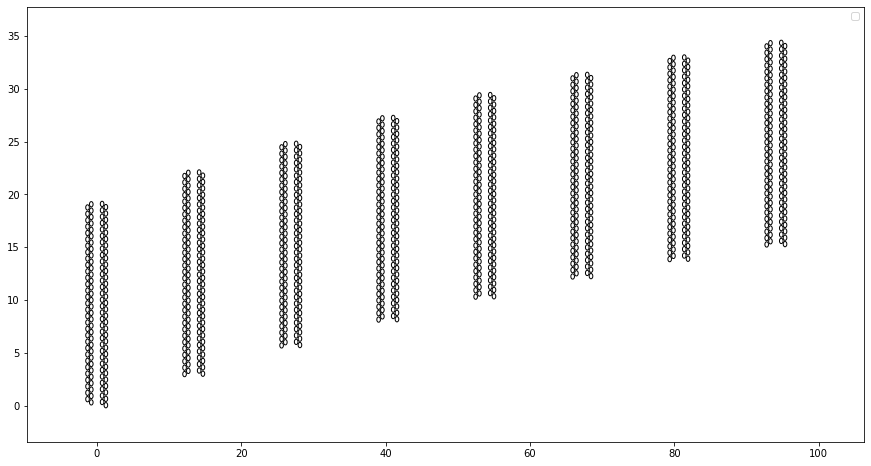

In [6]:
display_event(tracker)

## Read in the synthetic events

In [7]:
import pickle

synthetic_dir='/Users/ekargian/Library/Mobile Documents/com~apple~CloudDocs/Documents/g-2/Trackers/ML_tracking/synthetic_data/pkl/'
events_file=open(synthetic_dir+'synthetic_events_WithSingles.pkl','rb')
evts_hits,evts_ids = pickle.load(events_file,encoding='latin1')

In [8]:
evts_hits.shape

(55116, 32, 32)

In [9]:
np.where(evts_hits[-1]>0)

(array([16, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]),
 array([31, 31, 30, 28, 27, 26, 27, 24, 23, 22, 23, 20, 19, 18]))

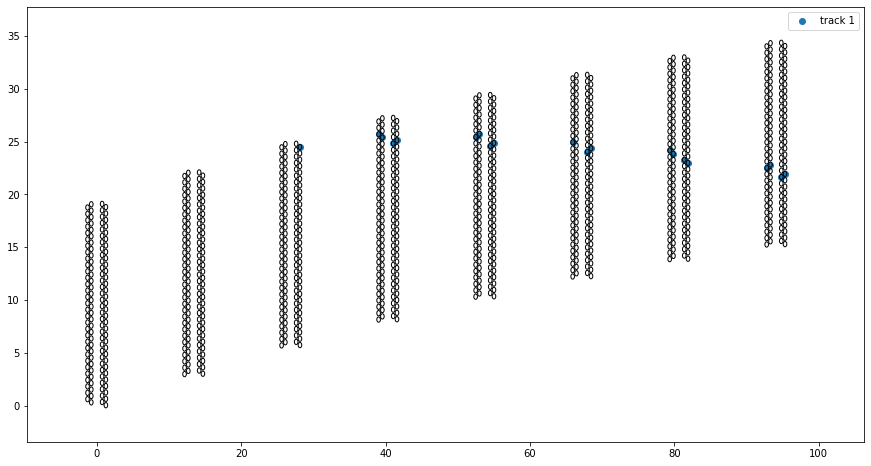

In [9]:
for i_evt in range(1,2):
    display_event(tracker,evts_hits[i_evt],evts_ids[i_evt])

## Generate seeds

### Without truth information

Get all pure-appearing seeds within a time window, without using truth information.  
To be used for processing events to be predicted.

In [10]:
def remove_nearby(hit_straws, unique_within=2):
    '''
    Remove all hits in layer that are closer together than allowed
    unique_within=4 #in each layer the hit must be unique within +-4 straws
    ## Note that just removing them and then looking for seeds, can give some unpure seeds.
    ## But for crosstalk and noise could be best approach.
    '''
    hit_straws=np.array(hit_straws)
    for straw in hit_straws:
        other_straws=[i for i in hit_straws if i!=straw]
        if (abs(other_straws-straw)<=unique_within).any():
            ## found hits nearby, remove them
            hit_straws=hit_straws[np.where( abs(hit_straws-straw)>unique_within)]
    return hit_straws

In [11]:
def get_next_layer_candidates(layer_hits, previous_layer_hit, max_diff=2):
    '''
    Get all candidate hits (should be 1 at most, as this should be applied after nearby hits are removed)
    that could physically belong to the same track as the hit in the previous layer,
    by checking that they are within the allowed max-diff.
    Returned list should have a length of 0 or 1.
    '''
    layer_hits=[hit for hit in layer_hits if abs(hit-previous_layer_hit)<=max_diff]
    return layer_hits
    

In [12]:
def accept_seed_candidate(candidate_hits,rms_cutoff=1):
    '''
    Accept or reject a seed candidate based on its RMS
    *** For now this is not implemented, the max-diff requirement should be enough ***
    '''
    if np.std(candidate_hits)<rms_cutoff: return True
    else: return False

In [13]:
def get_first_layer_seeds(ix,iy,first_layer):
    """
    Get all seeds that have a hit in the first layer of a module.
    Parameters:
        ix,iy: x,y coordinates of all hits in the module
        first layer: id of 1st layer in module
    Returns:
        x,y coordinates for all hits in a seed, OR empty if no seeds found.
        the ix,iy but will all hits that have been entered in seeds removed.
    """
    
    seeds_xy=[]
    candidate_straw_0,candidate_straw_1,candidate_straw_2,candidate_straw_3=0,0,0,0

    candidate_straws_0 = iy[ np.where(ix==first_layer) ]
    candidate_straws_0=remove_nearby(candidate_straws_0)
    if len(candidate_straws_0)==0: return seeds_xy, (ix,iy)

    for candidate_straw_0 in candidate_straws_0:
        ## we have a hit from 1st layer, go on to 2nd layer
        candidate_straws_1 = iy[ np.where(ix==first_layer+1) ]
        candidate_straws_1 = remove_nearby(candidate_straws_1)
        candidate_straws_1 = get_next_layer_candidates(candidate_straws_1,candidate_straw_0)
        if len(candidate_straws_1)==0: 
            ## layer-1 missed, go on to layer-2
            candidate_straws_2 = iy[ np.where(ix==first_layer+2) ]
            candidate_straws_2 = remove_nearby(candidate_straws_2)
            candidate_straws_2 = get_next_layer_candidates(candidate_straws_2,candidate_straw_0)
            if len(candidate_straws_2)==0: 
                ## second layer without hit, drop candidate
                continue
            candidate_straw_2 = candidate_straws_2[0]
            ## hits in layers 0,2, move to layer 3
            candidate_straws_3 = iy[ np.where(ix==first_layer+3) ]
            candidate_straws_3 = remove_nearby(candidate_straws_3)
            candidate_straws_3 = get_next_layer_candidates(candidate_straws_3,candidate_straw_2)            
            if len(candidate_straws_3)==0: 
                ## second layer without hit, drop candidate
                continue
            candidate_straw_3 = candidate_straws_3[0]
            
            #if not accept_seed_candidate(candidate_y): continue
            ## accept seed candidate
            candidate_x=[first_layer, first_layer+2, first_layer+3]
            candidate_y=[candidate_straw_0, candidate_straw_2, candidate_straw_3]
            seed_xy = (candidate_x,candidate_y)
            seeds_xy+=[seed_xy]

        #if len(candidate_straws_1)==0:
        else:
            ## continue with layers 0,1 hit
            candidate_straw_1 = candidate_straws_1[0]
            ## go on to layer-2
            candidate_straws_2 = iy[ np.where(ix==first_layer+2) ]
            candidate_straws_2 = remove_nearby(candidate_straws_2)
            candidate_straws_2 = get_next_layer_candidates(candidate_straws_2,candidate_straw_0)
            if len(candidate_straws_2)==0: 
                ## layer-2 missed, go on to layer-3
                candidate_straws_3 = iy[ np.where(ix==first_layer+3) ]
                candidate_straws_3 = remove_nearby(candidate_straws_3)
                candidate_straws_3 = get_next_layer_candidates(candidate_straws_3,candidate_straw_1)            
                if len(candidate_straws_3)==0: 
                    ## second layer without hit, drop candidate
                    continue
                candidate_straw_3 = candidate_straws_3[0]

                #if not accept_seed_candidate(candidate_y): continue
                ## accept seed candidate
                candidate_x=[first_layer, first_layer+1, first_layer+3]
                candidate_y=[candidate_straw_0, candidate_straw_1, candidate_straw_3]
                seed_xy = (candidate_x,candidate_y)
                seeds_xy+=[seed_xy]

            #if len(candidate_straws_2)==0: 
            else:
                ## continue with layers 0,1,2 hit            
                candidate_straw_2 = candidate_straws_2[0]
                ## go on to layer-3
                candidate_straws_3 = iy[ np.where(ix==first_layer+3) ]
                candidate_straws_3 = remove_nearby(candidate_straws_3)
                candidate_straws_3 = get_next_layer_candidates(candidate_straws_3,candidate_straw_2)            
                if len(candidate_straws_3)==0:
                    ## we missed the last layer, but we are accepting the seed anyway from the previous 3 layers
                    #if not accept_seed_candidate(candidate_y): continue
                    ## accept seed candidate
                    candidate_x=[first_layer, first_layer+1, first_layer+2]
                    candidate_y=[candidate_straw_0, candidate_straw_1, candidate_straw_2] 
                    seed_xy = (candidate_x,candidate_y)
                    seeds_xy+=[seed_xy]
                else:
                    candidate_straw_3 = candidate_straws_3[0]
                    #if not accept_seed_candidate(candidate_y): continue
                    ## accept seed candidate
                    candidate_x=[first_layer, first_layer+1, first_layer+2, first_layer+3]
                    candidate_y=[candidate_straw_0, candidate_straw_1, candidate_straw_2, candidate_straw_3] 
                    seed_xy = (candidate_x,candidate_y)
                    seeds_xy+=[seed_xy]

    ## finished processing module, return found seeds
    ## also return hit coordinates, after removing hits in seeds (so they can be entered in the 2nd-layer seed finder)
    for seed_xy in seeds_xy:
        seed_x,seed_y=seed_xy
        for iseed,iseed_x in enumerate(seed_x):
            iseed_y=seed_y[iseed]
            for ihit,ihit_x in enumerate(ix):
                ihit_y=iy[ihit]
                if (ihit_x==iseed_x) & (ihit_y==iseed_y):
                    ix=np.delete(ix,ihit)
                    iy=np.delete(iy,ihit)
                    break
    remaining_xy=(ix,iy)
    return seeds_xy, remaining_xy



In [14]:
def get_second_layer_seeds(ix,iy,first_layer):
    """
    Get all seeds that have a hit in the second layer of a module.
    Assumes that all hits from seeds found beginning in 1st layer have been removed.
    Parameters:
        ix,iy: x,y coordinates of **remaining** hits in the module
        first layer: id of 1st layer in module
    Returns:
        x,y coordinates for all hits in a seed, OR empty if no seeds found.
    """
    
    seeds_xy=[]
    candidate_straw_1,candidate_straw_2,candidate_straw_3=0,0,0

    candidate_straws_1 = iy[ np.where(ix==first_layer+1) ]
    candidate_straws_1=remove_nearby(candidate_straws_1)
    if len(candidate_straws_1)==0: return seeds_xy

    for candidate_straw_1 in candidate_straws_1:
        ## we have a hit from 2nd layer, go on to 3rd layer
        candidate_straws_2 = iy[ np.where(ix==first_layer+2) ]
        candidate_straws_2 = remove_nearby(candidate_straws_2)
        candidate_straws_2 = get_next_layer_candidates(candidate_straws_2,candidate_straw_1)
        if len(candidate_straws_2)==0: return seeds_xy
        candidate_straw_2 = candidate_straws_2[0]
        ## go on to layer-3
        candidate_straws_3 = iy[ np.where(ix==first_layer+3) ]
        candidate_straws_3 = remove_nearby(candidate_straws_3)
        candidate_straws_3 = get_next_layer_candidates(candidate_straws_3,candidate_straw_2)
        if len(candidate_straws_3)==0: return seeds_xy
        ## layers 1,2,3 hit, accept candidate
        candidate_straw_3 = candidate_straws_3[0]
        #if not accept_seed_candidate(candidate_y): continue
        candidate_x=[first_layer+1, first_layer+2, first_layer+3]
        candidate_y=[candidate_straw_1, candidate_straw_2, candidate_straw_3] 
        seed_xy = (candidate_x,candidate_y)
        seeds_xy+=[seed_xy]

    ## finished processing module, return found seeds
    return seeds_xy




In [15]:
def make_real_seeds(evt_hits):
    """
    Get all pure-appearing seeds within a time window.
    Makes no use of truth information.
    Parameters:
        evt_hits: 2D array of seeds within a window
    Returns:
        An array with x,y coordinates of all seeds.
        A 2D array (same dimension as hits) with all seed hits.
        
    """

    ## For now assume as hard-coded (this can be easily amended by passing the detector)
    n_modules=8 ## number of modules, each with 4 layers of straws
    n_layersPerModule=4
        
    seeds_xy=[]
    evt_seeds = np.zeros_like(evt_hits)
    
    ## layer/straw for all hits in event
    hit_x,hit_y = np.where(evt_hits>0)
    
    ## iterate over all modules, find seeds that fulfill requirements
    for i_module in range(n_modules):
        first_layer = n_layersPerModule*i_module
        # get hits on this module
        mask = (hit_x>=first_layer) & (hit_x<first_layer+n_layersPerModule)
        ix,iy= hit_x[mask], hit_y[mask]
        if len(ix)<3: continue
        # get seeds that start in 1st layer of this module
        module_seeds_xy, remaining_hits = get_first_layer_seeds(ix,iy,first_layer)
        if len(module_seeds_xy)>0:
            seeds_xy+=module_seeds_xy
            for module_seed_xy in module_seeds_xy:
                seed_x,seed_y=module_seed_xy
                evt_seeds[(seed_x,seed_y)]=1
        # then get seeds starting in the 2nd layer
        remaining_x,remaining_y = remaining_hits
        module_seeds_xy = get_second_layer_seeds(remaining_x,remaining_y,first_layer)
        if len(module_seeds_xy)>0:
            seeds_xy+=module_seeds_xy
            for module_seed_xy in module_seeds_xy:
                seed_x,seed_y=module_seed_xy
                evt_seeds[(seed_x,seed_y)]=1

    return seeds_xy, evt_seeds

No handles with labels found to put in legend.


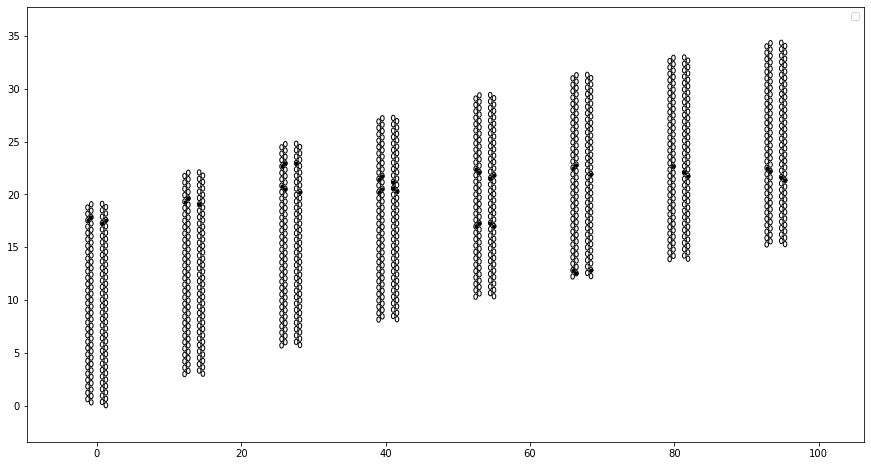

[([0, 1, 2, 3], [29, 29, 28, 29]), ([4, 5, 6], [27, 27, 26]), ([8, 9, 11], [25, 24, 24]), ([8, 9, 10], [28, 28, 28]), ([16, 17, 18, 19], [11, 11, 11, 11]), ([16, 17, 18, 19], [20, 19, 18, 19]), ([20, 21, 23], [1, 0, 1]), ([20, 21, 23], [17, 17, 16]), ([25, 26, 27], [14, 13, 13]), ([28, 29, 30, 31], [12, 11, 10, 10])]


No handles with labels found to put in legend.


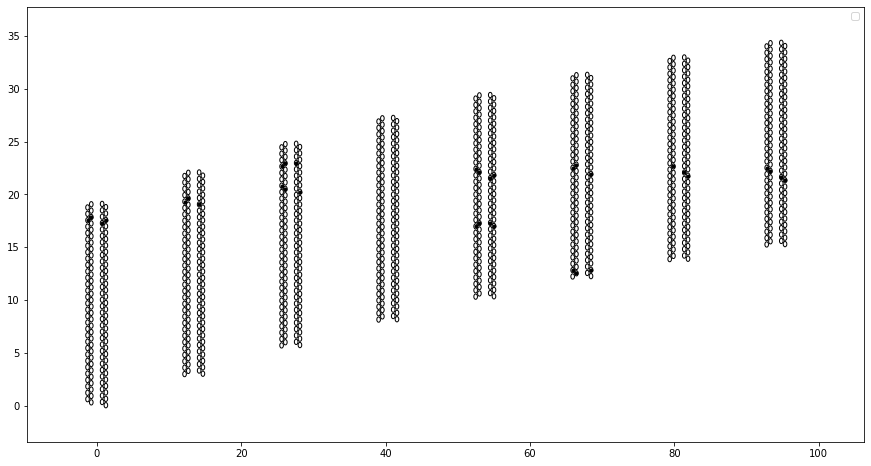

In [16]:
i_evt=6
display_event(tracker, evts_hits[i_evt])
seeds_xy,seeds = make_real_seeds(evts_hits[i_evt])
print(seeds_xy)
display_event(tracker, seeds)

In [18]:
x,y=seeds_xy[0]
evts_ids[i_evt][x[0]][y[0]]

2.0

In [19]:
for i,seed_xy in enumerate(seeds_xy):
    xv,yv=seed_xy
    print('For seed#', i)
    print(' hits :: ', xv,yv)
    track_id=evts_ids[i_evt][xv[0]][yv[0]]
    print(' belongs with track #', track_id)
    
    extra_seeds_xy=[]
    for extra_seed_xy in seeds_xy:
        if extra_seed_xy==seed_xy: continue
        if evts_ids[i_evt][extra_seed_xy[0][0]][extra_seed_xy[1][0]]==track_id: extra_seeds_xy+=[extra_seed_xy]
    n_extra_seeds = len(extra_seeds_xy)
    print(' %d extra seeds from same track :: \n'%n_extra_seeds, extra_seeds_xy)
    extra_seed_id1,extra_seed_id2=np.random.choice(n_extra_seeds,size=2, replace=False)
    print(' random extra seed from same track :: ', extra_seeds_xy[extra_seed_id1])
    print(' random extra seed from same track :: ', extra_seeds_xy[extra_seed_id2])
    
        



For seed# 0
 hits ::  [0, 1, 2, 3] [29, 29, 28, 29]
 belongs with track # 2.0
 6 extra seeds from same track :: 
 [([4, 5, 6], [27, 27, 26]), ([8, 9, 11], [25, 24, 24]), ([16, 17, 18, 19], [20, 19, 18, 19]), ([20, 21, 23], [17, 17, 16]), ([25, 26, 27], [14, 13, 13]), ([28, 29, 30, 31], [12, 11, 10, 10])]
 random extra seed from same track ::  ([25, 26, 27], [14, 13, 13])
 random extra seed from same track ::  ([4, 5, 6], [27, 27, 26])
For seed# 1
 hits ::  [4, 5, 6] [27, 27, 26]
 belongs with track # 2.0
 6 extra seeds from same track :: 
 [([0, 1, 2, 3], [29, 29, 28, 29]), ([8, 9, 11], [25, 24, 24]), ([16, 17, 18, 19], [20, 19, 18, 19]), ([20, 21, 23], [17, 17, 16]), ([25, 26, 27], [14, 13, 13]), ([28, 29, 30, 31], [12, 11, 10, 10])]
 random extra seed from same track ::  ([28, 29, 30, 31], [12, 11, 10, 10])
 random extra seed from same track ::  ([25, 26, 27], [14, 13, 13])
For seed# 2
 hits ::  [8, 9, 11] [25, 24, 24]
 belongs with track # 2.0
 6 extra seeds from same track :: 
 [([

## NN model

In [16]:
import keras
import pandas as pd

In [37]:
from sklearn.base import BaseEstimator
from statistics import mode


class Clusterer(BaseEstimator):
    def __init__(self, 
                 hidden_dim=50, batch_size=128, n_epochs=5, 
                 val_frac=0.1, detector=tracker):
        """
        LSTM model example.
        TODO: fill in more details.
        """
        self.hidden_dim = hidden_dim
        self.batch_size = batch_size
        self.n_epochs = n_epochs
        self.val_frac = val_frac
        self.detector=detector
        self.nstraws_perlayer = 6 # max number of straw hits per layer (including "0", ie no hits from the track in this layer)
        
        if False: '''
        self.model=None
        self.train_input = None
        self.train_target = None
        self.prepared = False     
        
        Instead, prepare 3 models, one for each region of the detector where a seed is located
        -- front, middle, back.
        '''
        
        self.model={}
        self.train_input = {}
        self.train_target = {}
        self.prepared = {}    
        self.history = {}    
        
        

    def build_model(self, 
                    model_structure='LSTMx2_Dropout',
                    loss='binary_crossentropy',## the HEPTrkX code was using categorical_ce
                    optimizer='Nadam', metrics=['accuracy']):
        n_hidden=self.hidden_dim
        length=self.detector.n_layers
        width=self.nstraws_perlayer
        ## flatten the hits/seeds for each straw into a single dimension of 2*width elements
        inputs = keras.layers.Input(shape=(length, 2*width))
        hidden_1, dropout_1, hidden_2, extra_dense, outputs = {},{},{},{},{}
        for seed_location in ['front','middle','back']:

            ##bi-directional LSTM layer:
            hidden_1[seed_location] = keras.layers.Bidirectional(keras.layers.LSTM(n_hidden, return_sequences=True))(inputs)
            ## could try adding more LSTM layers, with dropout inbetween to prevent overfitting
            if ('LSTMx2' in model_structure) and ('Dropoutx2' in model_structure):
                print('Model structure: LSTMx2, Dropoutx2')
                dropout_1[seed_location] = keras.layers.Dropout(0.2)(hidden_1[seed_location])
                hidden_2[seed_location] = keras.layers.Bidirectional(keras.layers.LSTM(n_hidden, return_sequences=True))(dropout_1[seed_location])
                ## for some very weird reason, adding the 2nd dropout layer crashes on my machine...
                dropout_2[seed_location] = keras.layers.Dropout(0.2)(hidden_2)
                outputs[seed_location] = keras.layers.TimeDistributed( keras.layers.Dense(width+1, activation='softmax'))(dropout_2[seed_location])
            elif ('LSTMx2' in model_structure) and ('Dropout' in model_structure):
                print('Model structure: LSTMx2, Dropout')
                dropout_1[seed_location] = keras.layers.Dropout(0.2)(hidden_1[seed_location])
                hidden_2[seed_location] = keras.layers.Bidirectional(keras.layers.LSTM(n_hidden, return_sequences=True))(dropout_1[seed_location])
                #dropout_2[seed_location] = keras.layers.Dropout(0.2)(hidden_2)
                outputs[seed_location] = keras.layers.TimeDistributed( keras.layers.Dense(width+1, activation='softmax'))(hidden_2[seed_location])
            elif ('LSTMx2' in model_structure) and ('Dropout' not in model_structure) and ('ExtraDense' in model_structure):
                print('Model structure: LSTMx2, ExtraDense, no Dropout')
                hidden_2[seed_location] = keras.layers.Bidirectional(keras.layers.LSTM(n_hidden, return_sequences=True))(hidden_1[seed_location])
                extra_dense[seed_location] = keras.layers.TimeDistributed( keras.layers.Dense(100, activation='relu'))(hidden_2[seed_location])
                outputs[seed_location] = keras.layers.Dense(width+1, activation='softmax')(extra_dense[seed_location])
            elif ('LSTMx2' in model_structure) and ('Dropout' not in model_structure):
                print('Model structure: LSTMx2, no Dropout')
                hidden_2[seed_location] = keras.layers.Bidirectional(keras.layers.LSTM(n_hidden, return_sequences=True))(hidden_1[seed_location])
                outputs[seed_location] = keras.layers.TimeDistributed( keras.layers.Dense(width+1, activation='softmax'))(hidden_2[seed_location])
            else:
                outputs[seed_location] = hidden_1[seed_location]

            self.model[seed_location] = keras.Model(inputs, outputs[seed_location])
            self.model[seed_location].compile(loss=loss, optimizer=optimizer, metrics=metrics)            
          
    '''
    Can we make loss function give bigger weight to events with many hits?
    That would train the model to deal with complexity.
    
    Also consider "momentum acceleration" or other modifications of learning rate for better convergence.
    '''

        
    def prepare_training_data(self, evts_hits, evts_ids):
        """
        Prepare training data. 
        Reads in 3D arrays of hits and ids in many event windows.
        The 1st dimension is the event number.
        The hits and ids within each window  are of the same shape: (length,width).
        Within each window generate seeds.
        *** In this iteration, seeds are genrated anywhere in the tracker, and multiple per track ***
        The input will be of shape (n_seeds, length, width)
        """
        #if self.prepared: return
        #self.prepared = True
        
        n_events = evts_hits.shape[0]
        max_seeds = n_events * self.detector.max_tracks * self.detector.n_modules / 2 # divide by 2 since seeds are split in ~3
        print_freq = int(max_seeds / 20)

        holder_input, holder_target={},{}
        n_seeds={} # this will be a counter for seeds we find
        for seed_location in ['front','middle','back']:
            holder_input[seed_location] = np.zeros((int(max_seeds), 
                                                    self.detector.n_layers, 
                                                    2*self.nstraws_perlayer))
            holder_target[seed_location] = np.zeros((int(max_seeds), 
                                                     self.detector.n_layers, 
                                                     self.nstraws_perlayer+1))
            n_seeds[seed_location]=0
    
        ## Iterate over all windows (events)
        for i_evt in range(n_events):

            ## All hits coordinates in this event
            allhits_layers,allhits_straws=np.where(evts_hits[i_evt]>0)

            ## Get all seeds in this event
            seeds_xy, seeds_array=make_real_seeds(evts_ids[i_evt])
            if len(seeds_xy)==0: continue  
            
            ## Step through each module
            for i_module in range(self.detector.n_modules):

                if i_module<=2: seed_location='front'
                elif i_module<=4: seed_location='middle'
                else: seed_location='back' 
                
                ## Get seeds in this module
                module_seeds_xy = [seed_xy for seed_xy in seeds_xy if (
                    (seed_xy[0][0]>=i_module*4) & (seed_xy[0][0]<i_module*4+4) )]
                if len(module_seeds_xy)==0: continue

                for seed_xy in module_seeds_xy:
                    ## format input for this seed     
                    
                    # array for hits per layer:
                    # this will randomize where hit coordinates appear in the NN input, to avoid bias
                    ihit_perlayer=np.zeros(shape=(self.detector.n_layers,self.nstraws_perlayer)).astype(int)
                                    
                    ## first turn on the seed hits after finding their (layer,straw) location
                    seed_layers,seed_straws = seed_xy
                    for i,ilayer in enumerate(seed_layers):
                        istraw=seed_straws[i]
                        ## get the randomized input index for this hit
                        ihit_index = np.random.choice( np.array( np.where(ihit_perlayer[ilayer]==0)[0] ))
                        ## turn on both hits and seeds elements
                        holder_input[seed_location][n_seeds[seed_location]][ilayer][ihit_index] = istraw+1
                        holder_input[seed_location][n_seeds[seed_location]][ilayer][self.nstraws_perlayer+ihit_index] = 1
                        ## turn on that straw location at the output
                        holder_target[seed_location][n_seeds[seed_location]][ilayer][ihit_index+1] = 1
                        ## increment i_hit in this layer
                        ihit_perlayer[ilayer][ihit_index]=1

                    ## now get the track id that corresponds to this track
                    ## to identify the hits in other layers that also belong to the same track
                    seed_ids = evts_ids[i_evt][seed_layers,seed_straws]
                    if (seed_ids==seed_ids[0]).sum() == len(seed_ids):
                        # all hits in seed belong to same track
                        seed_id = seed_ids[0]
                    else: 
                        # oops, at least some hits are false.
                        # could get the track most encountered with eg: mode(seed_ids)
                        # but best to skip this seed from training for now, after we turn off all hits again
                        holder_input[seed_location][n_seeds[seed_location]] = np.zeros(
                            (self.detector.n_layers, 
                             2*self.nstraws_perlayer) )
                        continue
                    track_layers,track_straws=np.where((evts_ids[i_evt]==seed_id))

                    ## now turn on the input for all hits from different modules in the event
                    ## and also at the output for those hits from the same track
                    not_module_mask = (allhits_layers<4*i_module) | (allhits_layers>=4*i_module+4)
                    ilayers,istraws=allhits_layers[not_module_mask], allhits_straws[not_module_mask] # this excludes hits from the same module as the seed 
                    for i,ilayer in enumerate(ilayers):
                        istraw=istraws[i]
                        ihit_index = np.random.choice( np.array( np.where(ihit_perlayer[ilayer]==0)[0] ))
                        holder_input[seed_location][n_seeds[seed_location]][ilayer][ihit_index] = istraw+1
                        if evts_ids[i_evt][ilayer][istraw]==seed_id:
                            holder_target[seed_location][n_seeds[seed_location]][ilayer][ihit_index+1] = 1
                        ## increment i_hit in this layer
                        ihit_perlayer[ilayer][ihit_index]=1
                    
                    ## finally for layers that didn't have a track hit, set the target to the 0th feature
                    for ilayer in range(self.detector.n_layers):
                        if ilayer not in track_layers:
                            holder_target[seed_location][n_seeds[seed_location]][ilayer][0] = 1

                    ## finished processing this seed, increment
                    n_seeds[seed_location] += 1
                    if (n_seeds[seed_location] % print_freq == 0):
                        print (' Processing seed #%d in detector-%s' % (n_seeds[seed_location], seed_location) )

        print ('\nTotal seeds processed per location: ', n_seeds)
              
        ## Now remove all the extra array dimensions, keep only n_seeds
        for seed_location in ['front','middle','back']:
            self.train_input[seed_location] = holder_input[seed_location][:n_seeds[seed_location],:,:]
            self.train_target[seed_location] = holder_target[seed_location][:n_seeds[seed_location],:,:]
        


        
    def prepare_training_data_multiseed(self, evts_hits, evts_ids):
        """
        Prepare training data. 
        Reads in 3D arrays of hits and ids in many event windows.
        The 1st dimension is the event number.
        The hits and ids within each window  are of the same shape: (length,width).
        Within each window generate seeds.
        *** In this iteration, generate multiple inputs per seed, with multiple seeds passed at input ***
        The input will be of shape ([n_seeds*several], length, width)
        """
        #if self.prepared: return
        #self.prepared = True
        
        n_events = evts_hits.shape[0]
        max_seeds = n_events * self.detector.max_tracks * self.detector.n_modules * 5 # guesstimate 5 multi-seed combinations per seed
        print_freq = int(max_seeds / 20)

        holder_input, holder_target={},{}
        n_inputs={} # this will be a counter for model inputs, potentially multiple per seed
        for seed_location in ['front','middle','back']:
            holder_input[seed_location] = np.zeros((int(max_seeds), 
                                                    self.detector.n_layers, 
                                                    2*self.nstraws_perlayer))
            holder_target[seed_location] = np.zeros((int(max_seeds), 
                                                     self.detector.n_layers, 
                                                     self.nstraws_perlayer+1))
            n_inputs[seed_location]=0
    
        ## Iterate over all windows (events)
        for i_evt in range(n_events):

            ## All hits coordinates in this event
            allhits_layers,allhits_straws=np.where(evts_hits[i_evt]>0)

            ## Get all seeds in this event
            seeds_xy, seeds_array=make_real_seeds(evts_ids[i_evt])
            if len(seeds_xy)==0: continue  
            
            ## Step through each module
            for i_module in range(self.detector.n_modules):

                if i_module<=2: seed_location='front'
                elif i_module<=4: seed_location='middle'
                else: seed_location='back' 
                
                ## Get seeds in this module
                module_seeds_xy = [seed_xy for seed_xy in seeds_xy if (
                    (seed_xy[0][0]>=i_module*4) & (seed_xy[0][0]<i_module*4+4) )]
                if len(module_seeds_xy)==0: continue

                for seed_xy in module_seeds_xy:
                    ## format input for this seed     
                    
                    # array for hits per layer:
                    # this will randomize where hit coordinates appear in the NN input, to avoid bias
                    ihit_perlayer=np.zeros(shape=(self.detector.n_layers,self.nstraws_perlayer)).astype(int)
                                    
                    ## first turn on the seed hits after finding their (layer,straw) location
                    seed_layers,seed_straws = seed_xy
                    for i,ilayer in enumerate(seed_layers):
                        istraw=seed_straws[i]
                        ## get the randomized input index for this hit
                        ihit_index = np.random.choice( np.array( np.where(ihit_perlayer[ilayer]==0)[0] ))
                        ## turn on both hits and seeds elements
                        holder_input[seed_location][n_inputs[seed_location]][ilayer][ihit_index] = istraw+1
                        holder_input[seed_location][n_inputs[seed_location]][ilayer][self.nstraws_perlayer+ihit_index] = 1
                        ## turn on that straw location at the output
                        holder_target[seed_location][n_inputs[seed_location]][ilayer][ihit_index+1] = 1
                        ## increment i_hit in this layer
                        ihit_perlayer[ilayer][ihit_index]=1

                    ## now get the track id that corresponds to this track
                    ## to identify the hits in other layers that also belong to the same track
                    seed_ids = evts_ids[i_evt][seed_layers,seed_straws]
                    if (seed_ids==seed_ids[0]).sum() == len(seed_ids):
                        # all hits in seed belong to same track
                        seed_id = seed_ids[0]
                    else: 
                        # oops, at least some hits are false.
                        # could get the track most encountered with eg: mode(seed_ids)
                        # but best to skip this seed from training for now, after we turn off all hits again
                        holder_input[seed_location][n_inputs[seed_location]] = np.zeros(
                            (self.detector.n_layers, 
                             2*self.nstraws_perlayer) )
                        continue
                    track_layers,track_straws=np.where((evts_ids[i_evt]==seed_id))

                    ## now turn on the input for all hits from different modules in the event
                    ## and also at the output for those hits from the same track
                    not_module_mask = (allhits_layers<4*i_module) | (allhits_layers>=4*i_module+4)
                    ilayers,istraws=allhits_layers[not_module_mask], allhits_straws[not_module_mask] # this excludes hits from the same module as the seed 
                    for i,ilayer in enumerate(ilayers):
                        istraw=istraws[i]
                        ihit_index = np.random.choice( np.array( np.where(ihit_perlayer[ilayer]==0)[0] ))
                        holder_input[seed_location][n_inputs[seed_location]][ilayer][ihit_index] = istraw+1
                        if evts_ids[i_evt][ilayer][istraw]==seed_id:
                            holder_target[seed_location][n_inputs[seed_location]][ilayer][ihit_index+1] = 1
                        ## increment i_hit in this layer
                        ihit_perlayer[ilayer][ihit_index]=1
                    
                    ## finally for layers that didn't have a track hit, set the target to the 0th feature
                    for ilayer in range(self.detector.n_layers):
                        if ilayer not in track_layers:
                            holder_target[seed_location][n_inputs[seed_location]][ilayer][0] = 1
                            
                            
                    ### now form extra inputs from seed combinations
                    ## first get all seeds from the same track
                    extra_seeds_xy=[]
                    for extra_seed_xy in seeds_xy:
                        if extra_seed_xy==seed_xy: continue
                        if evts_ids[i_evt][extra_seed_xy[0][0]][extra_seed_xy[1][0]]==seed_id: extra_seeds_xy+=[extra_seed_xy]
                    n_extra_seeds = len(extra_seeds_xy)
                    
                    if n_extra_seeds==0: 
                        #print('no extra seeds, continuing')
                        n_inputs[seed_location] += 1
                        if (n_inputs[seed_location] % print_freq == 0):
                            print (' Processing seed #%d in detector-%s' % (n_inputs[seed_location], seed_location) )
                        continue
                    if n_extra_seeds==1: extra_seed_id1,extra_seed_id2=0,0
                    else: extra_seed_id1,extra_seed_id2=np.random.choice(n_extra_seeds,size=2, replace=False)
                    #print ('processing %d extra seeds'% n_extra_seeds)
                    #print('2 extra seed ids selected : ', extra_seed_id1, extra_seed_id2)
                    
                    ### set the first extra input with another seed
                    #print('processing 1st seed id ', extra_seed_id1)
                    n_extra_inputs=1
                    holder_input[seed_location][n_inputs[seed_location]+n_extra_inputs] = holder_input[seed_location][n_inputs[seed_location]]
                    ## turn on the extra seed locations
                    extra_seed_layers,extra_seed_straws = extra_seeds_xy[extra_seed_id1]
                    for i,ilayer in enumerate(extra_seed_layers):
                        istraw=extra_seed_straws[i]
                        #print('input for this layer : ', holder_input[seed_location][n_inputs[seed_location]][ilayer])
                        ihit_index = np.where( holder_input[seed_location][n_inputs[seed_location]][ilayer] == istraw+1 )[0]
                        #print('ihit index found : ', ihit_index)
                        holder_input[seed_location][n_inputs[seed_location]+n_extra_inputs][ilayer][self.nstraws_perlayer+ihit_index] = 1
                    ## finally copy the target
                    holder_target[seed_location][n_inputs[seed_location]+n_extra_inputs] = holder_target[seed_location][n_inputs[seed_location]]
                     
                    if n_extra_seeds==1: 
                        #print('continuing after 1 extra seed')
                        n_inputs[seed_location] += 2
                        if (n_inputs[seed_location] % print_freq == 0):
                            print (' Processing seed #%d in detector-%s' % (n_inputs[seed_location], seed_location) )
                        continue
                    ### now set a 3rd input with yet another seed
                    #print('processing 2nd seed id ', extra_seed_id2)
                    n_extra_inputs=2
                    holder_input[seed_location][n_inputs[seed_location]+n_extra_inputs] = holder_input[seed_location][n_inputs[seed_location]+1]
                    ## turn on the extra seed locations
                    extra_seed_layers,extra_seed_straws = extra_seeds_xy[extra_seed_id2]
                    for i,ilayer in enumerate(extra_seed_layers):
                        istraw=extra_seed_straws[i]
                        ihit_index = np.where( holder_input[seed_location][n_inputs[seed_location]][ilayer] == istraw+1 )[0]
                        holder_input[seed_location][n_inputs[seed_location]+n_extra_inputs][ilayer][self.nstraws_perlayer+ihit_index] = 1
                    ## finally copy the target
                    holder_target[seed_location][n_inputs[seed_location]+n_extra_inputs] = holder_target[seed_location][n_inputs[seed_location]]
                    
                    if n_extra_seeds==2: 
                        #print('continuing after 2 extra seeds')
                        n_inputs[seed_location] += 3
                        if (n_inputs[seed_location] % print_freq == 0):
                            print (' Processing seed #%d in detector-%s' % (n_inputs[seed_location], seed_location) )
                        continue
                    ### one last extra input with all seeds from this track
                    #print('processing last extra input with all seeds')
                    n_extra_inputs=3
                    holder_input[seed_location][n_inputs[seed_location]+n_extra_inputs] = holder_input[seed_location][n_inputs[seed_location]+2]
                    ## turn on the extra seed locations
                    for i_extra_seed,extra_seed_xy in enumerate(extra_seeds_xy):
                        if i_extra_seed in [extra_seed_id1, extra_seed_id2]: 
                            #print('skipping extra seed id ', i_extra_seed)
                            continue
                        extra_seed_layers,extra_seed_straws = extra_seed_xy
                        for i_extra_seed_hit,ilayer in enumerate(extra_seed_layers):
                            istraw=extra_seed_straws[i_extra_seed_hit]
                            ihit_index = np.where( holder_input[seed_location][n_inputs[seed_location]][ilayer] == istraw+1 )[0]
                            holder_input[seed_location][n_inputs[seed_location]+n_extra_inputs][ilayer][self.nstraws_perlayer+ihit_index] = 1
                    ## finally copy the target
                    holder_target[seed_location][n_inputs[seed_location]+n_extra_inputs] = holder_target[seed_location][n_inputs[seed_location]]


                    ## finished processing this seed, increment
                    #print('continuing after 3 extra seeds')
                    n_inputs[seed_location] += 4
                    if (n_inputs[seed_location] % print_freq == 0):
                        print (' Processing seed #%d in detector-%s' % (n_inputs[seed_location], seed_location) )


        print ('\nTotal seeds processed per location: ', n_inputs)
              
        ## Now remove all the extra array dimensions, keep only n_seeds
        for seed_location in ['front','middle','back']:
            self.train_input[seed_location] = holder_input[seed_location][:n_inputs[seed_location],:,:]
            self.train_target[seed_location] = holder_target[seed_location][:n_inputs[seed_location],:,:]
        

            

    def fit(self, evts_hits, evts_ids):
        #self.prepare_training_data_NoDF(evts_hits, evts_ids)
        self.prepare_training_data_multiseed(evts_hits, evts_ids)
        print('Starting training...')
        callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5,restore_best_weights=True)
        for seed_location in ['front','middle','back']:
            self.history[seed_location] = self.model[seed_location].fit(
                self.train_input[seed_location], self.train_target[seed_location],
                batch_size=self.batch_size, epochs=self.n_epochs,
                callbacks=[callback],
                validation_split=self.val_frac)

      
    def prepare_event_for_prediction(self, evt_hits):
        """
        After the model has been trained, we will want to predict individual events.
        This function processes the 2D arrays of individual events in the proper format for model.predict().
        Reads in the 2D array of hits in the event, of shape: (length,width).
        Generate real seeds from the event hits.
        *** In this iteration, seeds are genrated anywhere in the tracker, and multiple per track ***
        The input for prediction will be of shape (n_seeds, length, width)
        """
        
        ## All hits coordinates in this event
        allhits_layers,allhits_straws=np.where(evt_hits>0)

        ## First form seeds in the event
        seeds_xy, seeds_array=make_real_seeds(evt_hits)

        ## count seeds
        n_seeds={} 
        for seed_location in ['front','middle','back']:
            n_seeds[seed_location]=0
        module_seeds_xy={}
        ## Step through each module to count seeds
        for i_module in range(self.detector.n_modules):
            if i_module<=2: seed_location='front'
            elif i_module<=4: seed_location='middle'
            else: seed_location='back'
                
            module_seeds_xy[i_module] = [seed_xy for seed_xy in seeds_xy if (
                (seed_xy[0][0]>=i_module*4) & (seed_xy[0][0]<i_module*4+4) )]
            n_seeds[seed_location] += len(module_seeds_xy[i_module])
        
        model_input,i_seed={},{}
        ## Input format
        for seed_location in ['front','middle','back']:
            model_input[seed_location] = np.zeros((n_seeds[seed_location], 
                                                   self.detector.n_layers,  
                                                   2*self.nstraws_perlayer))
            i_seed[seed_location]=0 ## counter for seeds; must equal n_seeds eventually
        
        ## Step through each module to format input for each seed
        for i_module in range(self.detector.n_modules):
            if i_module<=2: seed_location='front'
            elif i_module<=4: seed_location='middle'
            else: seed_location='back'

            ## we already have seeds for each module, iterate through them
            for seed_xy in module_seeds_xy[i_module]:
                ## format input for this seed     

                # array for hits per layer:
                # this will randomize where hit coordinates appear in the NN input, to avoid bias
                ihit_perlayer=np.zeros(shape=(self.detector.n_layers,self.nstraws_perlayer)).astype(int)
                    
                ## first turn on the seed hits after finding their (layer,straw) location
                seed_layers,seed_straws = seed_xy
                for i,ilayer in enumerate(seed_layers):
                    istraw=seed_straws[i]
                    ihit_index = np.random.choice( np.array( np.where(ihit_perlayer[ilayer]==0)[0] ))
                    ## turn on both hits and seeds elements
                    model_input[seed_location][i_seed[seed_location]][ilayer][ihit_index] = istraw+1
                    model_input[seed_location][i_seed[seed_location]][ilayer][self.nstraws_perlayer+ihit_index] = 1
                    ## increment i_hit in this layer
                    ihit_perlayer[ilayer][ihit_index]=1

                ## now turn on all the hits from different modules in the event
                not_module_mask = (allhits_layers<4*i_module) | (allhits_layers>=4*i_module+4)
                ilayers,istraws=allhits_layers[not_module_mask], allhits_straws[not_module_mask] # this excludes hits from the same module as the seed 
                for i,ilayer in enumerate(ilayers):
                    istraw=istraws[i]
                    ihit_index = np.random.choice( np.array( np.where(ihit_perlayer[ilayer]==0)[0] ))
                    model_input[seed_location][i_seed[seed_location]][ilayer][ihit_index] = istraw+1
                    ## increment i_hit in this layer
                    ihit_perlayer[ilayer][ihit_index]=1
                    
                ## finished processing this seed, increment
                i_seed[seed_location] += 1
            
        return model_input
  


    def predict_seed(self, seed_input, seed_location):
        """
        Predict seed for the given model_input, ie single input/prediction.
        Format output in same format as evt_hits, ie shape=(n_layers,n_straws)
        """
        
        ## model output, of shape (n_layers, nstraws_perlayer)
        model_output = tracker_NN.model[seed_location].predict(seed_input)
        
        seed_prediction = np.zeros((self.detector.n_layers, self.detector.n_straws))
        
        for ilayer in range(self.detector.n_layers):
            for ihitstraw in range(self.nstraws_perlayer):
                istraw = seed_input[ilayer][ihitstraw]
                seed_prediction[ilayer][istraw] = model_output[ilayer][ihitstraw+1]
        
        return seed_prediction
    

    def predict_event(self, evt_hits): 
        """
        Read in event (time window) with all hits.
        Return full prediction for all seeds in event.
        """
        model_input = self.prepare_event_for_prediction(evt_hits)
        #print('model_input: \n', model_input)

        n_seeds,model_output,event_prediction={},{},{}
        for seed_location in ['front','middle','back']:
            n_seeds[seed_location]=model_input[seed_location].shape[0]
            print('%d seeds in %s' % (n_seeds[seed_location],seed_location))
            if n_seeds[seed_location]==0:
                event_prediction[seed_location]=np.array([])
                continue
            ## get model output for all seeds
            model_output[seed_location] = self.model[seed_location].predict(model_input[seed_location])
            #print('model_output: \n', model_output[seed_location])
            print(model_output[seed_location].shape)

            ## package output into full prediction, in 32x32 array
            event_prediction[seed_location]=np.zeros( (n_seeds[seed_location],
                                                       self.detector.n_layers, self.detector.n_straws))
            for i_seed in range(n_seeds[seed_location]):
                for ilayer in range(self.detector.n_layers):
                    for ihitstraw in range(self.nstraws_perlayer):
                        istraw = model_input[seed_location][i_seed][ilayer][ihitstraw].astype(int)-1
                        event_prediction[seed_location][i_seed][ilayer][istraw] = model_output[seed_location][i_seed][ilayer][ihitstraw+1]

        return event_prediction


# Build and train

In [38]:
tracker_NN=Clusterer(hidden_dim=100,
                     batch_size=100, 
                     n_epochs=40, val_frac=0.1, detector=tracker)


In [30]:
def draw_train_history(history, draw_val=True, figsize=(12,5)):
    """Make plots of training and validation losses and accuracies"""
    for seed_location in ['front','middle','back']:
        plt.figure(figsize=figsize)
        # Plot loss
        plt.subplot(121)
        plt.plot(history[seed_location].epoch, history[seed_location].history['loss'], label='Training set')
        if draw_val:
            plt.plot(history[seed_location].epoch, history[seed_location].history['val_loss'], label='Validation set')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Training loss')
        plt.legend()
        plt.subplot(122)
        plt.plot(history[seed_location].epoch, history[seed_location].history['accuracy'], label='Training set')
        if draw_val:
            plt.plot(history[seed_location].epoch, history[seed_location].history['val_accuracy'], label='Validation set')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        #plt.ylim((0, 1))
        plt.title('Training accuracy')
        plt.legend(loc=0)
        plt.tight_layout()




In [31]:
from sklearn.model_selection import train_test_split
evts_hits_train, evts_hits_valid, evts_ids_train, evts_ids_valid = train_test_split(evts_hits,evts_ids, train_size=0.8)

In [32]:
evts_ids_valid.shape

(11024, 32, 32)

In [ ]:
## build model and train
tracker_NN.build_model(model_structure='LSTMx2_ExtraDense')
for seed_location in ['front','middle','back']:
    tracker_NN.model[seed_location].summary()

tracker_NN.fit(evts_hits_train, evts_ids_train)
draw_train_history(tracker_NN.history)

Model structure: LSTMx2, ExtraDense, no Dropout
Model structure: LSTMx2, ExtraDense, no Dropout
Model structure: LSTMx2, ExtraDense, no Dropout
Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 32, 12)]          0         
_________________________________________________________________
bidirectional_20 (Bidirectio (None, 32, 200)           90400     
_________________________________________________________________
bidirectional_21 (Bidirectio (None, 32, 200)           240800    
_________________________________________________________________
time_distributed_10 (TimeDis (None, 32, 100)           20100     
_________________________________________________________________
dense_11 (Dense)             (None, 32, 7)             707       
Total params: 352,007
Trainable params: 352,007
Non-trainable params: 0
_________________________________________

 Processing seed #104232 in detector-front

Total seeds processed per location:  {'front': 124823, 'middle': 144827, 'back': 174230}
Starting training...
Epoch 1/15
1124/1124 [==============================] - 201s 176ms/step - loss: 0.0137 - accuracy: 0.9828 - val_loss: 0.0141 - val_accuracy: 0.9822
Epoch 2/15
1124/1124 [==============================] - 215s 191ms/step - loss: 0.0109 - accuracy: 0.9868 - val_loss: 0.0141 - val_accuracy: 0.9824
Epoch 3/15
1124/1124 [==============================] - 208s 185ms/step - loss: 0.0098 - accuracy: 0.9885 - val_loss: 0.0141 - val_accuracy: 0.9827
Epoch 4/15
1124/1124 [==============================] - 209s 186ms/step - loss: 0.0087 - accuracy: 0.9903 - val_loss: 0.0151 - val_accuracy: 0.9811
Epoch 5/15
1124/1124 [==============================] - 206s 183ms/step - loss: 0.0087 - accuracy: 0.9903 - val_loss: 0.0149 - val_accuracy: 0.9828
Epoch 6/15
1124/1124 [==============================] - 201s 179ms/step - loss: 0.0074 - accuracy: 0.9921 

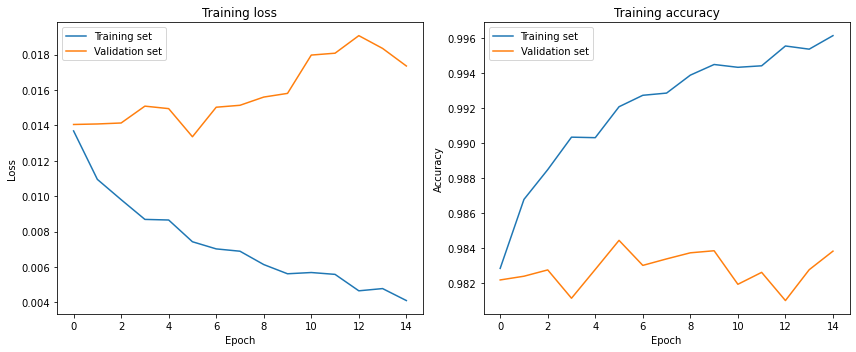

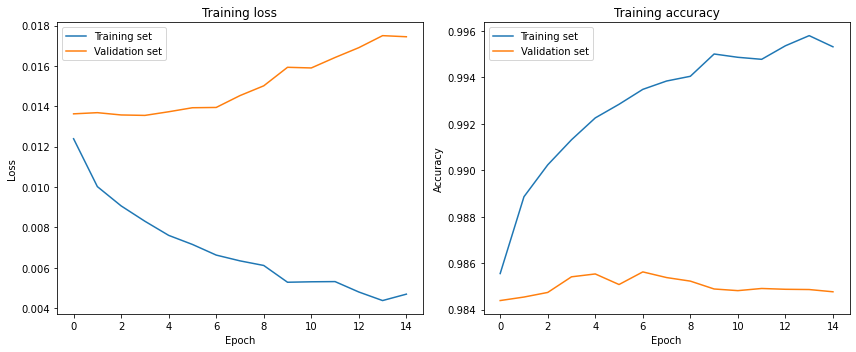

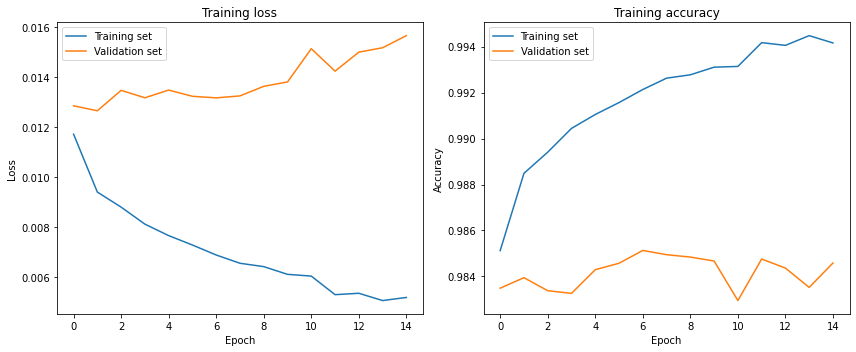

In [34]:
## 12/14 fine-tuning training with the 2-track windows
tracker_NN.n_epochs=15
tracker_NN.fit(evts_hits_train_2track, evts_ids_train_2track)
draw_train_history(tracker_NN.history)

In [20]:
## To load an existing model, use:
tracker_NN.build_model(model_structure='LSTMx2_Dropout')
for seed_location in ['front','middle','back']:
    tracker_NN.model[seed_location] = keras.models.load_model('saved_models/tracker_NN_%s_2112_multiseed.h5'%seed_location)
    tracker_NN.model[seed_location].summary()

Model: "model_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 32, 12)]          0         
_________________________________________________________________
bidirectional_54 (Bidirectio (None, 32, 240)           127680    
_________________________________________________________________
dropout_27 (Dropout)         (None, 32, 240)           0         
_________________________________________________________________
bidirectional_55 (Bidirectio (None, 32, 240)           346560    
_________________________________________________________________
time_distributed_27 (TimeDis (None, 32, 7)             1687      
Total params: 475,927
Trainable params: 475,927
Non-trainable params: 0
_________________________________________________________________
Model: "model_28"
_________________________________________________________________
Layer (type)                 Outpu


Total seeds processed per location:  {'front': 230187, 'middle': 274401, 'back': 325113}
Starting training...
Epoch 1/15
2072/2072 [==============================] - 354s 169ms/step - loss: 0.0059 - accuracy: 0.9933 - val_loss: 0.0061 - val_accuracy: 0.9932
Epoch 2/15
2072/2072 [==============================] - 370s 178ms/step - loss: 0.0045 - accuracy: 0.9949 - val_loss: 0.0060 - val_accuracy: 0.9933
Epoch 3/15
2072/2072 [==============================] - 366s 177ms/step - loss: 0.0040 - accuracy: 0.9957 - val_loss: 0.0060 - val_accuracy: 0.9936
Epoch 4/15
2072/2072 [==============================] - 365s 176ms/step - loss: 0.0037 - accuracy: 0.9962 - val_loss: 0.0059 - val_accuracy: 0.9938
Epoch 5/15
2072/2072 [==============================] - 351s 169ms/step - loss: 0.0034 - accuracy: 0.9966 - val_loss: 0.0064 - val_accuracy: 0.9933
Epoch 6/15
2072/2072 [==============================] - 348s 168ms/step - loss: 0.0030 - accuracy: 0.9970 - val_loss: 0.0068 - val_accuracy: 0.9934
E

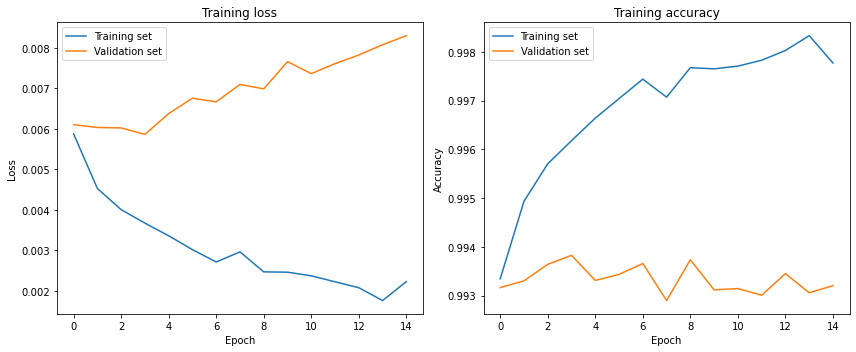

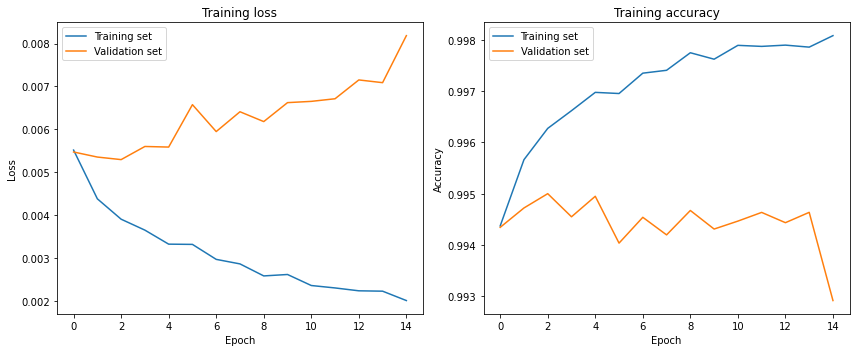

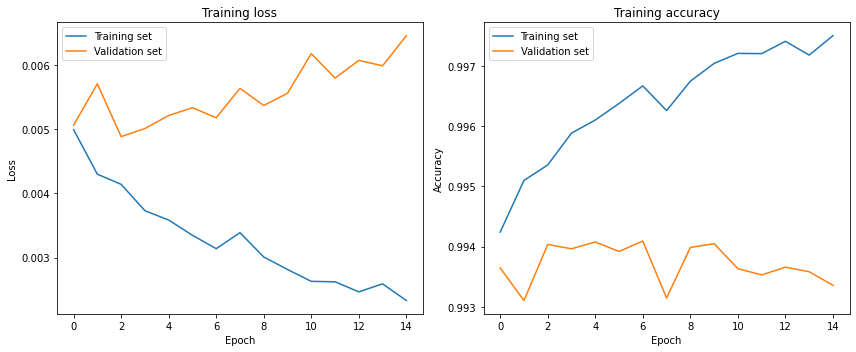

In [21]:
tracker_NN.n_epochs=15
tracker_NN.fit(evts_hits_train, evts_ids_train)
draw_train_history(tracker_NN.history)

In [22]:
## save models after fitting
for seed_location in ['front','middle','back']:
    tracker_NN.model[seed_location].save('saved_models/tracker_NN_%s_2112_multiseed.h5'%seed_location) 

## Examine output


In [23]:
def plot_event_NNoutput(evt_hits, evt_ids=False, selection_threshold=0.6):
    ## make passing ids optional
    
    ## Display event
    display_event(tracker,evt_hits)


    ## We could get prediction simply with predict_event, 
    ## but we also need the model input to compare against truth and seeds
    #model_prediction = tracker_NN.predict_event(evt_hits)
    ## prepare event for prediction 
    model_input = tracker_NN.prepare_event_for_prediction(evt_hits)
    ## iterate over all seed locations
    n_seeds,model_output,model_prediction={},{},{}
    for seed_location in ['front','middle','back']:
        n_seeds[seed_location]=model_input[seed_location].shape[0]
        print('%d seeds in %s' % (n_seeds[seed_location],seed_location))
        if n_seeds[seed_location]==0:
            model_prediction[seed_location]=np.array([])
            continue
        ## get model output for all seeds
        model_output[seed_location] = tracker_NN.model[seed_location].predict(model_input[seed_location])
        ## package output into full prediction, in 32x32 array
        model_prediction[seed_location]=np.zeros( (n_seeds[seed_location],
                                                   tracker.n_layers, tracker.n_straws))
        for i_seed in range(n_seeds[seed_location]):
            for ilayer in range(tracker.n_layers):
                for ihitstraw in range(tracker_NN.nstraws_perlayer):
                    istraw = model_input[seed_location][i_seed][ilayer][ihitstraw].astype(int)-1
                    model_prediction[seed_location][i_seed][ilayer][istraw] = model_output[seed_location][i_seed][ilayer][ihitstraw+1]
    
    model_prediction_selected={}
    for seed_location in ['front','middle','back']:
        if n_seeds[seed_location]==0: continue
        model_prediction_selected[seed_location] = np.zeros_like(model_prediction[seed_location])
        model_prediction_selected[seed_location][np.where(model_prediction[seed_location]>selection_threshold)] = 1
    n_seeds_total = n_seeds['front']+n_seeds['middle']+n_seeds['back']

    
    ## Now plot input and prediction per seed
    full_detector_width = tracker_NN.detector.width
    ## put all straw locations in a df
    layer_v, straw_v, x_v, y_v =[],[],[],[]
    for ilayer in range(tracker_NN.detector.n_layers):
        for istraw in range(tracker_NN.detector.n_straws):
            layer_v+= [ilayer]
            straw_v+= [istraw]
            x_v+= [tracker_NN.detector.x[ilayer] ]
            y_v+= [tracker_NN.detector.y[ilayer][istraw] ]
    df = pd.DataFrame({'layer':layer_v, 'straw':straw_v, 'x':x_v, 'y':y_v})

    
    ## Step through all seeds from each location and plot model prediction
    for seed_location in ['front','middle','back']:
        for i_seed in range(n_seeds[seed_location]):
            print('seed %d in detector %s' % (i_seed, seed_location))
            ## Plot the raw NN output, which is the probability for each straw
            ## that it belongs to the same track as the seed
            fig, axs = plt.subplots(figsize=(20,8))
            axs.set_title('NN raw output for seed #%d in %s' % (i_seed,seed_location))

            axs.set_xlim((-0.1*tracker_NN.detector.length, 1.1*tracker_NN.detector.length))
            axs.set_ylim((-0.1*full_detector_width, 1.1*full_detector_width))
            # plot a circle at the location of each straw
            for ilayer,straw_x in enumerate(tracker_NN.detector.x):
                for straw_y in tracker_NN.detector.y[ilayer]:
                    circle = plt.Circle((straw_x, straw_y), tracker_NN.detector.straw_radius, 
                                        color='black', fill=False)
                    axs.add_patch(circle)
            ix,iy=np.where(model_prediction[seed_location][i_seed]>0)
            axs.scatter(tracker_NN.detector.x[ix],tracker_NN.detector.y[ix,iy],
                        c=model_prediction[seed_location][i_seed][ix,iy], cmap = 'RdPu', alpha =0.5)
            plt.show()

            
            ### Plot the NN output values corresponding to the straws that are predicted to belong to the track
            fig, axs = plt.subplots()      
            axs.set_title('NN output for straws that are predicted to belong to the track')
            hits_x,hits_y=np.where(model_prediction_selected[seed_location][i_seed]==1)
            axs.hist(model_prediction[seed_location][i_seed][hits_x,hits_y])
            plt.show()
            print ('RMS = %.4f' % np.std(model_prediction[seed_location][i_seed][hits_x,hits_y]))
            
                               
            ## If we haven't passed the truth, then we're done (for this seed)
            if evt_ids is False: continue

            ### Now plot relative to the truth, if it is passed
            ## Get the layers/straws for this seed
            seed_layers,seed_hits = np.where(model_input[seed_location][i_seed][:,tracker_NN.nstraws_perlayer:] > 0)
            seed_straws = model_input[seed_location][i_seed][seed_layers.astype(int),seed_hits.astype(int)]-1

            ## now get the track id that corresponds to this track
            seed_ids = evt_ids[seed_layers,seed_straws.astype(int)]
            if (seed_ids==seed_ids[0]).sum() == len(seed_ids):
            # all hits in seed belong to same track
                seed_id = seed_ids[0]
            else: 
                # oops, at least some hits are false.
                # could get the track most encountered with eg: mode(seed_ids)
                # but best to skip this seed for now
                print('\n Unpure seed! We\'ll just use the seed id of the first hit as truth.')
                seed_id = seed_ids[0]
                                

            ### Plot the NN output values corresponding to the straws that belong to the track
            fig, axs = plt.subplots()    
            axs.set_title('NN output for straws that belong to the track')
            hits_x,hits_y=np.where(evt_ids==seed_id)
            axs.hist(model_prediction[seed_location][i_seed][hits_x,hits_y])
            plt.show()
            #print ('RMS = %.4f' % np.std(model_prediction[seed_location][i_seed][hits_x,hits_y]))


            ### Plot the NN output values corresponding to the straws that are predicted to belong to the track,
            ### but actually don't
            fig, axs = plt.subplots()        
            axs.set_title("NN output for straws that are predicted to belong to the track, but don't")
            badpred_x,badpred_y=np.where( (model_prediction_selected[seed_location][i_seed]==1) & (evt_ids!=seed_id))
            axs.hist(model_prediction[seed_location][i_seed][badpred_x,badpred_y])
            plt.show()
            #print ('RMS = %.4f' % np.std(model_prediction[seed_location][i_seed][badpred_x,badpred_y]))            


In [24]:
range_start=0
for i_evt in range(range_start,range_start+10):
    print(' Event #', i_evt)
    plot_event_NNoutput(evts_hits_valid[i_evt],evts_ids_valid[i_evt])

 Event # 0


No handles with labels found to put in legend.


KeyboardInterrupt: 

## Accuracy metric on raw NN output

An accuracy metric on the raw NN output, that is more meaningful than the training accuracy.  

Here we define it only based on the accuracy of assigning hits to their tracks. 

In [24]:
### read in the 2-track synthetic events for scoring
events_file=open(synthetic_dir+'synthetic_events.pkl','rb')
evts_hits_2track,evts_ids_2track = pickle.load(events_file,encoding='latin1')
evts_hits_test=evts_hits_2track[:1000]
evts_ids_test=evts_ids_2track[:1000]

In [25]:
## the remaining 2-track events can be used to fine-tune the RNN with more training
evts_hits_train_2track = evts_hits_2track[1000:]
evts_ids_train_2track = evts_ids_2track[1000:]

In [26]:
def raw_score(evts_hits, evts_ids, selection_threshold=0.7):
    ## Accuracy score for the raw NN output, before any disambiguation step.
    ## Scored per input, how many of the predicted hits actually do belong in the searched track. 
    ## Predicted here just means, those hits with output above the selection threshold.    
    
    ## counters
    n_seeds_unpure,n_seeds_total =0,0
    n_track_hits, n_track_correct, n_predicted, n_correct, n_wrong = {},{},{},{},{}
    track_correct, predicted_correct, predicted_wrong = {},{},{}
    for seed_location in ['front','middle','back']:
        n_track_hits[seed_location]=0
        n_track_correct[seed_location]=0
        n_predicted[seed_location]=0
        n_correct[seed_location]=0
        n_wrong[seed_location]=0
        track_correct[seed_location]=[]
        predicted_correct[seed_location]=[]
        predicted_wrong[seed_location]=[]

    ## iterate over all events
    n_evts=evts_hits.shape[0]
    n_print=int(n_evts/10)
    for i_evt in range(n_evts):
        if (i_evt%n_print)==0:
            print('scoring event #%d'%i_evt)
        
        ## prepare event for prediction 
        model_input = tracker_NN.prepare_event_for_prediction(evts_hits[i_evt])
        
        ## iterate over all seed locations
        model_output,event_prediction={},{}
        for seed_location in ['front','middle','back']:
            n_seeds_loc=model_input[seed_location].shape[0]
            if n_seeds_loc==0:
                continue
            n_seeds_total+=n_seeds_loc
            ## get model output for all seeds here
            model_output[seed_location] = tracker_NN.model[seed_location].predict(model_input[seed_location])
            
            ## iterate over all seeds in this location
            for i_seed in range(n_seeds_loc):
            
                ## Get the layers/straws for this seed
                seed_layers,seed_hits = np.where(model_input[seed_location][i_seed][:,tracker_NN.nstraws_perlayer:] > 0)
                seed_straws = model_input[seed_location][i_seed][seed_layers.astype(int),seed_hits.astype(int)]-1
                
                ## now get the track id that corresponds to this track
                seed_ids = evts_ids[i_evt][seed_layers,seed_straws.astype(int)]
                if (seed_ids==seed_ids[0]).sum() == len(seed_ids):
                # all hits in seed belong to same track
                    seed_id = seed_ids[0]
                else: 
                    # oops, at least some hits are false.
                    # could get the track most encountered with eg: mode(seed_ids)
                    # but best to skip this seed for now
                    n_seeds_unpure+=1
                    continue
                track_layers,track_straws=np.where((evts_ids[i_evt]==seed_id))
                nhits_track = len(track_layers)
                n_track_hits[seed_location]+=nhits_track
                
                ## get all hits selected by model with this seed
                selected_layers,selected_ids= np.where(model_output[seed_location][i_seed][:,1:] > selection_threshold )
                selected_straws = model_input[seed_location][i_seed][selected_layers,selected_ids]-1
                nhits_predict = len(selected_layers)
                n_predicted[seed_location]+=nhits_predict
                
                ## Now get the track layers/straws that were correctly predicted
                nhits_correct=0
                for i,ilayer in enumerate(track_layers):
                    if ((ilayer in selected_layers) and 
                        (selected_straws[np.where(selected_layers==ilayer)][0] == track_straws[i])):
                        nhits_correct+=1
                accuracy_score = nhits_correct/nhits_track
                track_correct[seed_location]+=[accuracy_score]
                n_track_correct[seed_location]+=nhits_correct

                
                ## Now count correct/wrong out of the predicted hits
                nhits_correct,nhits_wrong=0,0
                for i,ilayer in enumerate(selected_layers):
                    if ((ilayer in track_layers) and 
                        (track_straws[np.where(track_layers==ilayer)][0] == selected_straws[i])):
                        nhits_correct+=1
                    else:
                        nhits_wrong+=1
                n_correct[seed_location]+=nhits_correct
                n_wrong[seed_location]+=nhits_wrong
                predicted_correct[seed_location]+=[nhits_correct/nhits_predict]
                predicted_wrong[seed_location]+=[nhits_wrong/nhits_predict]
      
    
    ## Processed all seeds. Final results:
    print("Total unpure seeds found :: %d (out of %d)" % (n_seeds_unpure,n_seeds_total))
    for seed_location in ['front','middle','back']:
        print('For %s seeds:'%seed_location)
        print('Accurately found fraction of track hits :: ',100*n_track_correct[seed_location]/n_track_hits[seed_location])
        plt.hist(track_correct[seed_location],bins=30)
        plt.show()
        print('Accurately predicted fraction of found hits :: ', 100*n_correct[seed_location]/n_predicted[seed_location])
        plt.hist(predicted_correct[seed_location],bins=30)
        plt.show()
        print('Wrongly predicted fraction of found tracks :: ', 100*n_wrong[seed_location]/n_predicted[seed_location])
        plt.hist(predicted_wrong[seed_location],bins=30)
        plt.show()
                
                
            

scoring event #0
scoring event #100
scoring event #200
scoring event #300
scoring event #400
scoring event #500
scoring event #600
scoring event #700
scoring event #800
scoring event #900
Total unpure seeds found :: 185 (out of 7129)
For front seeds:
Accurately found fraction of track hits ::  97.74129200552402


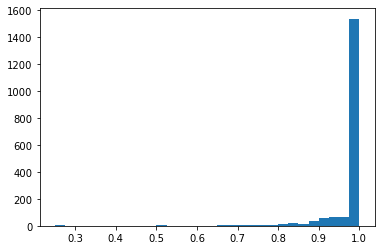

Accurately predicted fraction of found hits ::  98.75658914728682


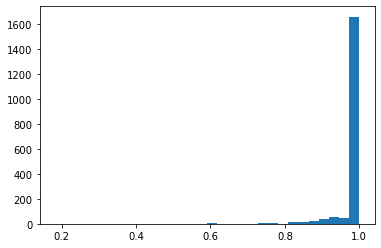

Wrongly predicted fraction of found tracks ::  1.2434108527131782


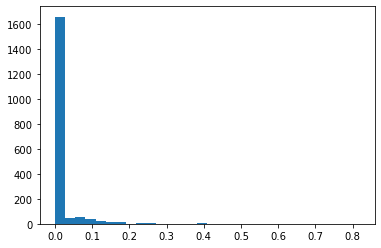

For middle seeds:
Accurately found fraction of track hits ::  97.09742878425934


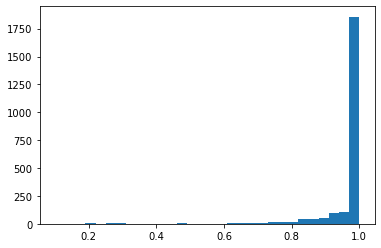

Accurately predicted fraction of found hits ::  98.2967547326815


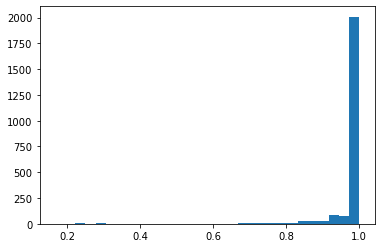

Wrongly predicted fraction of found tracks ::  1.703245267318494


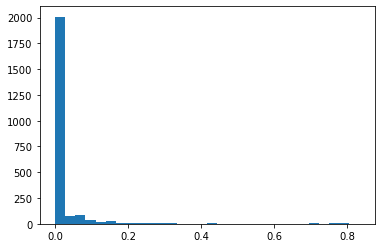

For back seeds:
Accurately found fraction of track hits ::  97.326921410623


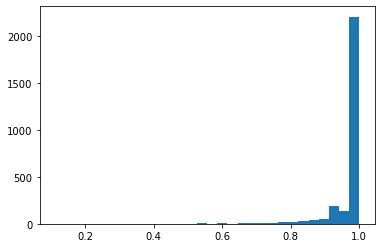

Accurately predicted fraction of found hits ::  98.90158268947148


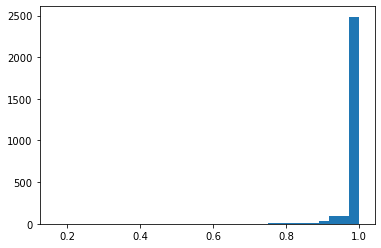

Wrongly predicted fraction of found tracks ::  1.098417310528517


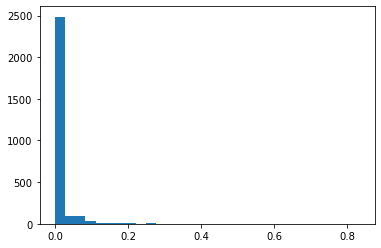

In [27]:
raw_score(evts_hits_test,evts_ids_test)

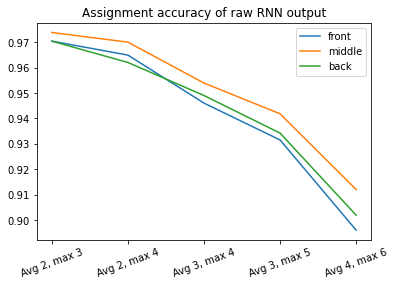

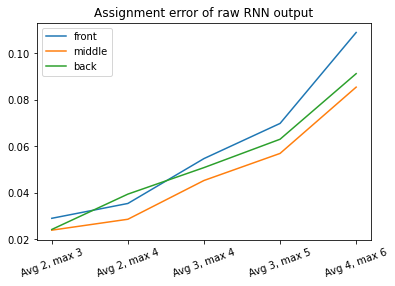

In [29]:
labels=['Avg 2, max 3', 'Avg 2, max 4',  'Avg 3, max 4', 'Avg 3, max 5', 'Avg 4, max 6']

raw_acc={}
raw_acc['front']  = [0.9704,0.9649,0.946,0.9315,0.896]
raw_acc['middle'] = [0.9738, 0.970,0.9539,0.9418,0.912]
raw_acc['back']   = [0.9704,0.962,0.949,0.9342,0.9019]

raw_err={}
raw_err['front']  = [0.029,0.03538,0.05468,0.0698,0.1089]
raw_err['middle'] = [0.0239,0.02859,0.04526,0.0569,0.0854]
raw_err['back']   = [0.0242,0.0394,0.0508,0.063,0.0912]


for seed_location in ['front','middle','back']:
    plt.plot(raw_acc[seed_location], label=seed_location)
plt.title('Assignment accuracy of raw RNN output')
plt.xticks(np.arange(5), labels, rotation=20)  # Set text labels and properties.
plt.legend()
plt.show()
for seed_location in ['front','middle','back']:
    plt.plot(raw_err[seed_location], label=seed_location)
plt.title('Assignment error of raw RNN output')
plt.xticks(np.arange(5), labels, rotation=20)  # Set text labels and properties.
plt.legend()
plt.show()

## Complete event prediction

Using the NN output, define an algorithm to give a complete event prediction for hits that belong in the same track.

In [28]:
### Identify "golden" seeds that give great track candidates.
### Assume that all their hits are correct, therefore:
### * merge their seeds with other seeds that were included in the golden track hits
### * remove golden track hits from other seeds input


def merge_golden_seeds(model_input, #looseness, #model_prediction=np.array(0),
                       removed_seed_ids, good_track_ids, verbose=False ):    
    if verbose: print('Searching for golden seeds')
    
    selection_threshold = 0.6# + looseness*0.07    
    #model_input = tracker_NN.prepare_event_for_prediction(evt_hits)

    n_seeds,model_output,model_prediction={},{},{}
    for seed_location in ['front','middle','back']:
        n_seeds[seed_location]=model_input[seed_location].shape[0]
        model_prediction[seed_location]=np.zeros( (n_seeds[seed_location],
                                                   tracker.n_layers, tracker.n_straws))
        if n_seeds[seed_location]==0: continue
        ## get model output for all seeds here
        model_output[seed_location] = tracker_NN.model[seed_location].predict(model_input[seed_location])
        ## package output into full prediction, in 32x32 array
        for i_seed in range(n_seeds[seed_location]):
            for ilayer in range(tracker.n_layers):
                for ihitstraw in range(tracker_NN.nstraws_perlayer):
                    istraw = model_input[seed_location][i_seed][ilayer][ihitstraw].astype(int)-1
                    model_prediction[seed_location][i_seed][ilayer][istraw] = model_output[seed_location][i_seed][ilayer][ihitstraw+1]

    n_seeds_total=n_seeds['front']+n_seeds['middle']+n_seeds['back']
    if n_seeds_total==0:
        print('\nNo seeds in model input')
        return model_input, np.nan, 0, 0
    ## assign an ID to each seed, so that we can combine and delete them
    seed_ids=np.arange(n_seeds_total)
    
    
    ### Stack all seed locations into single array, for ease of seed counting and id'ing
    model_prediction_full = np.concatenate( (model_prediction['front'],model_prediction['middle'],model_prediction['back']) )
    model_input_full = np.concatenate( (model_input['front'],model_input['middle'],model_input['back']) )
    model_prediction_selected = np.zeros_like(model_prediction_full)
    model_prediction_selected[np.where( model_prediction_full>selection_threshold )] = 1
    
    
    ## indicator whether input was modified
    modified_input=0
    new_good_ids=[]
    good_prediction_mins=[]
    ## go through all seeds, search for "golden" tracks
    for seed_id in seed_ids:
        if seed_id in removed_seed_ids: continue
        if verbose: print('processing seed ', seed_id)

        ## Get the layers/straws for this seed
        seed_layers,seed_hits = np.where(model_input_full[seed_id][:,tracker_NN.nstraws_perlayer:] > 0)
        seed_straws = model_input_full[seed_id][seed_layers,seed_hits.astype(int)]-1
        ## Get the hits that are predicted to belong with this seed
        predicted_layers,predicted_straws=np.where(model_prediction_selected[seed_id]==1)
        n_predicted_hits = len(predicted_layers)
        if n_predicted_hits<7: 
            if verbose: print(' -- Less than 7 predicted hits, skipping seed ')
            continue

        prediction_min = min(    model_prediction_full[seed_id][predicted_layers,predicted_straws] )
        prediction_rms = np.std( model_prediction_full[seed_id][predicted_layers,predicted_straws] )
        nhits_track    = np.sum( model_prediction_selected[seed_id][predicted_layers,predicted_straws] )

        if verbose:
            print('min prediction = ', prediction_min)
            print('rms prediction = ', prediction_rms)
            print('nhits_track = ', nhits_track)

        golden_threshold = 0.98# - looseness*0.02
        if (prediction_min>golden_threshold):# & (prediction_rms<0.005) & (nhits_track>=6):
            ## Very good track, likely with all predicted hits correct            
            if not (seed_id in good_track_ids):
                if verbose: print('Accepting GOLDEN track with seed id #%d\n'%seed_id)
                new_good_ids += [seed_id]
                good_prediction_mins += [prediction_min]

    new_good_ids=np.array(new_good_ids)
    good_prediction_mins=np.array(good_prediction_mins)
    if verbose: 
        print('newly found good seeds : ', new_good_ids)
        print('their predictions mins : ', good_prediction_mins)
    for seed_id in new_good_ids:
        if seed_id in removed_seed_ids: continue
        if seed_id in good_track_ids: continue            
        if verbose: print('processing new good seed ', seed_id)
        max_prediction_min = good_prediction_mins[np.where(new_good_ids==seed_id)[0][0]]
        best_seed_id=seed_id
        merged_seeds=[seed_id]
        if verbose: print('best seed, max prediction min, [merged seeds] : ', best_seed_id, max_prediction_min, merged_seeds)
        ## Get the layers/straws for this seed
        seed_layers,seed_hits = np.where(model_input_full[seed_id][:,tracker_NN.nstraws_perlayer:] > 0)
        seed_straws = model_input_full[seed_id][seed_layers,seed_hits.astype(int)]-1
        ## Get the hits that are predicted to belong with this seed
        predicted_layers,predicted_straws=np.where(model_prediction_selected[seed_id]==1)
        n_predicted_hits = len(predicted_layers)

        ## Step through all other seeds, search for ones that belong to the same track
        for seed_id2 in seed_ids:
            if seed_id2 == seed_id: continue
            if seed_id2 in removed_seed_ids: continue

            seed_layers2,seed_hits2 = np.where(model_input_full[seed_id2][:,tracker_NN.nstraws_perlayer:] > 0)
            seed_straws2 = model_input_full[seed_id2][seed_layers2,seed_hits2.astype(int)]-1              
            if verbose>1:
                print('model input for seed_id %d : \n'%seed_id2,model_input_full[seed_id2])
                print('seed layers,straws, hits:')
                print(seed_layers2)
                print(seed_straws2)
                print(seed_hits2)
            layers2,hits2=np.where(model_input_full[seed_id2][:,:tracker_NN.nstraws_perlayer]>0)
            straws2=model_input_full[seed_id2][layers2,hits2.astype(int)]-1

            ## number of seed hits of seed_id2 that were selected in seed_id
            n_seed_same = np.sum( model_prediction_selected[seed_id][seed_layers2,seed_straws2.astype(int)] )
            ## number and fraction of common selected hits overall
            n_hits_same = np.sum( model_prediction_selected[seed_id2][predicted_layers,predicted_straws] )
            frac_hits_same = n_hits_same / n_predicted_hits

            if verbose: 
                print('Cross-checking with seed #',seed_id2)
                print('%d same seed hits '%n_seed_same)
                print('%d same hits overall '%n_hits_same)
                print('%dpc fractional same hits '%(100*frac_hits_same))

            if (n_seed_same>=3) & (n_hits_same>=6):
                ## Since the original seed is high purity, assume that this seed is part of the same track.
                ## Remove this seed_id2 from further consideration
                ## -- trying to be a little conservative in the requirements to remove a seed
                if verbose: print('Merging seed#%d into seed#%d'%(seed_id2,seed_id))
                merged_seeds+=[seed_id2]
                if seed_id2 in new_good_ids:
                    if good_prediction_mins[np.where(new_good_ids==seed_id2)[0][0]]>max_prediction_min:
                        max_prediction_min = good_prediction_mins[np.where(new_good_ids==seed_id2)[0][0]]
                        best_seed_id=seed_id2
        
        ## consolidate the merged seeds into the one with the best output
        if verbose: print('\n found best seed id : ', best_seed_id)
        for merged_seed_id in merged_seeds:
            if merged_seed_id!=best_seed_id:
                removed_seed_ids+=[merged_seed_id]
                if verbose>1: print('removing merged seed %d with input:\n '%merged_seed_id, model_input_full[merged_seed_id])
                ## turn on the seed indicator for this seed on the consolidated input
                seed_layers2,seed_hits2 = np.where(model_input_full[merged_seed_id][:,tracker_NN.nstraws_perlayer:] > 0)
                seed_straws2 = model_input_full[merged_seed_id][seed_layers2,seed_hits2.astype(int)]-1              
                ## note that hit_location is different at input of each seed
                for i,seed_layer2 in enumerate(seed_layers2):
                    seed_straw2=seed_straws2[i]
                    if (seed_straw2+1) not in model_input_full[best_seed_id][seed_layer2]: continue
                    seed_hit2=np.where(model_input_full[best_seed_id][seed_layer2]==seed_straw2+1)[0][0]
                    model_input_full[best_seed_id][seed_layer2][tracker_NN.nstraws_perlayer+seed_hit2] = 1
            if verbose>1: print('model input for best seed after this merge: \n', model_input_full[best_seed_id])

        good_track_ids += [best_seed_id]

        ## now remove the hits of the good track from other inputs

        ## We assume that all its predicted hits are correct here, and remove them from all other inputs
        ## - we need to do this only after we look for shared hits with other seeds to merge
        ## - should we tighten the requirement here, eg remove only hits that are selected by 2 merged seeds
        ## Let's try to remove only the very highest scoring hits, even higher than the golden thresh
        golden_layers,golden_straws = np.where(model_prediction_full[seed_id][:,:] > 0.995)
        if verbose: print('golden layers and straws : \n', golden_layers, golden_straws)
        for seed_id2 in seed_ids:
            if (seed_id2 == best_seed_id) or (seed_id2 in removed_seed_ids): continue                
            layers2,hits2=np.where(model_input_full[seed_id2][:,:tracker_NN.nstraws_perlayer]>0)
            straws2=model_input_full[seed_id2][layers2,hits2.astype(int)]-1
            if verbose: print('layers and straws for this seed : \n', layers2, straws2)
            for layer2 in np.unique(layers2):
                if seed_id2 in removed_seed_ids: continue                
                if layer2 not in golden_layers: continue
                i_gold=np.where(golden_layers==layer2)[0][0]
                if golden_straws[i_gold] not in straws2[layers2==layer2]: continue
                if verbose>1:
                    print('model_input for seed %d layer %d before hit removal : '%(seed_id2,layer2), model_input_full[seed_id2][layer2])
                golden_straw = golden_straws[ np.where(golden_layers==layer2)[0][0] ]
                ihit = np.where(model_input_full[seed_id2][layer2]==golden_straw+1)[0][0]
                if verbose>1:
                    print('golden layer/straw/hit : ', layer2, golden_straw, ihit)
                    print('Removing golden hit (%d,%d) at loc%d from seed %d' % (layer2,int(golden_straw),ihit,seed_id2))
                model_input_full[seed_id2][layer2][ihit] = 0
                if verbose>1: 
                    print('model_input for that seed layer after removal : ', model_input_full[seed_id2][layer2])
                if ( (model_input_full[seed_id2][layer2][ihit+tracker_NN.nstraws_perlayer]==1) 
                    and (seed_id2 not in removed_seed_ids) ):
                    removed_seed_ids += [seed_id2]
                    if verbose: print('removing seed ',seed_id2)
                modified_input=1


        if verbose:
            print(' Good track identified:: ')
            display_event(tracker, straw_hits=model_prediction_selected[best_seed_id])        

    ## Recover partial inputs from each seed location
    model_input['front'] = model_input_full[:n_seeds['front']]
    model_input['middle'] = model_input_full[n_seeds['front']:n_seeds['front']+n_seeds['middle']]
    model_input['back'] = model_input_full[n_seeds['front']+n_seeds['middle']:]

    
    
    return model_input, removed_seed_ids, good_track_ids, modified_input




In [29]:
### Identify "silver" seeds that give good track candidates, but don't assume that all their hits are correct.
### Call with increasingly loose criteria.
### * merge with other seeds that have enough shared hits
### * remove the most reliable silver hits from other seeds input 
###   ** (provided they don't also have high output in other seeds)


def merge_silver_seeds(model_input, looseness, #model_prediction=np.array(0),
                       removed_seed_ids, good_track_ids, verbose=False):    

    if verbose:
        print('\n\n Merging silver seeds\n')
        print('removed_seed_ids : ', removed_seed_ids)
        print('good_track_ids : ', good_track_ids)
        
    n_seeds,model_output,model_prediction={},{},{}
    for seed_location in ['front','middle','back']:
        n_seeds[seed_location]=model_input[seed_location].shape[0]
        model_prediction[seed_location]=np.zeros( (n_seeds[seed_location],
                                                   tracker.n_layers, tracker.n_straws))
        if n_seeds[seed_location]==0: continue
        ## get model output for all seeds here
        model_output[seed_location] = tracker_NN.model[seed_location].predict(model_input[seed_location])
        ## package output into full prediction, in 32x32 array
        for i_seed in range(n_seeds[seed_location]):
            for ilayer in range(tracker.n_layers):
                for ihitstraw in range(tracker_NN.nstraws_perlayer):
                    istraw = model_input[seed_location][i_seed][ilayer][ihitstraw].astype(int)-1
                    model_prediction[seed_location][i_seed][ilayer][istraw] = model_output[seed_location][i_seed][ilayer][ihitstraw+1]
                    
    n_seeds_total=n_seeds['front']+n_seeds['middle']+n_seeds['back']
    if n_seeds_total==0:
        print('\nNo seeds in model input' )
        return model_input, np.nan, 0, 0
    ## assign an ID to each seed, so that we can combine and delete them
    seed_ids=np.arange(n_seeds_total)    
    
    ## Selection based on prediction
    selection_threshold=0.6# + looseness*0.05
    ### Stack all seed locations into single array, for ease of seed counting and id'ing
    model_prediction_full = np.concatenate( (model_prediction['front'],model_prediction['middle'],model_prediction['back']) )
    model_input_full = np.concatenate( (model_input['front'],model_input['middle'],model_input['back']) )
    model_prediction_selected = np.zeros_like(model_prediction_full)
    model_prediction_selected[np.where( model_prediction_full>selection_threshold )] = 1
    

    ## indicator whether input was modified
    modified_input=0
    ### Go through all seeds, search for "golden" tracks
    for seed_id in seed_ids:
        if seed_id in removed_seed_ids: continue
        if verbose: print('processing seed id #', seed_id)

        ## Get the layers/straws for this seed
        seed_layers,seed_hits = np.where(model_input_full[seed_id][:,tracker_NN.nstraws_perlayer:] == 1)
        seed_straws = model_input_full[seed_id][seed_layers,seed_hits.astype(int)]-1
        ## Get the hits that are predicted to belong with this seed
        predicted_layers,predicted_straws=np.where(model_prediction_selected[seed_id]==1)
        n_predicted_hits = len(predicted_layers)
        ## if too few good hits, remove seed
        if n_predicted_hits<6:
            removed_seed_ids += [seed_id]
            modified_input=1
            continue
        ## Get the hits that are too uncertain, ie below a threshold
        uncertain_layers,uncertain_straws=np.where( (model_prediction_full[seed_id]<0.9) & (model_prediction_full[seed_id]>selection_threshold) )
        if verbose: print('uncertain layers, straws ::\n', uncertain_layers, uncertain_straws)
        n_uncertain = len(uncertain_layers)
        ## if too many uncertain hits, remove seed
        if n_uncertain>2: # and looseness>=1
            if verbose: print('removing seed, %d uncertain hits' % n_uncertain)
            removed_seed_ids += [seed_id]
            modified_input=1
            continue
        if looseness>0:
            ## turn off the uncertain hits in later iterations
            for i,uncertain_layer in enumerate(uncertain_layers):
                uncertain_straw=uncertain_straws[i]
                if verbose: print('Removing uncertain hit at (%d,%d)' % (uncertain_layer,uncertain_straw))
                if (uncertain_straw+1) not in model_input_full[seed_id][uncertain_layer]:
                    ## likely the hit was just removed by another process
                    continue
                ihit = np.where(model_input_full[seed_id][uncertain_layer]==uncertain_straws[i]+1)[0][0]
                if model_input_full[seed_id][ilayer][ihit+tracker_NN.nstraws_perlayer]==1:
                    ## uncertain seed hit? just remove the seed
                    if verbose: print(' removing uncertain seed hit')
                    removed_seed_ids += [seed_id]
                    continue
                model_input_full[seed_id][ilayer][ihit] = 0
                if verbose>1: print('model input after removal : \n', model_input_full[seed_id])

        prediction_min = min(    model_prediction_full[seed_id][predicted_layers,predicted_straws] )
        prediction_rms = np.std( model_prediction_full[seed_id][predicted_layers,predicted_straws] )
        nhits_track    = np.sum( model_prediction_selected[seed_id][predicted_layers,predicted_straws] )
        if verbose:
            print('min prediction = ', prediction_min)
            print('rms prediction = ', prediction_rms)
            print('nhits_track = ', nhits_track)

  
        ### Turn off all the hits that had output below a cutoff (increasing with looseness)
        ### from the input of this same seed  
        hit_layers,hit_ids = np.where(model_input_full[seed_id][:,:tracker_NN.nstraws_perlayer] > 0)
        hit_straws = model_input_full[seed_id][hit_layers,hit_ids.astype(int)]-1
        for i,hit_layer in enumerate(hit_layers):
            hit_straw=hit_straws[i].astype(int)
            hit_id=hit_ids[i]
            ## Check if the corresponding output is less than a cutoff
            cutoff=0.1+looseness*0.1
            if (model_prediction_full[seed_id][hit_layer][hit_straw]<cutoff):
                if verbose: print('Cutoff: Removing hit at (%d,%d)' % (hit_layer,hit_straw))
                model_input_full[seed_id][hit_layer][hit_id] = 0
                modified_input=1
                
        prediction_min = min(    model_prediction_full[seed_id][predicted_layers,predicted_straws] )
        prediction_rms = np.std( model_prediction_full[seed_id][predicted_layers,predicted_straws] )
        nhits_track    = np.sum( model_prediction_selected[seed_id][predicted_layers,predicted_straws] )
        if verbose:
            print('min prediction = ', prediction_min)
            print('rms prediction = ', prediction_rms)
            print('nhits_track = ', nhits_track)

        silver_threshold = 0.95 - looseness*0.01
        if (prediction_min>silver_threshold):# & (prediction_rms<0.005) & (nhits_track>=6):
            ## Good track, but still some ambiguity
            ## don't assume that all its hits are necessarily correct
            if not (seed_id in good_track_ids):
                if verbose: print('Accepting SILVER track with seed id #%d\n'%seed_id)
                good_track_ids += [seed_id]
                modified_input=1
            
            ## Now step through all other seeds, search for ones that belong to the same track
            merged_seeds=[seed_id]
            for seed_id2 in seed_ids:
                if seed_id2==seed_id: continue
                if seed_id2 in removed_seed_ids: continue

                seed_layers2,seed_hits2 = np.where(model_input_full[seed_id2][:,tracker_NN.nstraws_perlayer:] == 1)
                seed_straws2 = model_input_full[seed_id2][seed_layers2,seed_hits2.astype(int)]-1
                layers2,hits2=np.where(model_input_full[seed_id2][:,:tracker_NN.nstraws_perlayer]>0)
                straws2=model_input_full[seed_id2][layers2,hits2.astype(int)]-1
                if verbose>1:
                    print('model input for seed_id %d : \n'%seed_id2,model_input_full[seed_id2])
                    print('seed layers,straws, hits:')
                    print(seed_layers2)
                    print(seed_straws2)
                    print(seed_hits2)
                ## number of seed hits of seed_id2 that were selected in seed_id
                n_seed_same = np.sum( model_prediction_selected[seed_id][seed_layers2,seed_straws2.astype(int)] )
                ## number and fraction of common selected hits overall
                n_hits_same = np.sum( model_prediction_selected[seed_id2][predicted_layers,predicted_straws] )
                frac_hits_same = n_hits_same / n_predicted_hits

                if verbose: 
                    print('Cross-checking with seed #',seed_id2)
                    print('%d same seed hits '%n_seed_same)
                    print('%d same hits overall '%n_hits_same)
                    print('%dpc fractional same hits '%(100*frac_hits_same))

                if (n_seed_same>=3-looseness*0.1) & (n_hits_same>=7-looseness*0.4):
                    ## Since the original seed is of good quality, we assume that this seed is part of the same track.
                    ## Remove this seed_id2 from further consideration.
                    ## We still don't assume that all its hits are correctly assigned
                    ### TO DO: pick the seed with the best output
                    if verbose: print('Merging seed#%d into seed#%d'%(seed_id2,seed_id))
                    merged_seeds += [seed_id2]
                    removed_seed_ids += [seed_id2]
                    if verbose>1:
                        print('merging seed layers, straws, hits:')
                        print(seed_layers2)
                        print(seed_straws2)
                        print(seed_hits2)
                        print('seed input before merge:\n', model_input_full[seed_id])
                    ## note that hit_location is different at input of each seed
                    for i,seed_layer2 in enumerate(seed_layers2):
                        seed_straw2=seed_straws2[i]
                        if (seed_straw2+1) not in model_input_full[seed_id][seed_layer2]: 
                            ## pretty weird if a seed hit of a seed we're merging with has been removed... 
                            ## just skip for now
                            continue
                        seed_hit2=np.where(model_input_full[seed_id][seed_layer2]==seed_straw2+1)[0][0]
                        model_input_full[seed_id][seed_layer2][tracker_NN.nstraws_perlayer+seed_hit2] = 1
                    if verbose>1:
                        print('seed input after merge:\n', model_input_full[seed_id])
                    modified_input=1

            ### Find the highest quality hits among the merged seeds
            for i,ilayer in enumerate(predicted_layers):
                istraw = predicted_straws[i]
                if (istraw+1) not in model_input_full[seed_id][ilayer]: continue
                ihit = np.where(model_input_full[seed_id][ilayer]==istraw+1)[0][0]
                ## this hit is high-quality if its output is high enough among all merged seeds
                ## or at least nmin merged seeds find it to be high
                high_threshold=0.98 - looseness*0.01
                if np.sum(model_prediction_full[merged_seeds, ilayer, istraw]>high_threshold)==len(merged_seeds):
                    if verbose: print('Good hit at (%d,%d)' % (ilayer,istraw))
                    ## Set it to 0 at other inputs, except if other seeds have selected it with high-ish output also
                    for seed_id2 in seed_ids:
                        if ((seed_id2 in good_track_ids) 
                            or (seed_id2 in removed_seed_ids) ): continue
                        if (istraw+1) not in model_input_full[seed_id2][ilayer][:tracker_NN.nstraws_perlayer]: continue
                        ihit2 = np.where(model_input_full[seed_id2][ilayer][:tracker_NN.nstraws_perlayer]==istraw+1)[0][0]
                        model_input_full[seed_id2][ilayer][ihit2] = 0
                        if model_input_full[seed_id2][ilayer][ihit2+tracker_NN.nstraws_perlayer]==1:
                            if verbose: print('removing seed %d, as it lost a seed hit')
                            removed_seed_ids += [seed_id2]
                        modified_input=1

            if verbose: 
                print(' Good track identified:: ')
                display_event(tracker, straw_hits=model_prediction_selected[seed_id])        

            
    ## Recover partial inputs from each seed location
    model_input['front'] = model_input_full[:n_seeds['front']]
    model_input['middle'] = model_input_full[n_seeds['front']:n_seeds['front']+n_seeds['middle']]
    model_input['back'] = model_input_full[n_seeds['front']+n_seeds['middle']:]


    return model_input, removed_seed_ids, good_track_ids, modified_input





In [30]:
def get_prediction_selected(model_input, selection_threshold):  

    ## Beware: This function washes away the seed location information.
    ## Apply it only as a last step.
    
    #print('\n Now in get_prediction_selected script\n')
    
    n_seeds,model_output,model_prediction={},{},{}
    for seed_location in ['front','middle','back']:
        n_seeds[seed_location]=model_input[seed_location].shape[0]
        model_prediction[seed_location]=np.zeros( (n_seeds[seed_location],
                                                   tracker.n_layers, tracker.n_straws))
        if n_seeds[seed_location]==0: continue
        ## get model output for all seeds here
        model_output[seed_location] = tracker_NN.model[seed_location].predict(model_input[seed_location])
        ## package output into full prediction, in 32x32 array
        for i_seed in range(n_seeds[seed_location]):
            for ilayer in range(tracker.n_layers):
                for ihitstraw in range(tracker_NN.nstraws_perlayer):
                    istraw = model_input[seed_location][i_seed][ilayer][ihitstraw].astype(int)-1
                    if istraw>0:
                        model_prediction[seed_location][i_seed][ilayer][istraw] = model_output[seed_location][i_seed][ilayer][ihitstraw+1]
                    
    n_seeds_total=n_seeds['front']+n_seeds['middle']+n_seeds['back']
    if n_seeds_total==0: 
        print('\nNo seeds in model input' )
        return model_input, np.nan, 0, 0
    ## assign an ID to each seed, so that we can combine and delete them
    seed_ids=np.arange(n_seeds_total)    

    ## Selection based on prediction
    selection_threshold=0.7
    ### Stack all seed locations into single array, for ease of seed counting and id'ing
    model_prediction_full = np.concatenate( (model_prediction['front'],model_prediction['middle'],model_prediction['back']) )
    model_input_full = np.concatenate( (model_input['front'],model_input['middle'],model_input['back']) )
    model_prediction_selected = np.zeros_like(model_prediction_full)
    model_prediction_selected[np.where( model_prediction_full>selection_threshold )] = 1
    
    return model_prediction_selected
    
    

In [31]:
def get_prediction_ids(model_prediction_selected):
    ## Get model prediction ids in a single array of dimensions [length,width]
    prediction_ids = np.zeros((tracker.n_layers,tracker.n_straws))
    for i_track in range(model_prediction_selected.shape[0]):
        layers,straws = np.where(model_prediction_selected[i_track]==1)
        prediction_ids[layers,straws] = i_track+1        
    return prediction_ids
    
    

In [32]:
### Disambiguate hits that are selected by multiple tracks


def disambiguate_hits(model_input, good_seed_ids, selection_threshold=0.7, drop_ambiguous=True, verbose=False):   
    if verbose: print('\n\n Disambiguating hits\n')
        
    n_seeds,model_output,model_prediction={},{},{}
    for seed_location in ['front','middle','back']:
        n_seeds[seed_location]=model_input[seed_location].shape[0]
        model_prediction[seed_location]=np.zeros( (n_seeds[seed_location],
                                                   tracker.n_layers, tracker.n_straws))
        if n_seeds[seed_location]==0: continue
        ## get model output for all seeds here
        model_output[seed_location] = tracker_NN.model[seed_location].predict(model_input[seed_location])
        ## package output into full prediction, in 32x32 array
        for i_seed in range(n_seeds[seed_location]):
            for ilayer in range(tracker.n_layers):
                for ihitstraw in range(tracker_NN.nstraws_perlayer):
                    istraw = model_input[seed_location][i_seed][ilayer][ihitstraw].astype(int)-1
                    model_prediction[seed_location][i_seed][ilayer][istraw] = model_output[seed_location][i_seed][ilayer][ihitstraw+1]
                    
    n_seeds_total=n_seeds['front']+n_seeds['middle']+n_seeds['back']
    if n_seeds_total==0: # no disambiguation needed
        print('\nNo seeds in model input')
        return model_input, np.nan, 0, 0
    ## assign an ID to each seed, so that we can combine and delete them
    seed_ids=np.arange(n_seeds_total)    

    ### Stack all seed locations into single array, for ease of seed counting and id'ing
    model_prediction_full = np.concatenate( (model_prediction['front'],model_prediction['middle'],model_prediction['back']) )
    model_input_full = np.concatenate( (model_input['front'],model_input['middle'],model_input['back']) )
    model_prediction_selected = np.zeros_like(model_prediction_full)
    model_prediction_selected[np.where( model_prediction_full>selection_threshold )] = 1
    
    ### Go through all good seeds, search for doubly assigned hits
    for seed_id in good_seed_ids:
        if verbose:
            print('processing good seed id #', seed_id)
            print('model input: ', model_input_full[seed_id])
            print('model prediction at : ', np.where(model_prediction_full[seed_id]>0.5))
            print('model prediction selected at: ', np.where( model_prediction_selected[seed_id]>0 ))

        predicted_layers,predicted_straws=np.where(model_prediction_selected[seed_id]==1)
        n_predicted_hits = len(predicted_layers)
        for i,ilayer in enumerate(predicted_layers):
            istraw = predicted_straws[i]
            hit_output_value = model_prediction_full[seed_id][ilayer][istraw]
            if verbose: print(ilayer,istraw, hit_output_value)
            ## Go through other seeds, check for other seeds that selected this hit
            for seed_id2 in good_seed_ids:
                if (seed_id2 == seed_id): continue
                hit_output_value2 = model_prediction_full[seed_id2][ilayer][istraw]
                if hit_output_value2<0.1: continue
                if drop_ambiguous:
                    if verbose: print('dropping ambiguous hit from both seeds')
                    ihit1 = np.where(model_input_full[seed_id][ilayer]==istraw+1)
                    model_input_full[seed_id][ilayer][ihit1] = 0
                    ihit2 = np.where(model_input_full[seed_id2][ilayer]==istraw+1)
                    model_input_full[seed_id2][ilayer][ihit2] = 0
                else:
                    if hit_output_value2>hit_output_value:
                        if verbose: print('changing to new seed : ', hit_output_value2)
                        ihit = np.where(model_input_full[seed_id][ilayer]==istraw+1)
                        model_input_full[seed_id][ilayer][ihit] = 0
                    else: 
                        if verbose: print('staying with same track, but good try: ', hit_output_value2)
                        ihit = np.where(model_input_full[seed_id2][ilayer]==istraw+1)
                        model_input_full[seed_id2][ilayer][ihit] = 0
                    if verbose: print('Disambiguating hit (%d,%d) between seeds %d-%d' % (ilayer,istraw,seed_id,seed_id2) )

                       
    ## Recover partial inputs from each seed location
    model_input['front'] = model_input_full[:n_seeds['front']]
    model_input['middle'] = model_input_full[n_seeds['front']:n_seeds['front']+n_seeds['middle']]
    model_input['back'] = model_input_full[n_seeds['front']+n_seeds['middle']:]

    return model_input






In [33]:
def merge_seeds(evt_hits, verbose=False):
    '''
    Iteratively go over input for all seeds, merging them into tracks
    and disambiguating difficult hits
    '''
    
    ## Format model input for event
    model_input = tracker_NN.prepare_event_for_prediction(evt_hits)
    n_seeds_total = model_input['front'].shape[0]+model_input['middle'].shape[0]+model_input['back'].shape[0]

    '''
    Ideas to consider:

    * Extract directionality of each track candidate and seeds.
        ** Can use that information to exclude some hit outliers, changes in track direction, or veto some seed combinations.
        ** OTOH, this is too "algorithmic". That information should in principle have been "learnt" by the NN.

    * First identify very good tracks
        ** They will have a high fraction of high-probability hits, and low variance in directionality
            *** We need this metric to be 100% "golden".
            *** If not (eg not fully accurate tracks still get golden output) then make loss function stricter
        ** Merge with other seeds that are included in the golden hits
            *** May mark those other seeds as seeds in the golden track
            *** Then run the track again through the NN, perhaps can gain something with more constraints
            *** Though the NN hasn't been trained to run with seeds in many modules
        ** Then remove the hits of good tracks from all other inputs, making all other tracks much more tractable
        ** Then pass everything through the NN in a second (and more simplified) pass, get better results

    * Then start merging seeds between non-golden tracks
        ** Require a certain number/fraction of shared hits
        ** This might get messy, considering that late seeds have poor output
            *** If the output of a seed looks bad at this point (under some criteria) then just drop it.
            *** Its hits are probably contained in the track of an earlier seed anyway

    * Lastly, disambiguate hits that are shared between tracks
        ** Based on the NN outputs
        
    '''
    looseness = 0
    removed_seed_ids=[]
    good_track_ids=[]
    while (looseness<3):
        ## iterate with increasing looseness

        ## Look for golden tracks, merge their seeds, remove their hits from other inputs
        ## This should iterative, until no new golden tracks found, or any modification in input made
        while(1):
            modified_input=0
            model_input, removed_seed_ids, good_track_ids, modified_input = merge_golden_seeds(model_input,
                                                                               removed_seed_ids=removed_seed_ids,
                                                                               good_track_ids=good_track_ids, verbose=verbose)
            if ((modified_input==0) or (removed_seed_ids is np.nan) ): break
        ### Are we done?
        if removed_seed_ids is np.nan:
            if verbose: print('Hold up, only 1 or 0 seeds in event')
            return 0, 0
        if (n_seeds_total-len(removed_seed_ids) == len(good_track_ids) ):
            #print('Found all good tracks !!')
            return model_input, good_track_ids


        ## Now look for silver tracks
        ## After each "silver" search we go back to looking for gold
        model_input, removed_seed_ids, good_track_ids, modified_input = merge_silver_seeds(model_input, looseness=looseness,
                                                                           removed_seed_ids=removed_seed_ids, 
                                                                           good_track_ids=good_track_ids, verbose=verbose)
        if removed_seed_ids is np.nan:
            if verbose: print('Hold up, only 1 or 0 seeds in event')
            return model_input, 0
        if (n_seeds_total-len(removed_seed_ids) == len(good_track_ids) ):
            if verbose: print('Found all good tracks!!')
            return model_input, good_track_ids

        ## loosen criteria for next iteration
        looseness+=1

    ## if we make it out here without final solution, then just return the good tracks we found already
    return model_input, good_track_ids


In [34]:
## here duplicate functionality of fully predicting an event,
## including disambiguating the NN output iteratively

def predict_event(evt_hits, verbose=False):
    """
    Note that input and prediction are expected to be both for a single event, 
    potentially with many tracks and seeds.
    The first dimension is equal to the number of seeds in the event. 
    * Set all straws that weren't hit to 0
    * Check whether some seeds can be combined into a single track
    * Pass the combined seeds through a (new?) track search
    * Disambiguate straw hits that are assigned to multiple tracks
    * Round probabilistic track assignment to binary yes/no
    * Return the prediction for tracks in the event
    Note that the return prediction matrix will be of smaller dimension than the input
    """ 

    ### Create model input, iteratively merge seeds
    model_input, good_seed_ids = merge_seeds(evt_hits, verbose=verbose)
    if (np.all(model_input==0)) or (len(good_seed_ids)==0): return np.zeros_like(evt_hits)
    if verbose: 
        print('model input after merge_seeds : ')
        for i in range(model_input['middle'].shape[0]):
            print('Seed #%d, hits: '% (i), np.where(model_input['middle'][i]>0))
        print('good seed_ids : ', good_seed_ids)


    ### Lastly, disambiguate hits that are selected in multiple tracks
    model_input = disambiguate_hits(model_input=model_input, good_seed_ids=good_seed_ids,
                                    selection_threshold = 0.9, verbose=verbose)
    #if verbose: print('model input after disambiguate_hits : ')
    #for i in range(model_input['middle'].shape[0]):
    #    print('Seed #%d, hits: '% (i), np.where(model_input['middle'][i]>0))



    ### Should be done here!
    ### Get final prediction and selection
    model_prediction_selected = get_prediction_selected(model_input=model_input,
                                                        selection_threshold=0.8) 

    
    ### Chop down to just the good seeds
    model_prediction_selected = model_prediction_selected[good_seed_ids,:,:]    
    
    if verbose:
        for i in range(model_prediction_selected.shape[0]):
            print('Good seed #%d, selected hits: '% (i), np.where(model_prediction_selected[i]>0))

    prediction_ids = get_prediction_ids(model_prediction_selected)


    return prediction_ids



In [35]:

def predict_events(evts_hits, verbose=0):
    """
    Fully predict many events, by calling predict_event on each.
    Return a predictions_ids array of dimensions (n_evts, n_layers, n_straws)
    """ 

    predictions_ids=np.zeros_like(evts_hits)
    n_evts=evts_hits.shape[0]   
    n_print=int(n_evts/10.)
    for i_evt in range(n_evts):
        if (i_evt%n_print)==0: print('predicting event #%d'%i_evt)
        evt_hits=evts_hits[i_evt]
        predictions_ids[i_evt] = predict_event(evt_hits, verbose=verbose)
    return predictions_ids


In [36]:
      
def plot_event_and_prediction(evt_hits, evt_ids=False, verbose=False, figsize=(15,10)):
    
    
    if evt_ids is False:
        print('Event hits:')
        display_event(tracker, evt_hits)
    else:
        print('Event truth:')
        display_event(tracker, evt_hits, evt_ids)


    ## Get model prediction
    prediction_ids = predict_event(evt_hits, verbose=verbose)
    if np.all(prediction_ids==0): 
        print('No tracks found\n Skipping...')
        return        
    print('\nModel prediction:')    
    
    full_detector_width = tracker_NN.detector.width

    fig, axs = plt.subplots(figsize=figsize)        
    ## First, plot the model input in the left subplot
    axs.set_title('Model prediction')

    axs.set_xlim((-0.1*tracker_NN.detector.length, 1.1*tracker_NN.detector.length))
    axs.set_ylim((-0.1*full_detector_width, 1.1*full_detector_width))

    # plot a circle at the location of each straw
    for ilayer,straw_x in enumerate(tracker_NN.detector.x):
        for straw_y in tracker_NN.detector.y[ilayer]:
            circle = plt.Circle((straw_x, straw_y), tracker_NN.detector.straw_radius, color='black', fill=False)
            axs.add_patch(circle)

    # plot the model prediction for each track
    track_ids=np.unique(prediction_ids[np.where(prediction_ids>0)])
    for i_track in track_ids:              
        track_x,track_y=np.where(prediction_ids==i_track)#self.detector.n_straws]==1)
        axs.scatter(tracker_NN.detector.x[track_x],tracker_NN.detector.y[track_x,track_y], marker='o', #color='black',
                    label='track %d'%(i_track))            
            
    plt.legend(fontsize=15)
    plt.tight_layout()
    plt.show()





 Event # 2


No handles with labels found to put in legend.


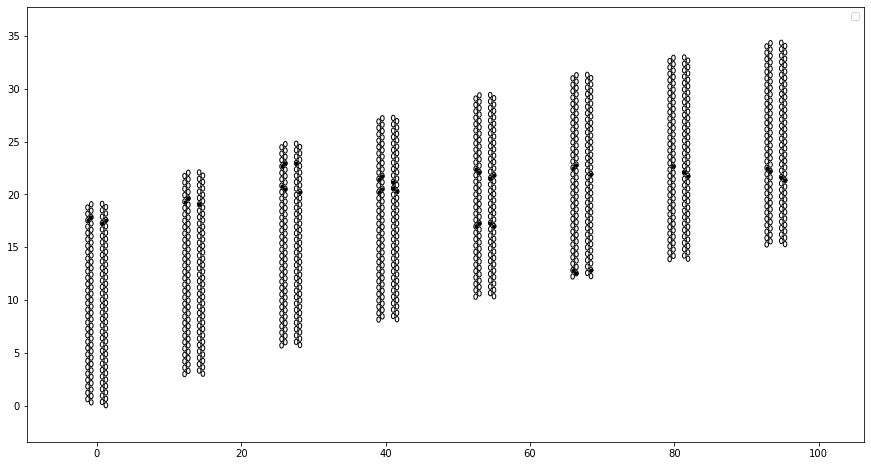

4 seeds in front
2 seeds in middle
4 seeds in back
seed 0 in detector front


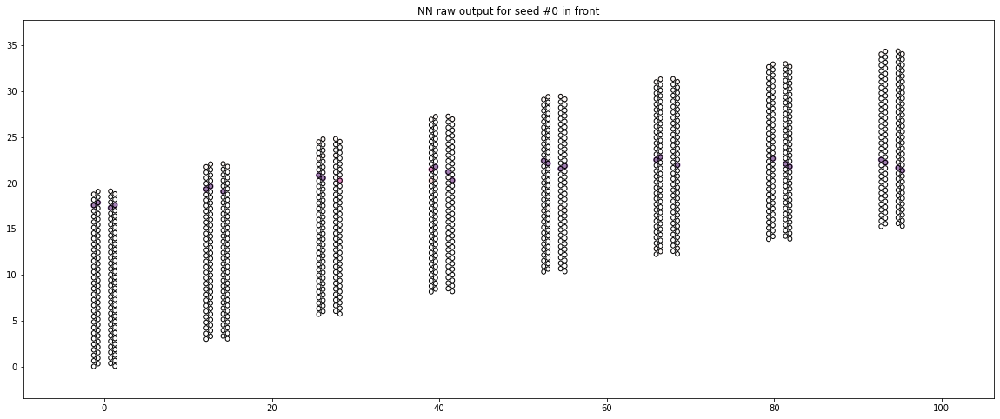

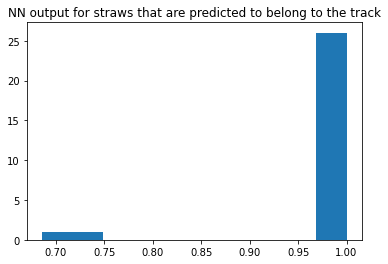

RMS = 0.0764


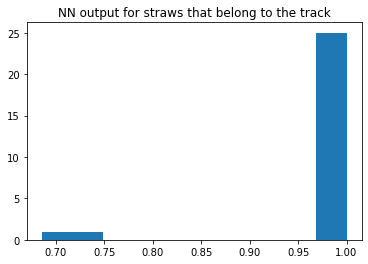

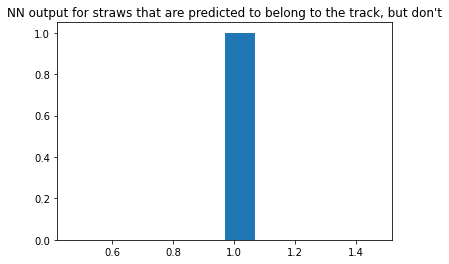

seed 1 in detector front


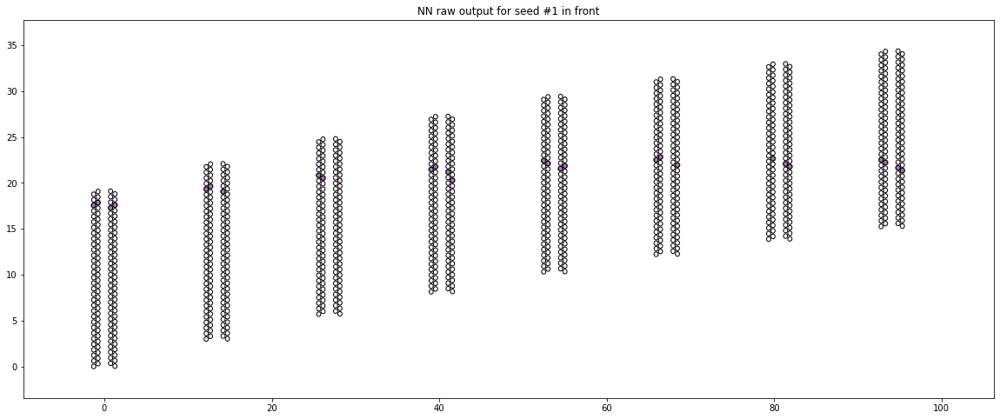

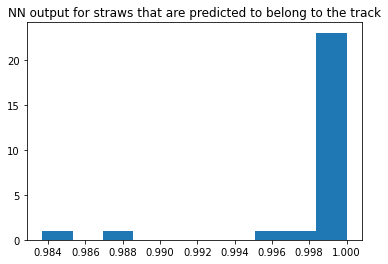

RMS = 0.0038


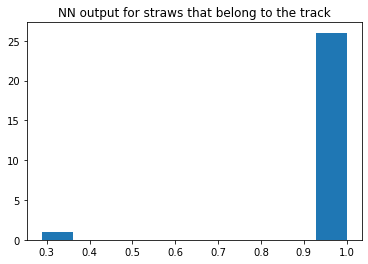

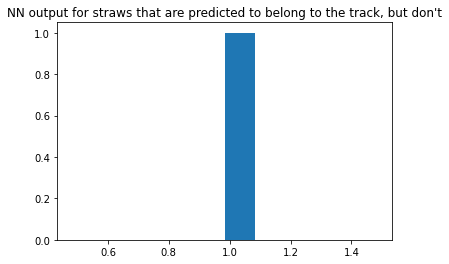

seed 2 in detector front


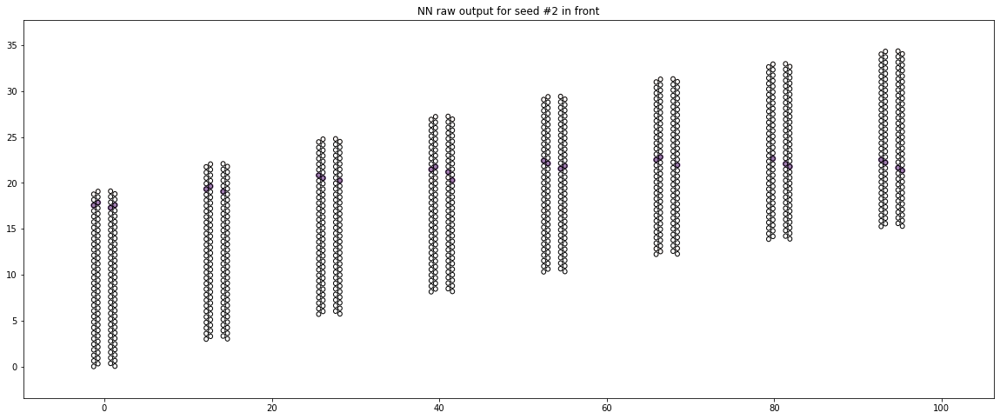

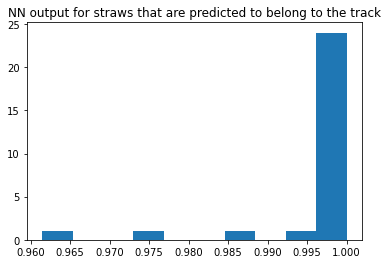

RMS = 0.0088


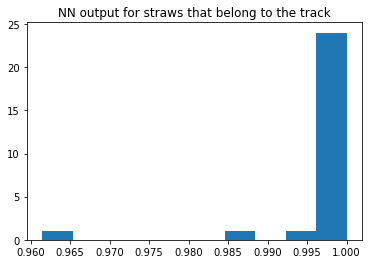

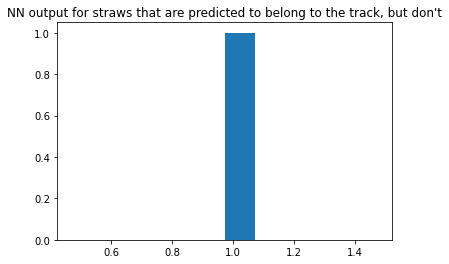

seed 3 in detector front


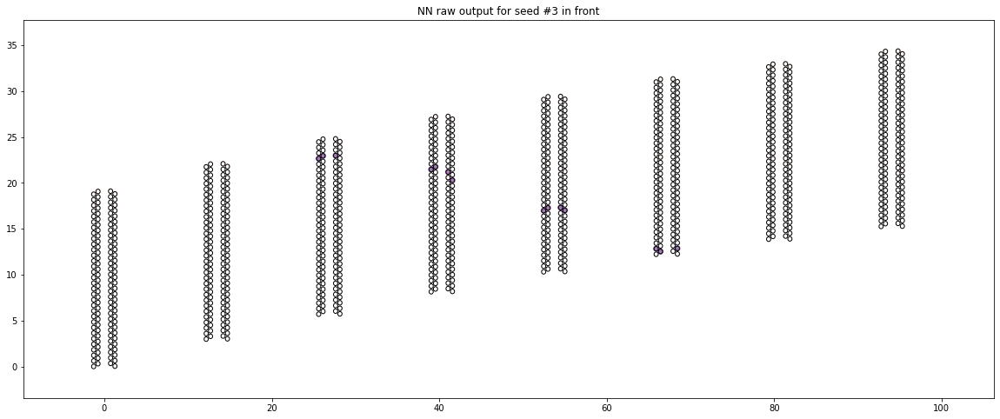

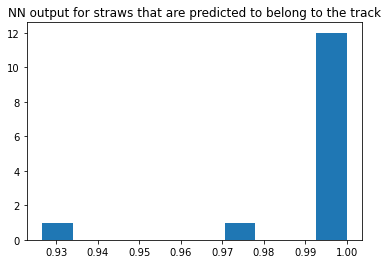

RMS = 0.0193


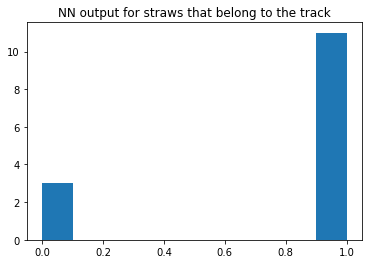

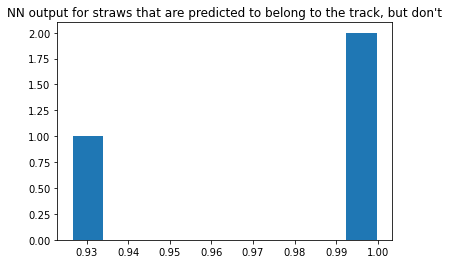

seed 0 in detector middle


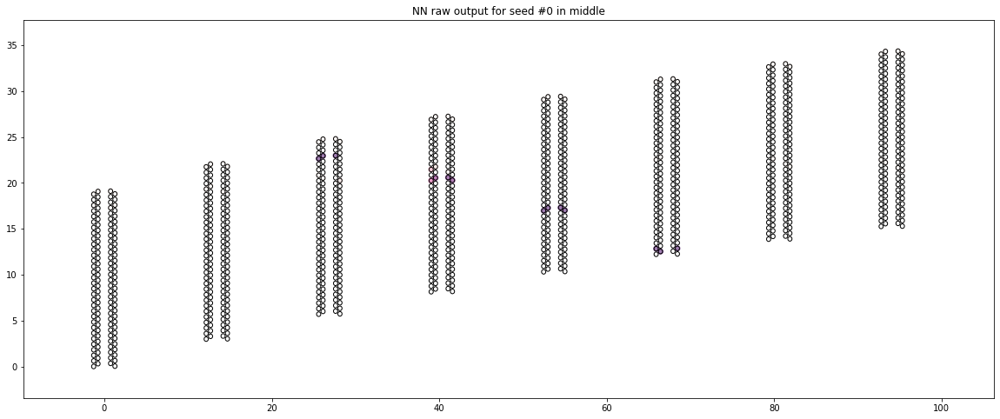

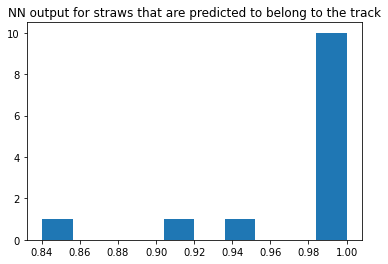

RMS = 0.0468


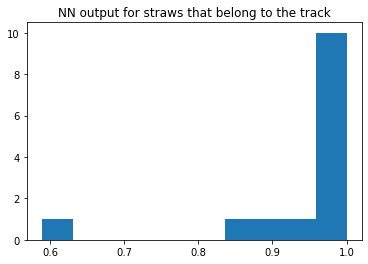

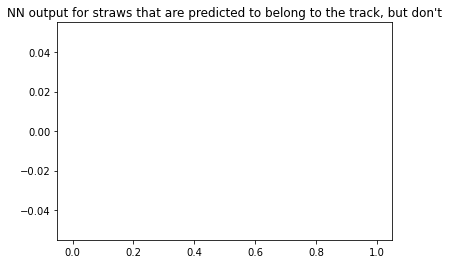

seed 1 in detector middle


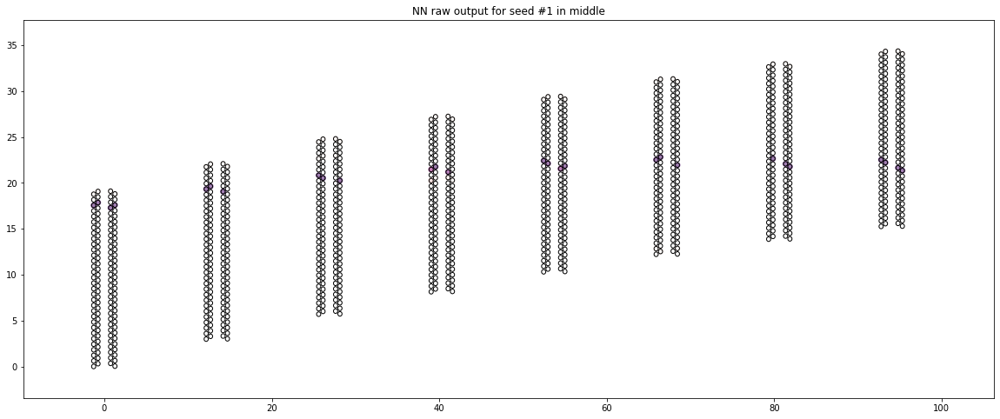

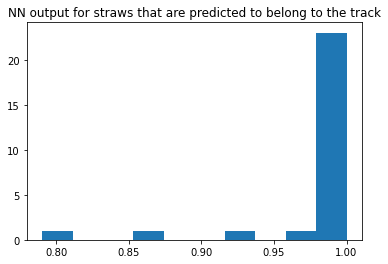

RMS = 0.0471


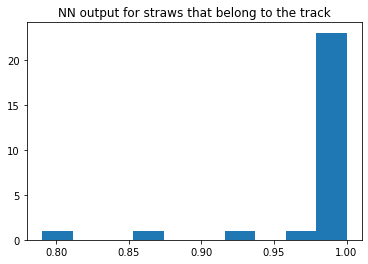

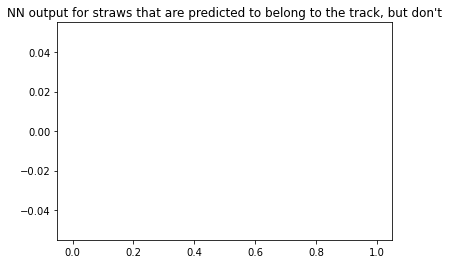

seed 0 in detector back


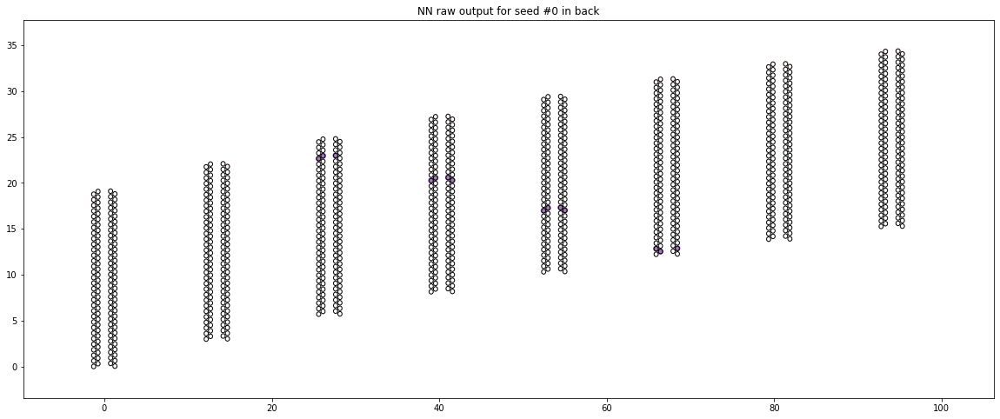

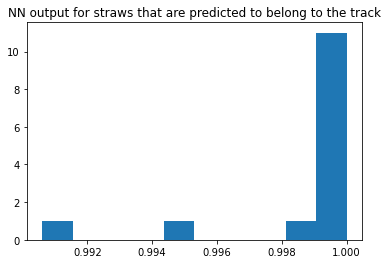

RMS = 0.0026


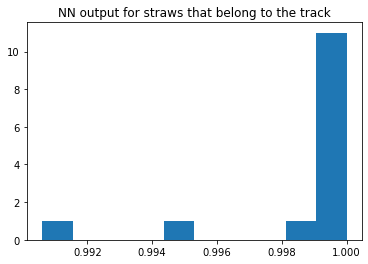

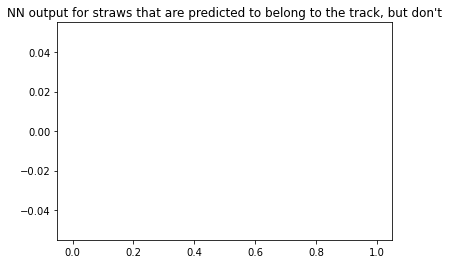

seed 1 in detector back


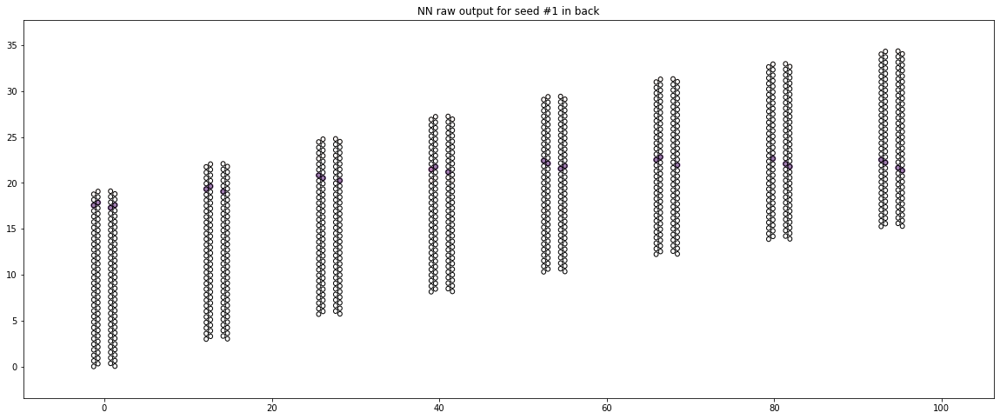

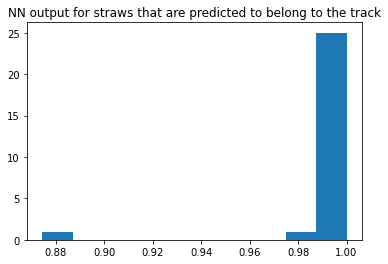

RMS = 0.0237


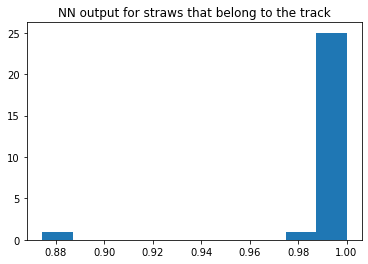

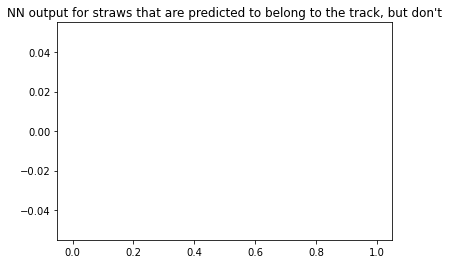

seed 2 in detector back


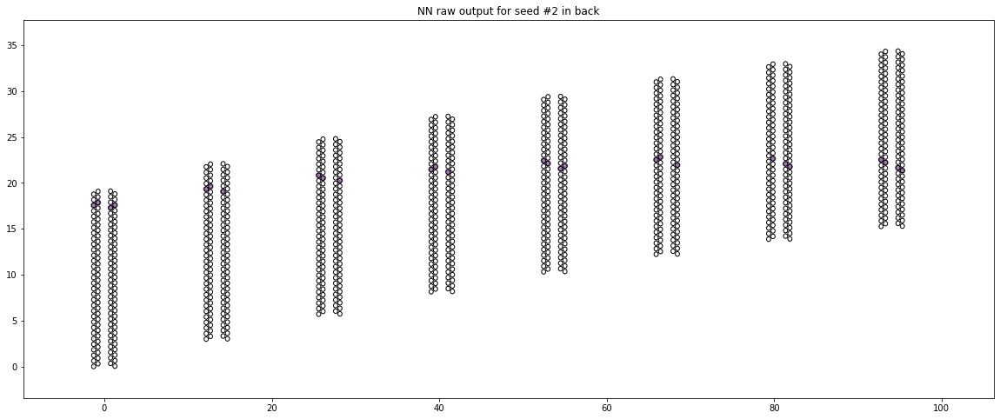

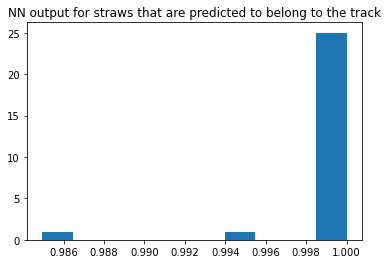

RMS = 0.0029


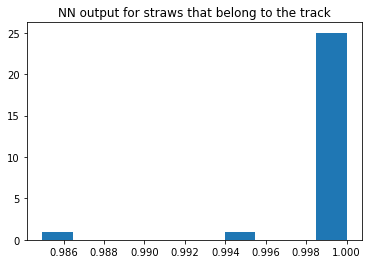

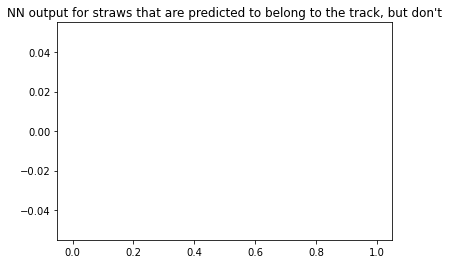

seed 3 in detector back


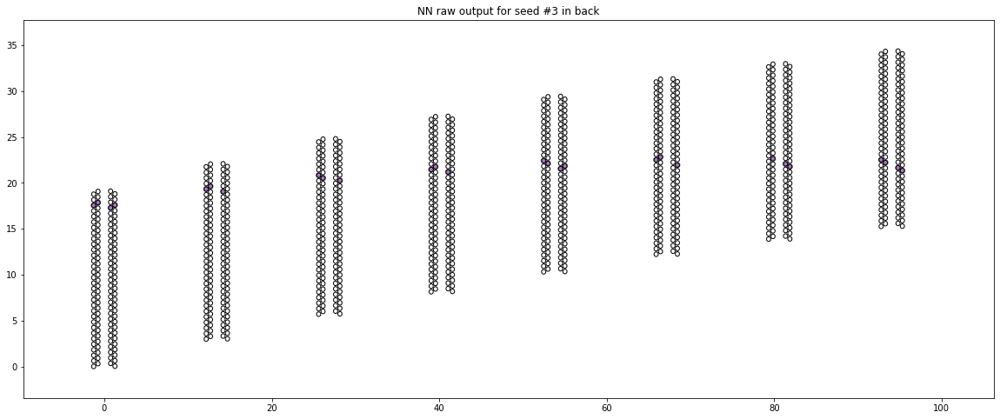

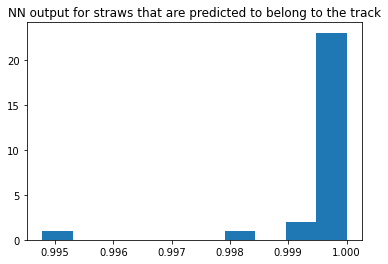

RMS = 0.0010


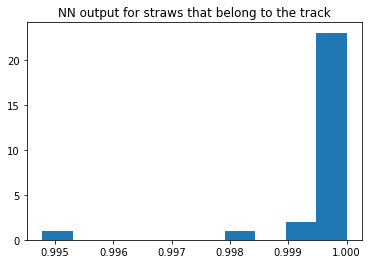

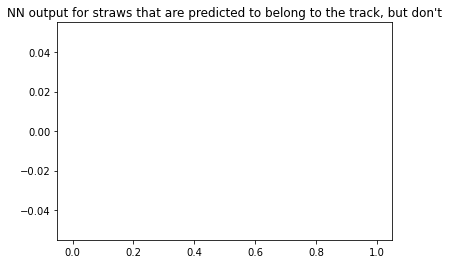

 Event # 3


No handles with labels found to put in legend.


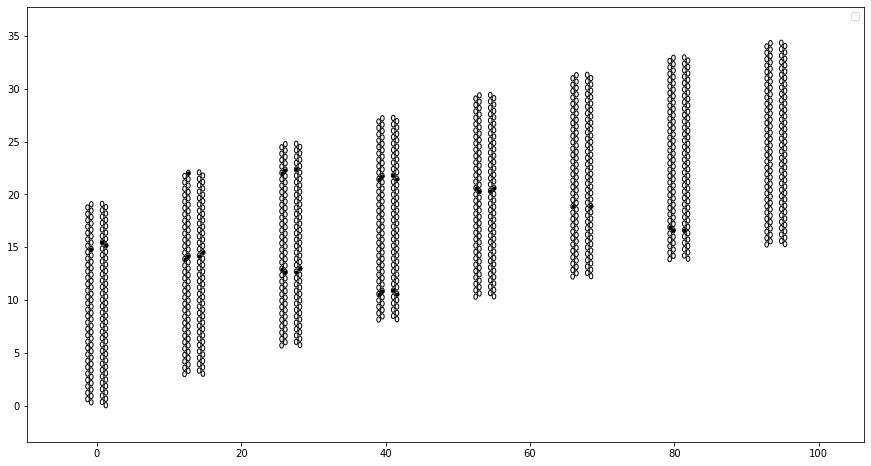

4 seeds in front
3 seeds in middle
1 seeds in back
seed 0 in detector front


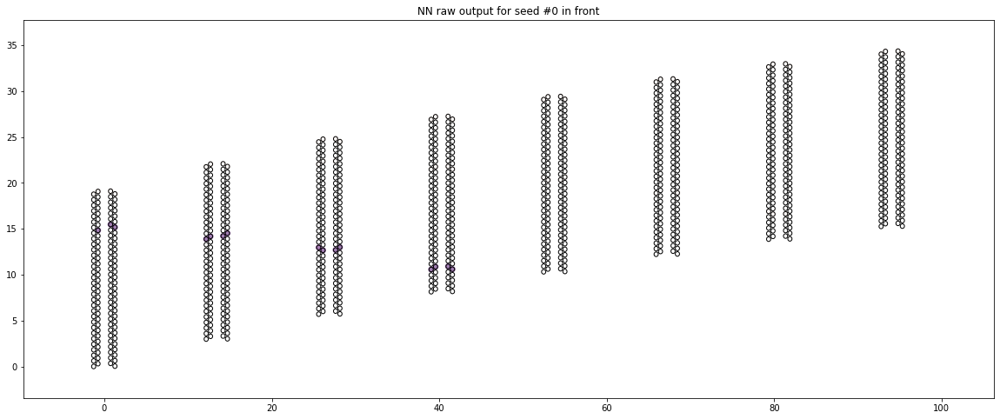

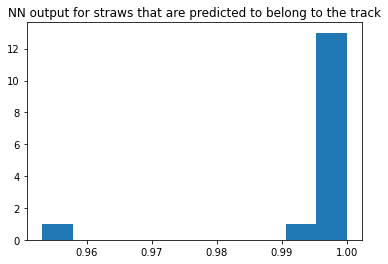

RMS = 0.0115


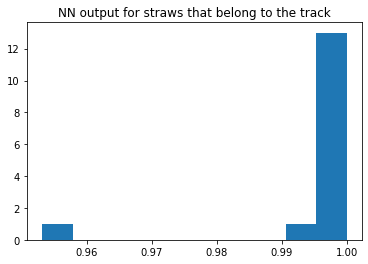

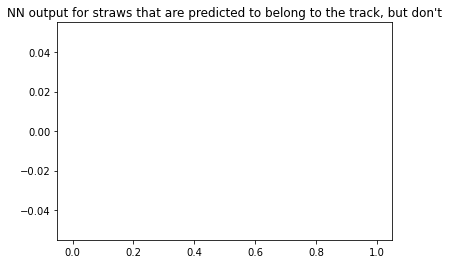

seed 1 in detector front


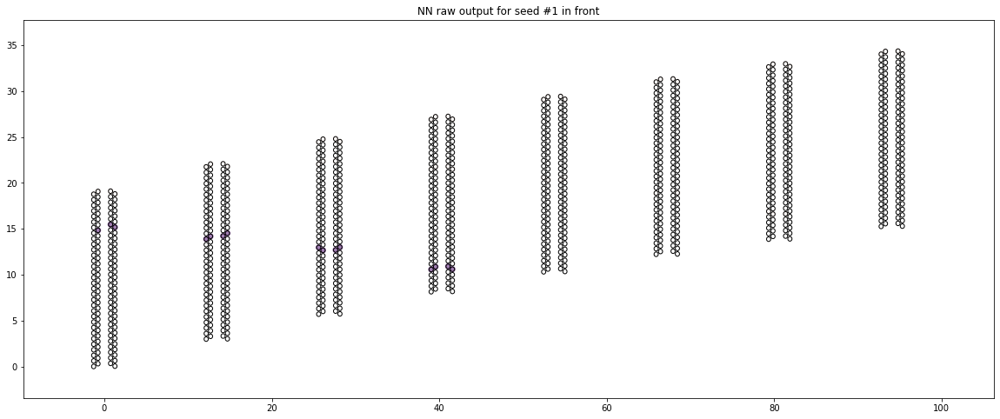

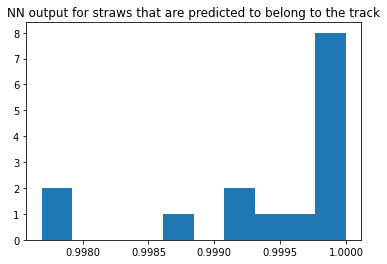

RMS = 0.0008


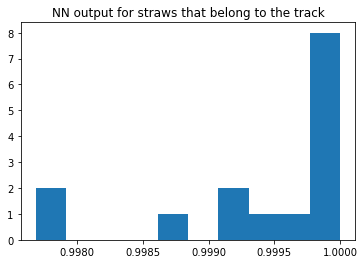

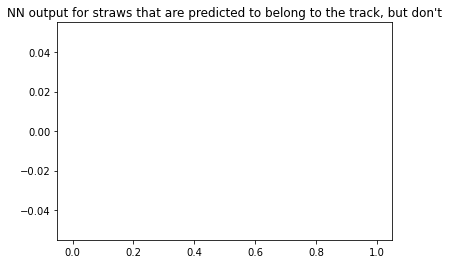

seed 2 in detector front


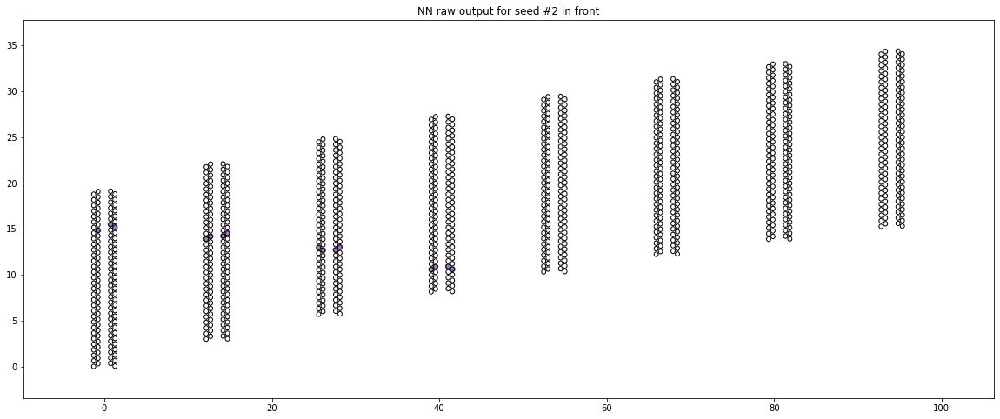

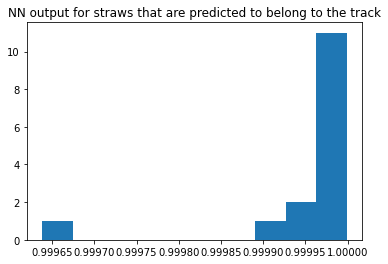

RMS = 0.0001


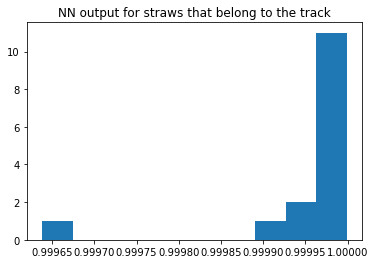

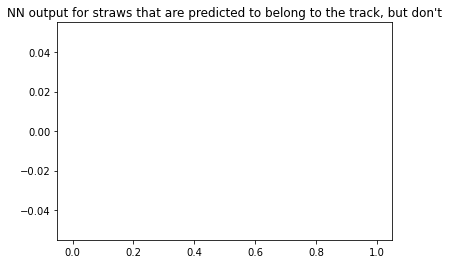

seed 3 in detector front


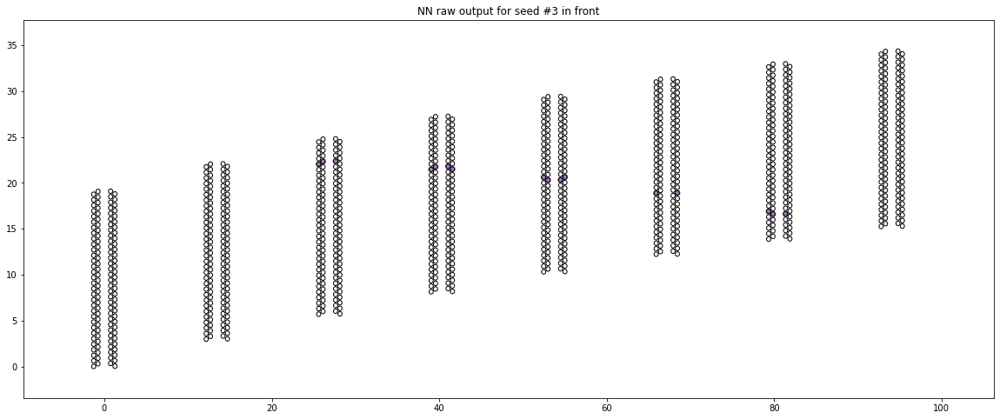

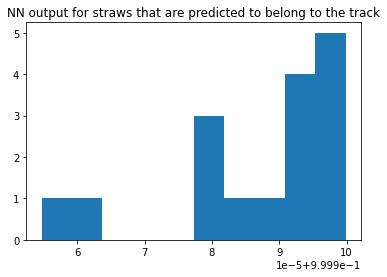

RMS = 0.0000


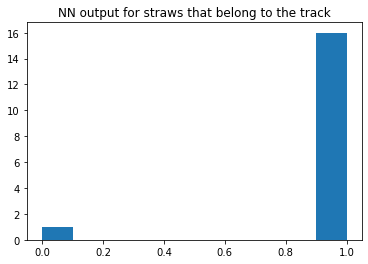

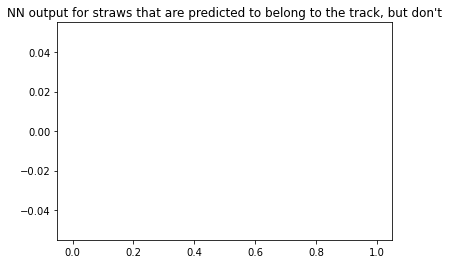

seed 0 in detector middle


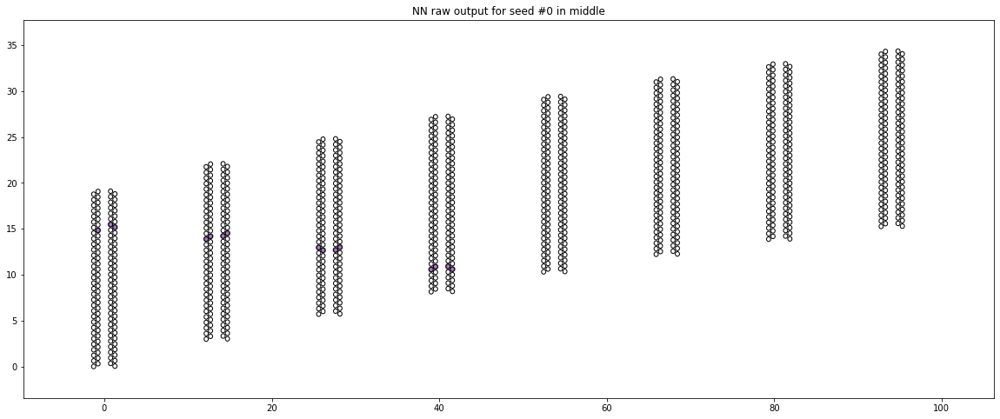

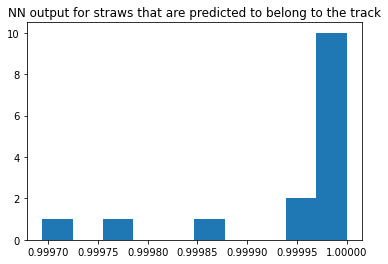

RMS = 0.0001


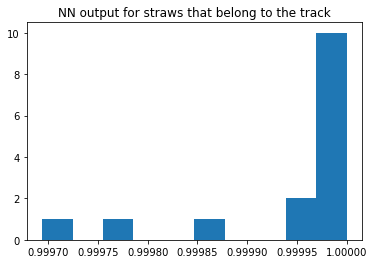

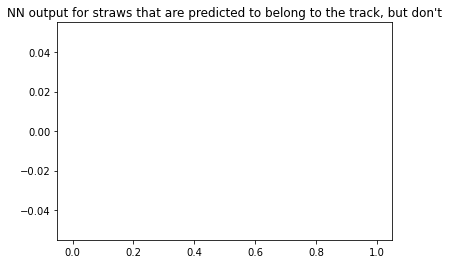

seed 1 in detector middle


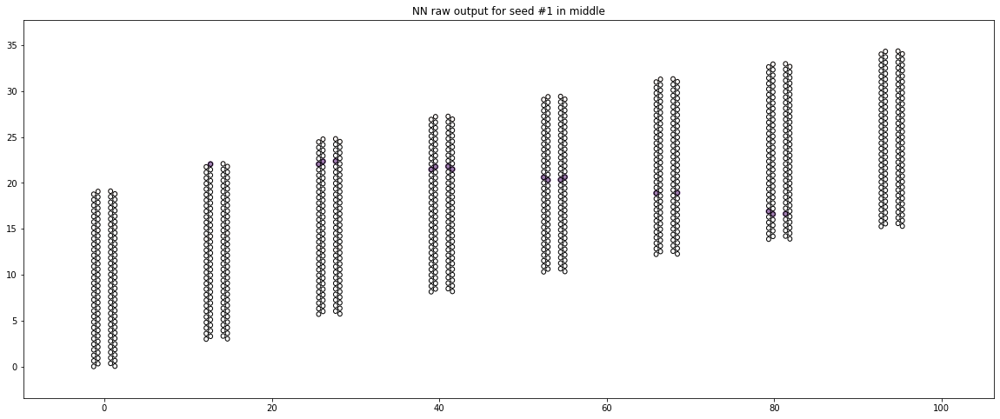

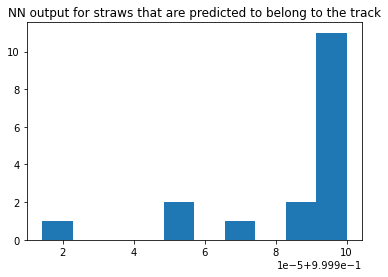

RMS = 0.0000


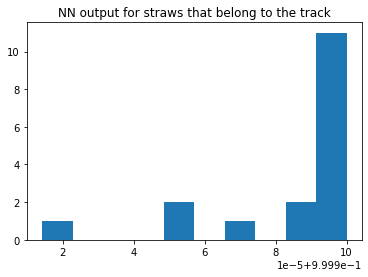

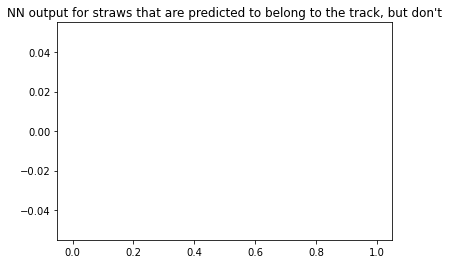

seed 2 in detector middle


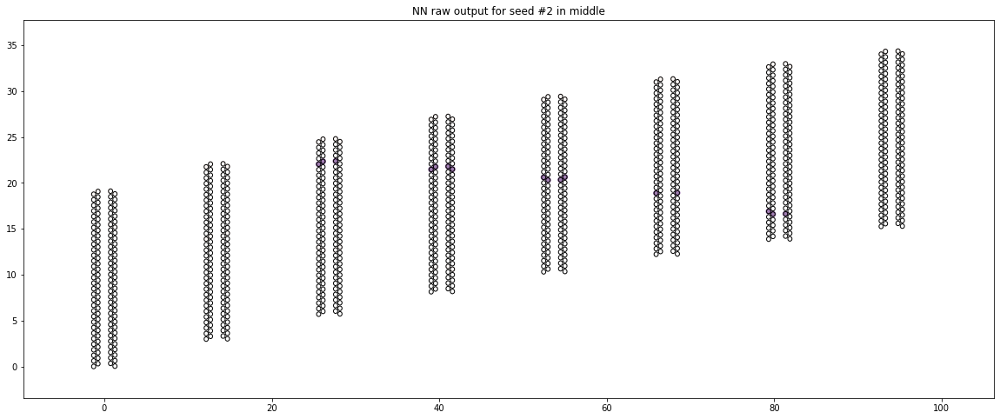

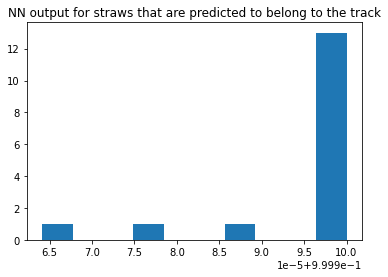

RMS = 0.0000


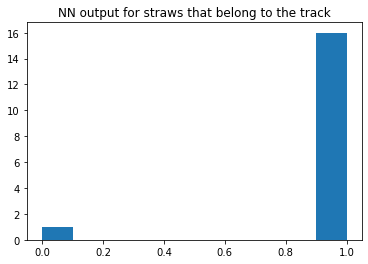

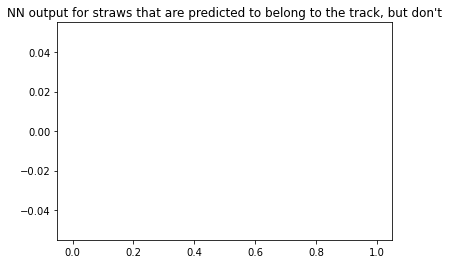

seed 0 in detector back


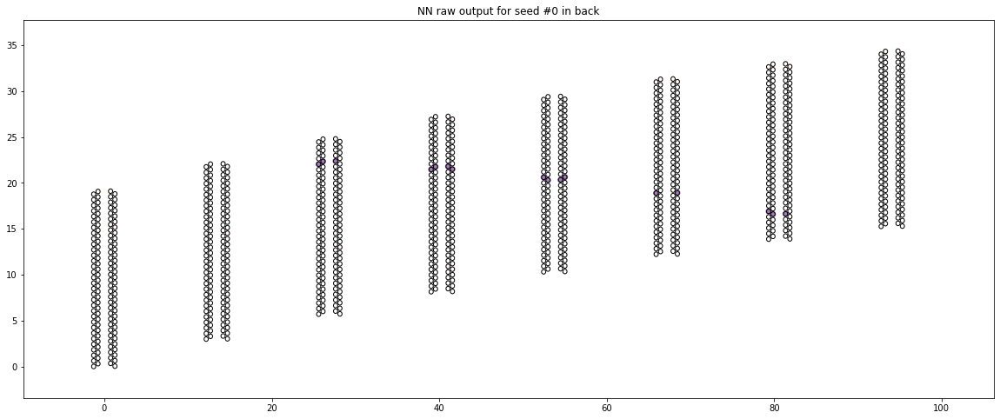

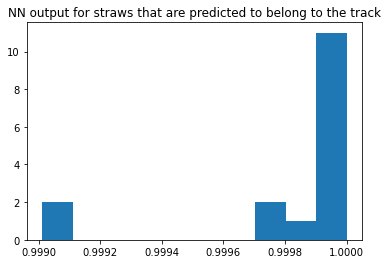

RMS = 0.0003


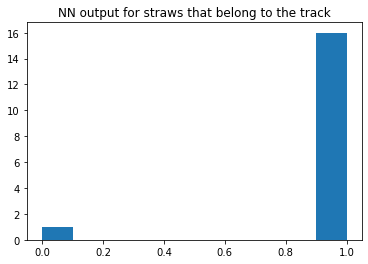

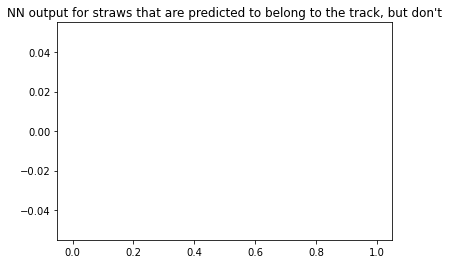

 Event # 4


No handles with labels found to put in legend.


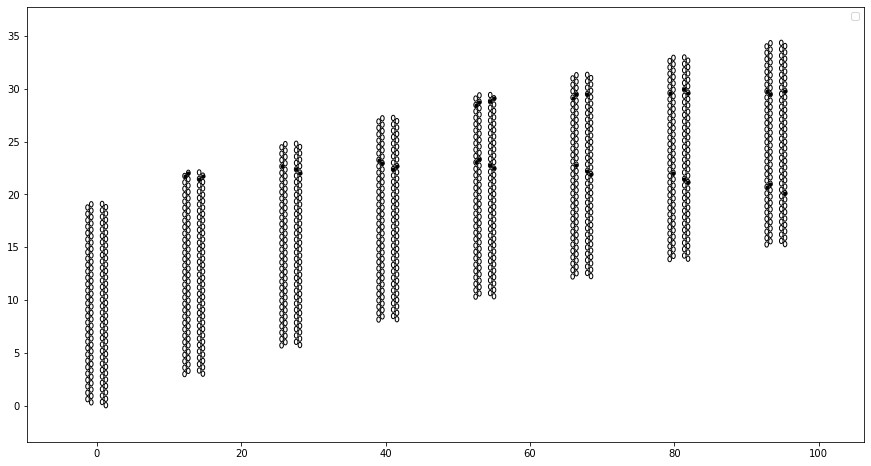

2 seeds in front
3 seeds in middle
6 seeds in back
seed 0 in detector front


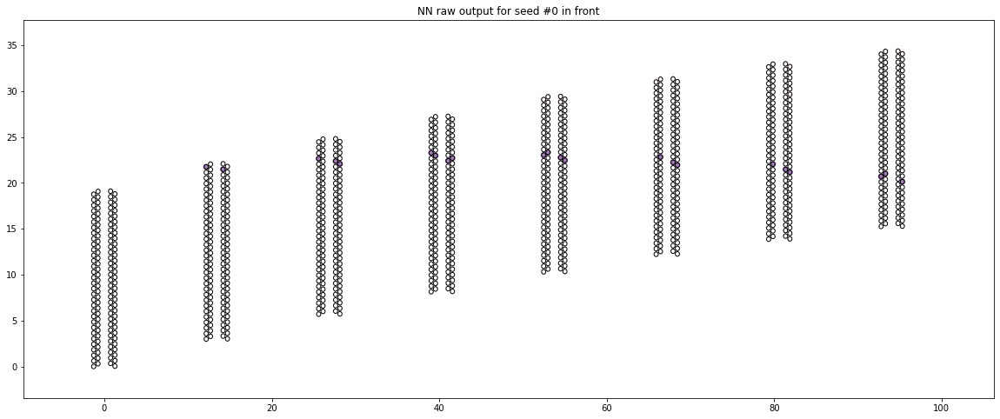

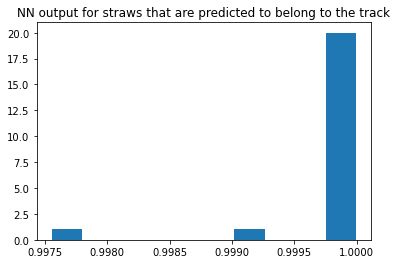

RMS = 0.0005


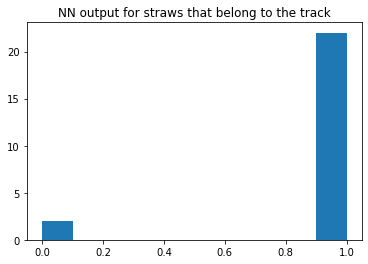

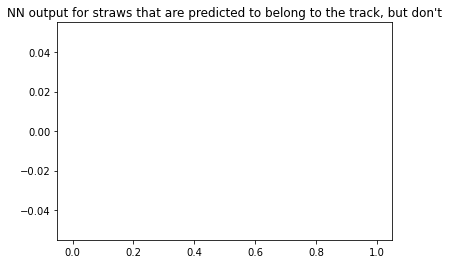

seed 1 in detector front


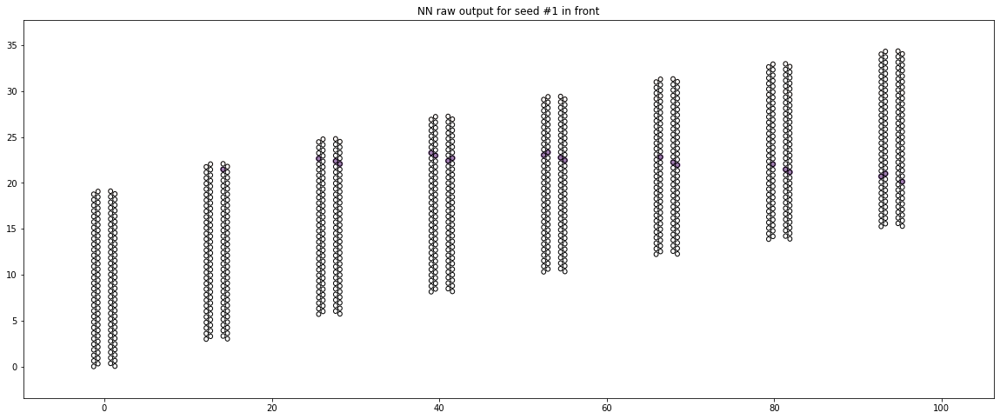

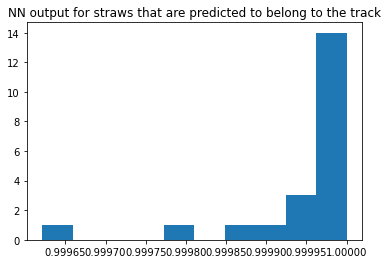

RMS = 0.0001


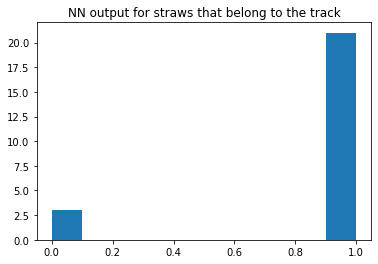

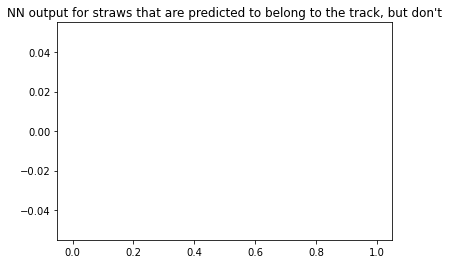

seed 0 in detector middle


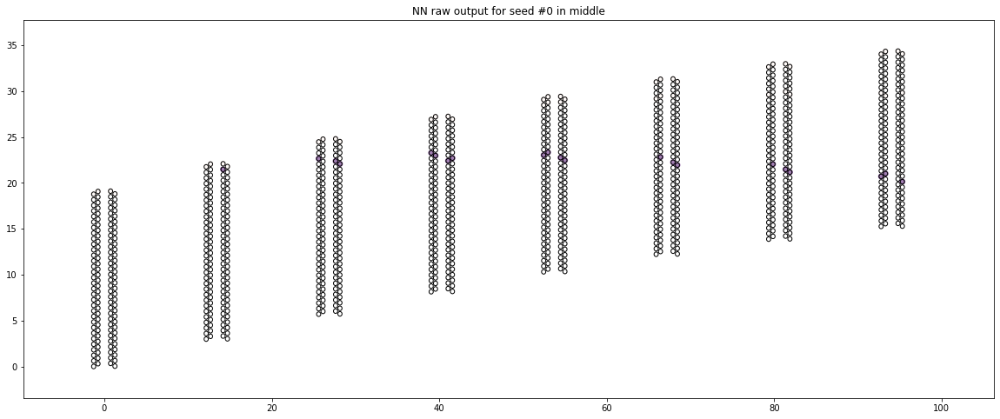

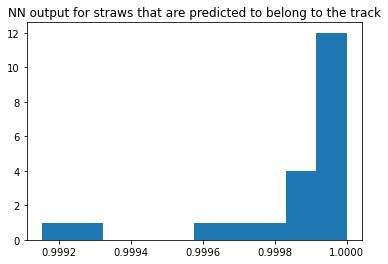

RMS = 0.0002


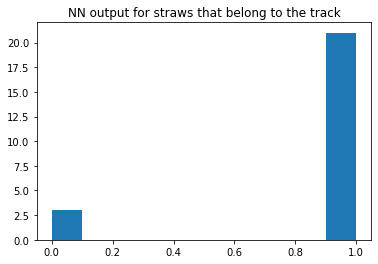

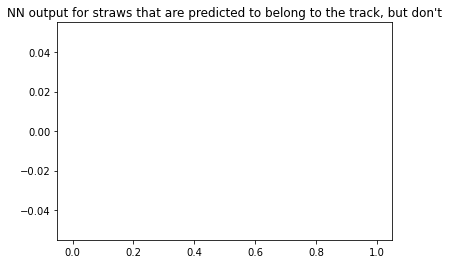

seed 1 in detector middle


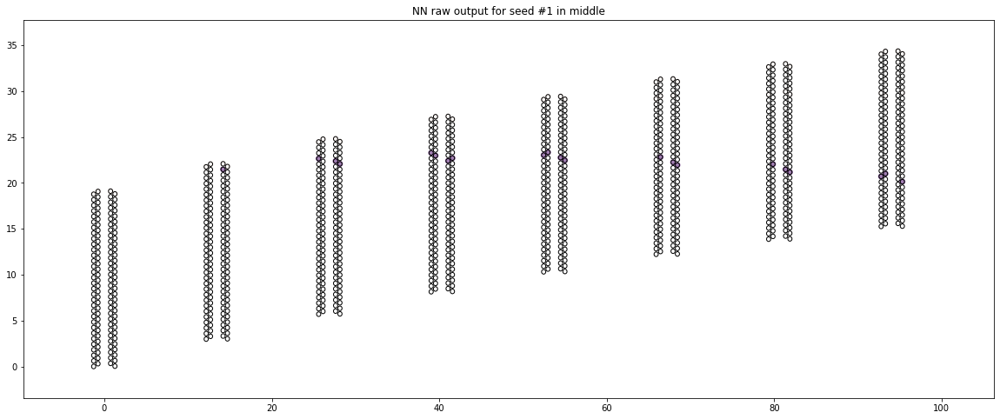

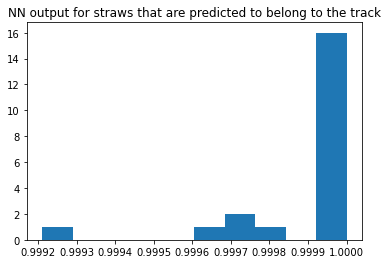

RMS = 0.0002


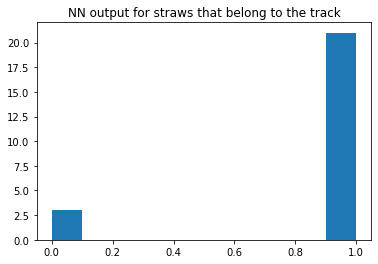

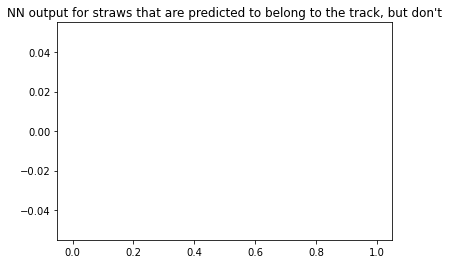

seed 2 in detector middle


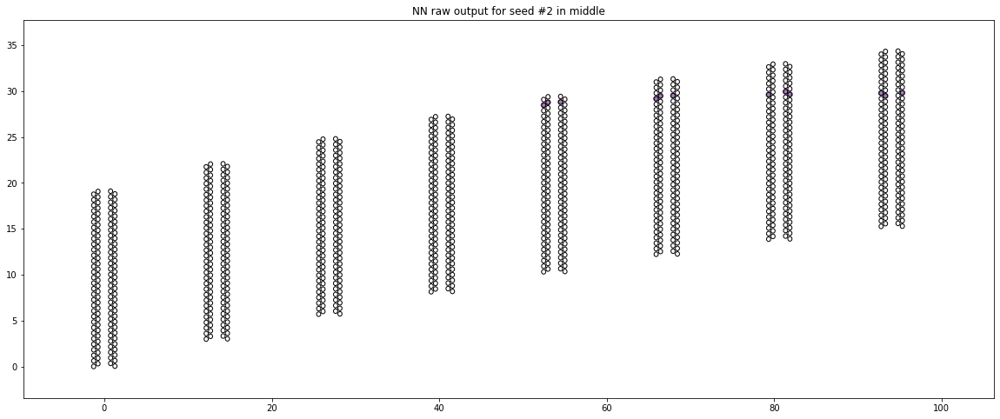

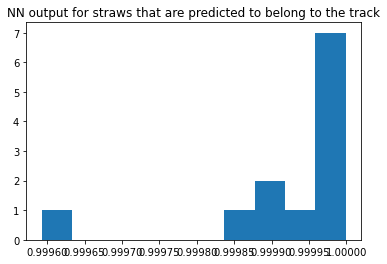

RMS = 0.0001


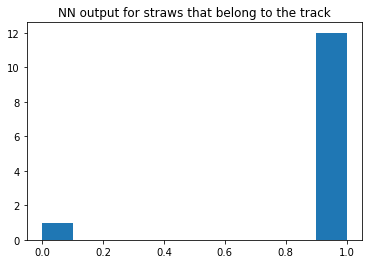

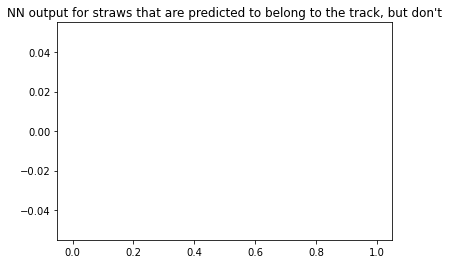

seed 0 in detector back


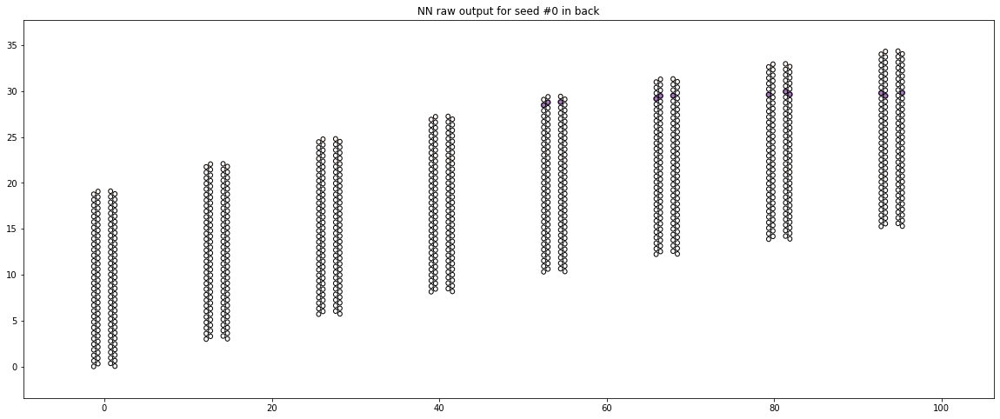

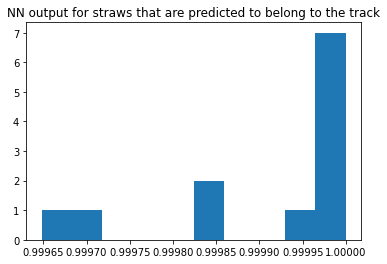

RMS = 0.0001


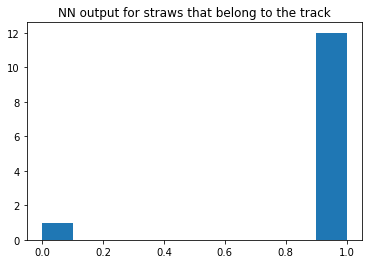

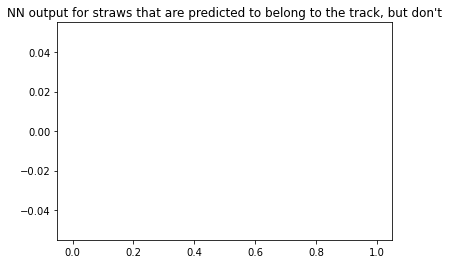

seed 1 in detector back


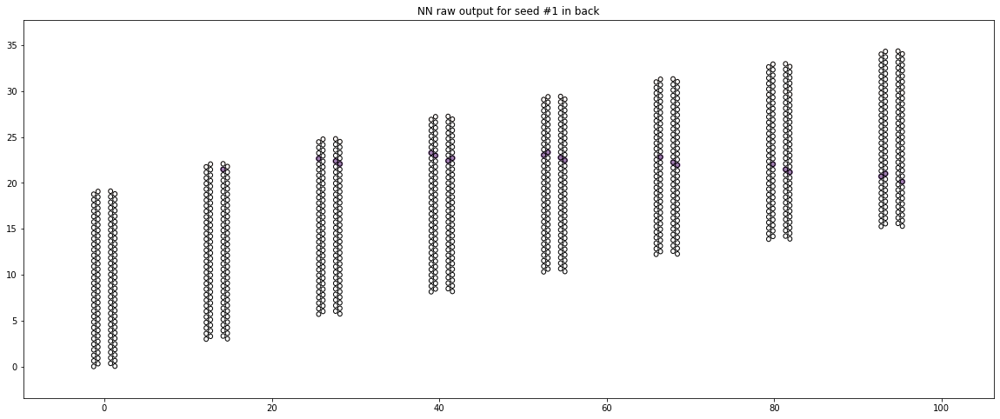

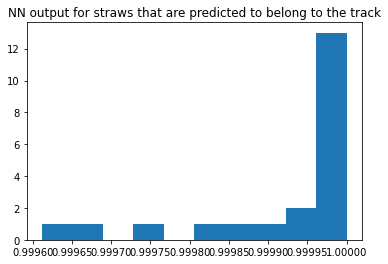

RMS = 0.0001


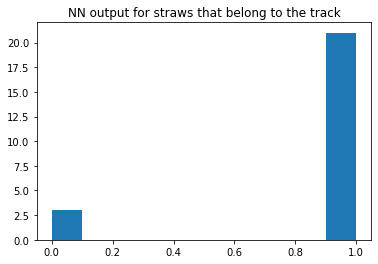

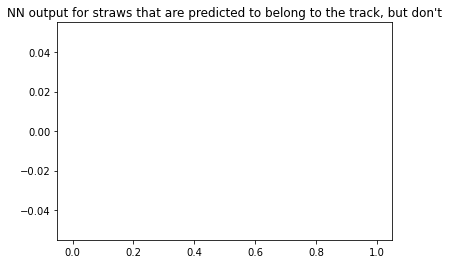

seed 2 in detector back


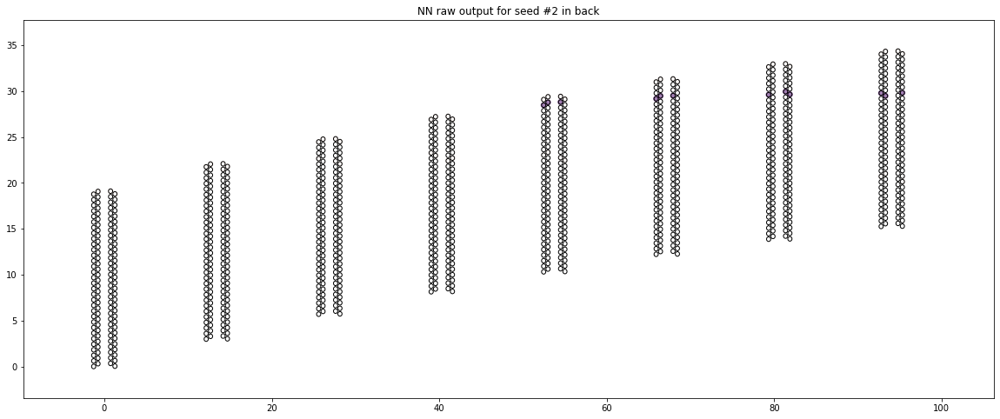

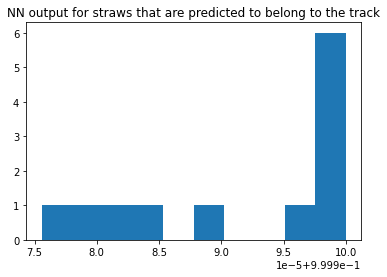

RMS = 0.0000


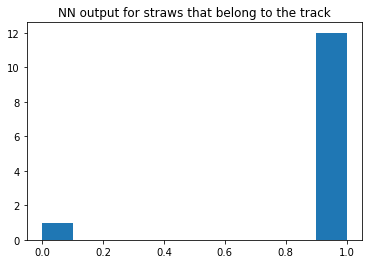

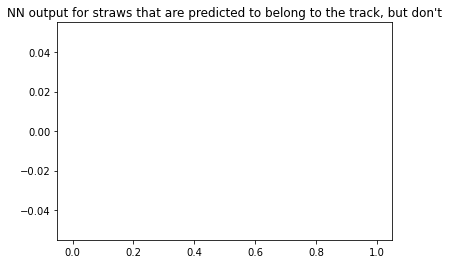

seed 3 in detector back


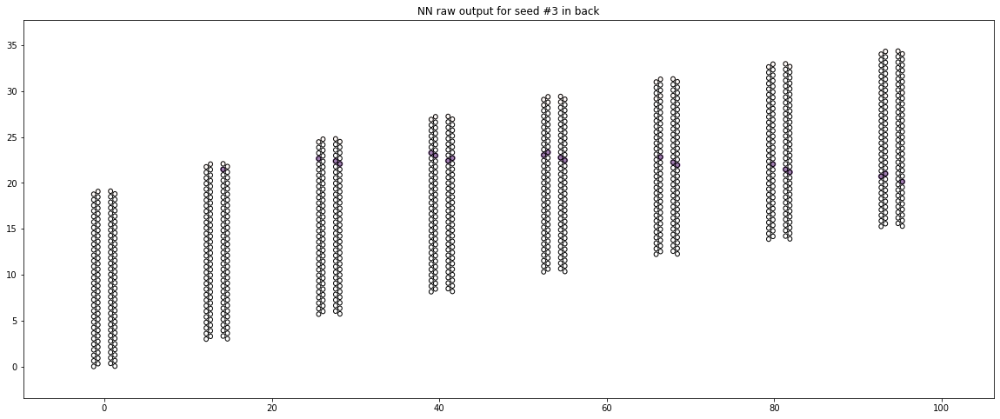

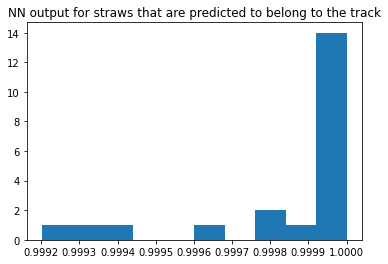

RMS = 0.0002


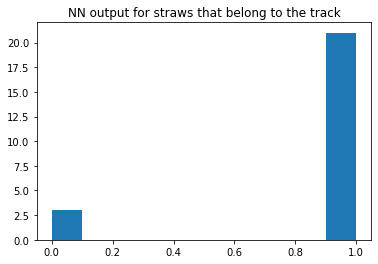

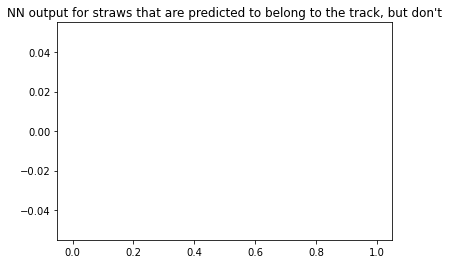

seed 4 in detector back


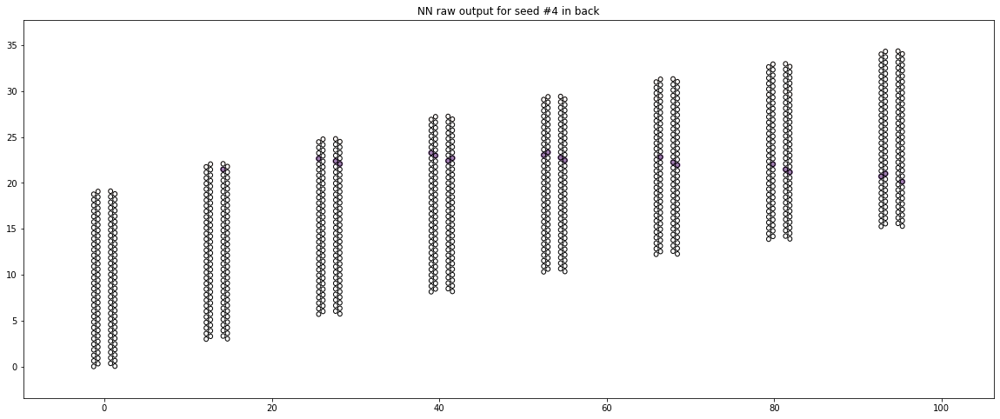

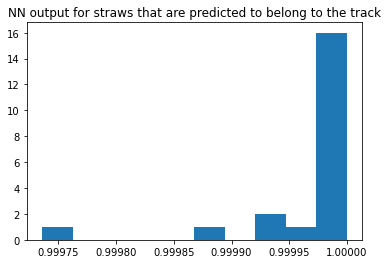

RMS = 0.0001


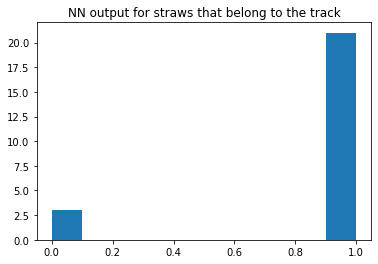

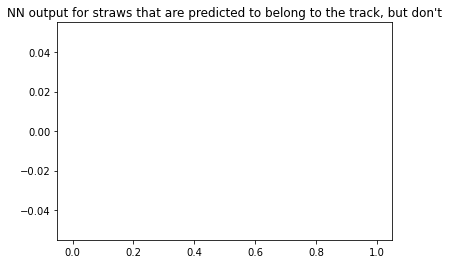

seed 5 in detector back


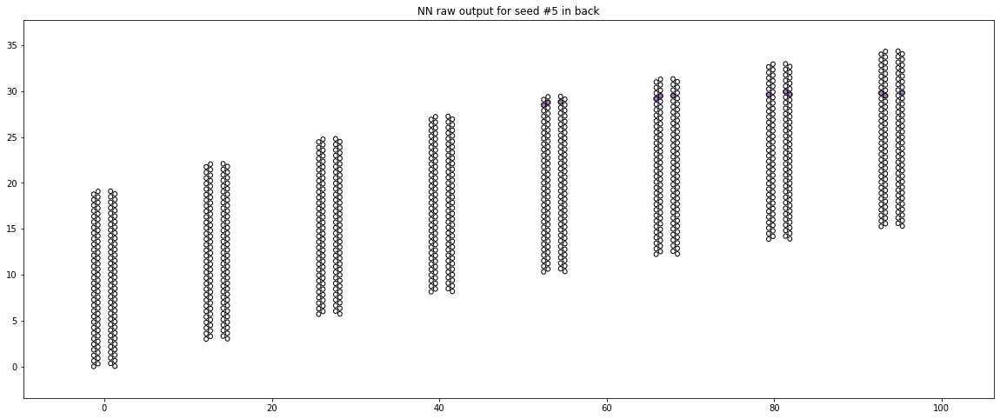

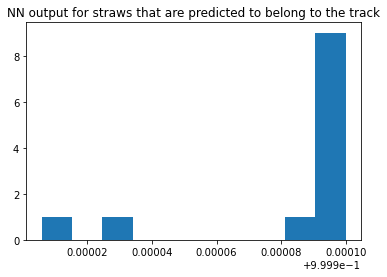

RMS = 0.0000


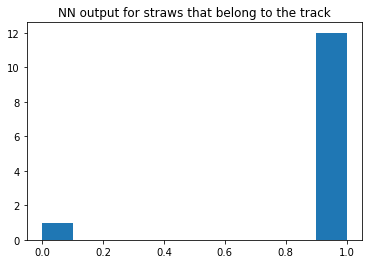

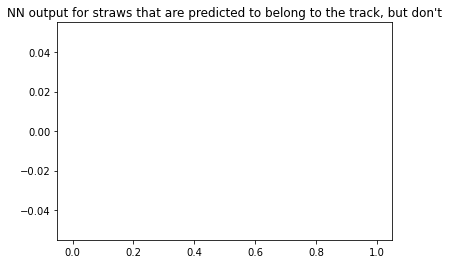

 Event # 5


No handles with labels found to put in legend.


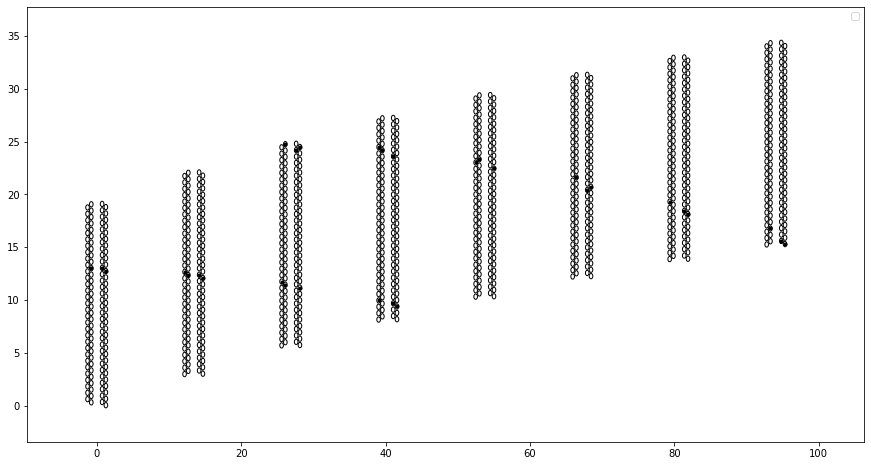

4 seeds in front
3 seeds in middle
3 seeds in back
seed 0 in detector front


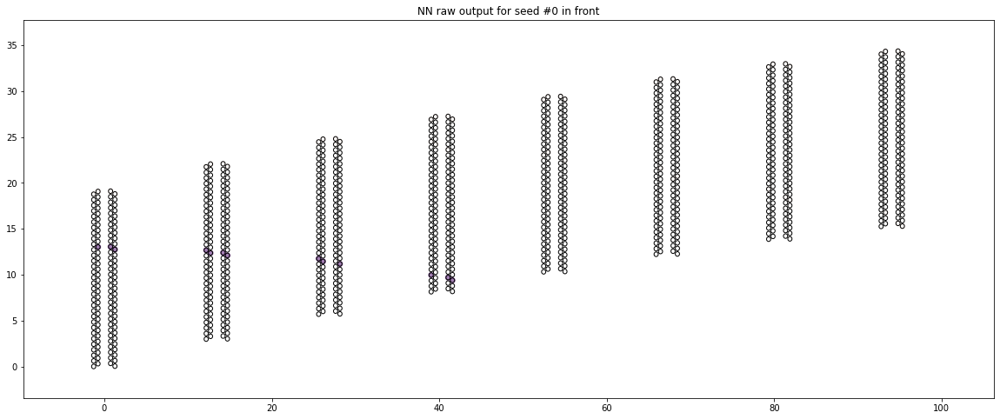

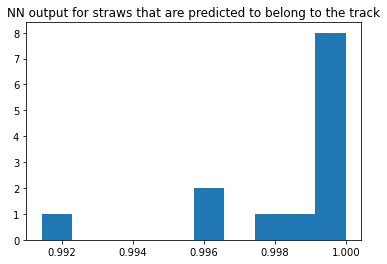

RMS = 0.0025


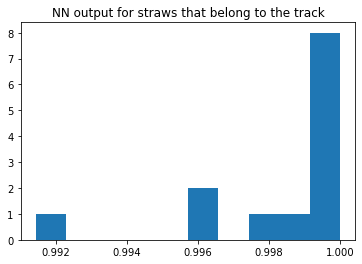

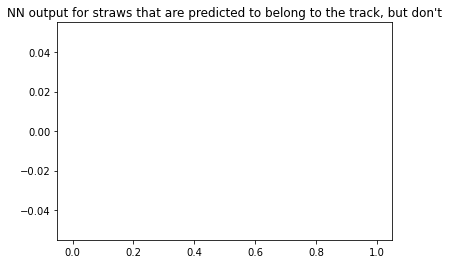

seed 1 in detector front


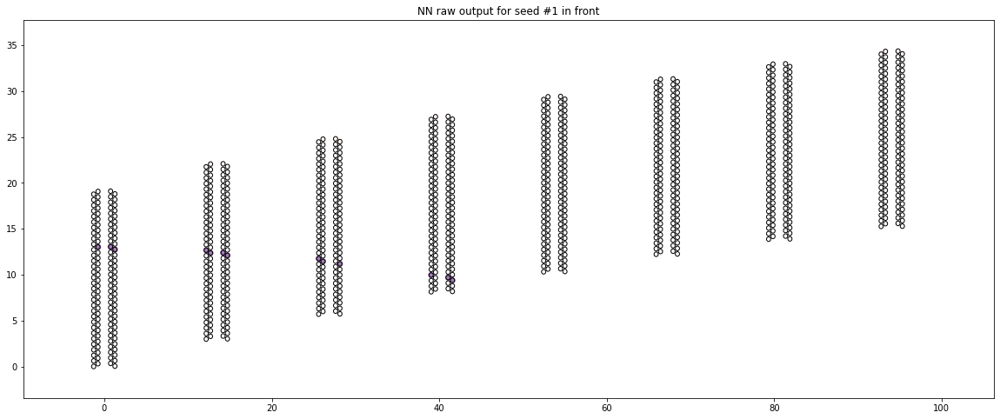

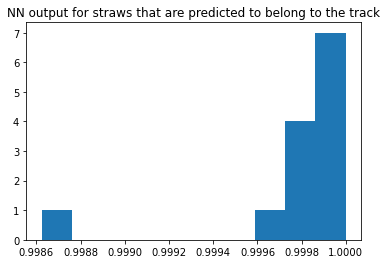

RMS = 0.0004


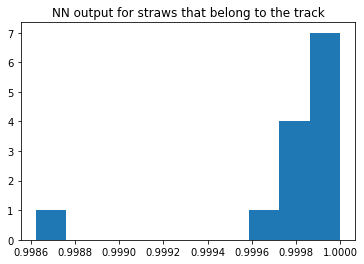

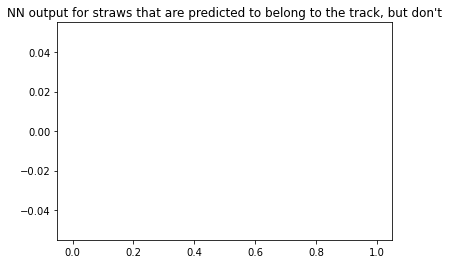

seed 2 in detector front


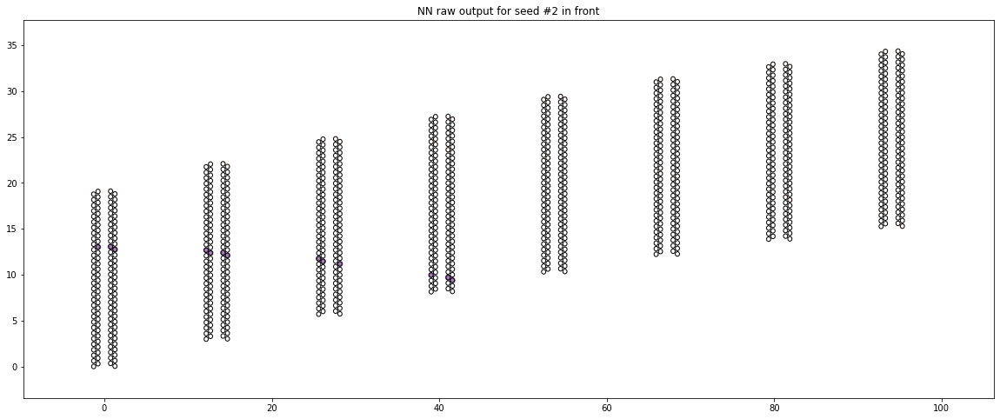

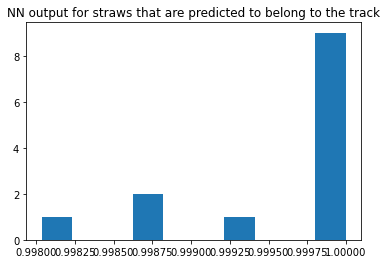

RMS = 0.0006


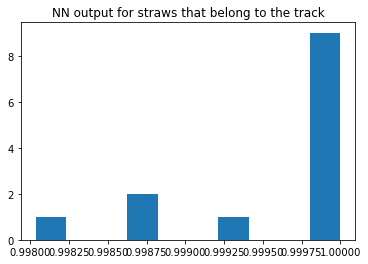

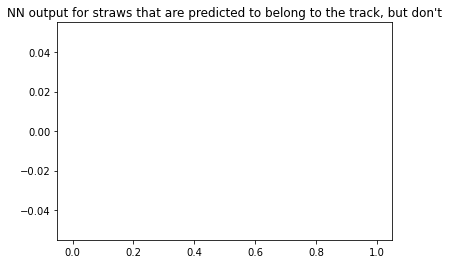

seed 3 in detector front


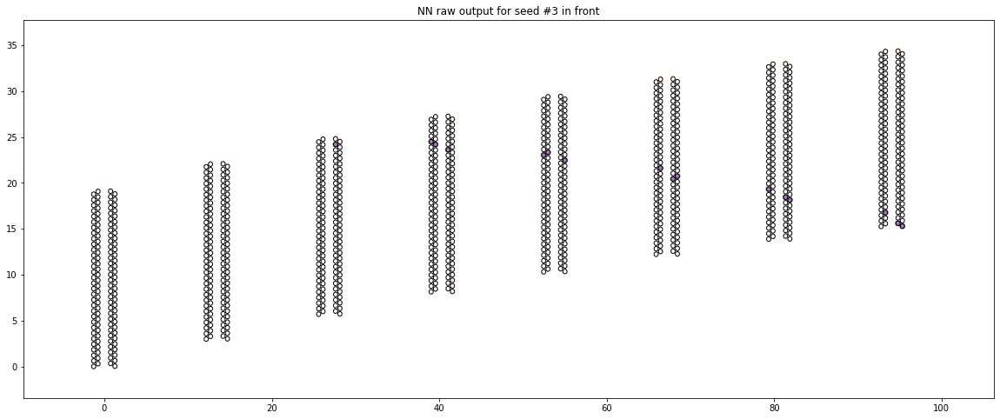

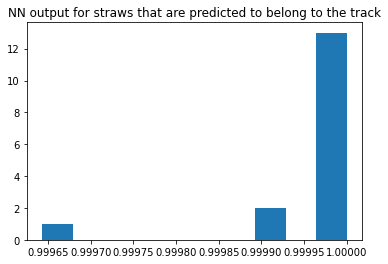

RMS = 0.0001


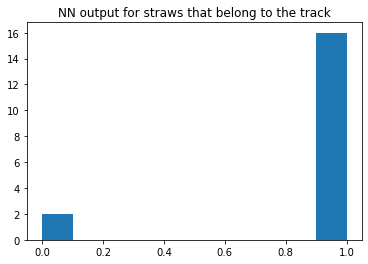

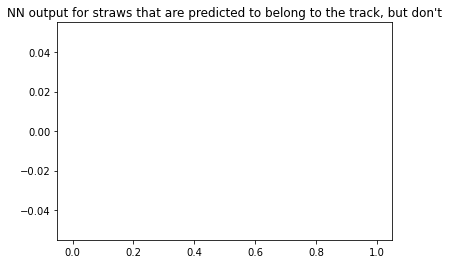

seed 0 in detector middle


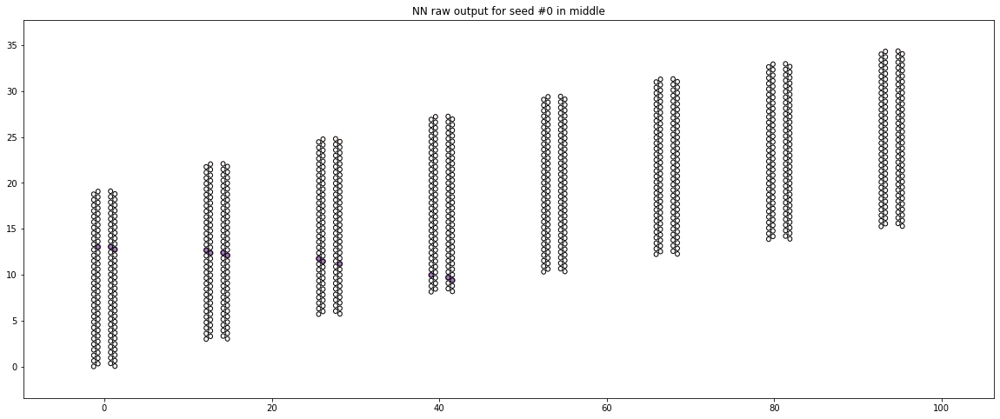

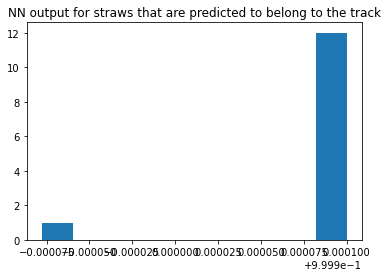

RMS = 0.0000


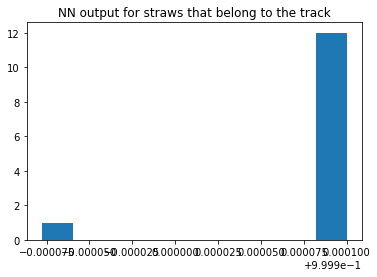

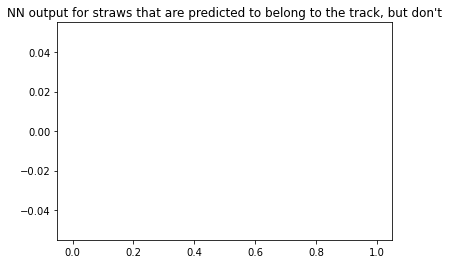

seed 1 in detector middle


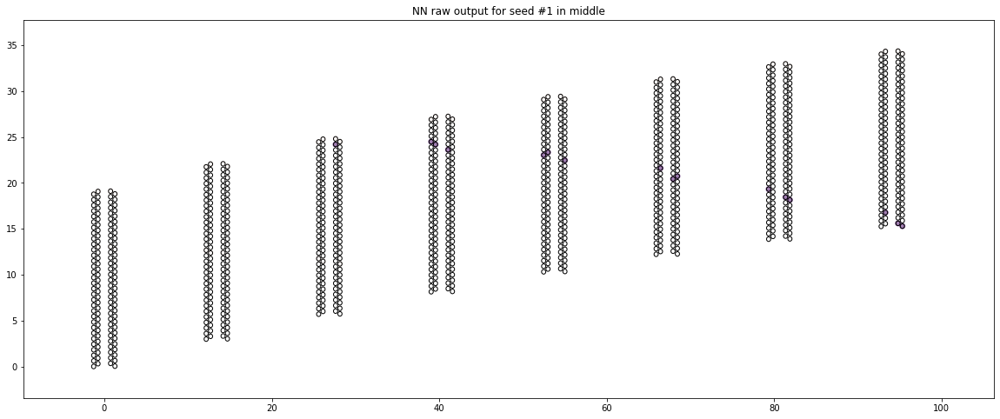

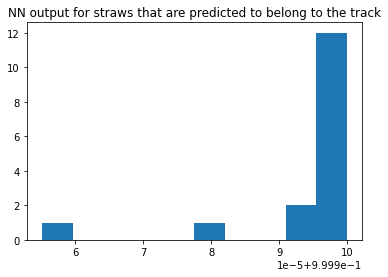

RMS = 0.0000


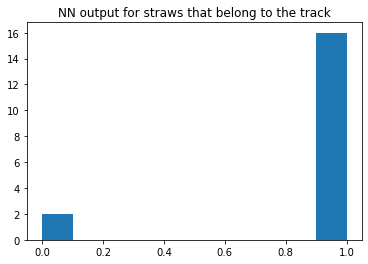

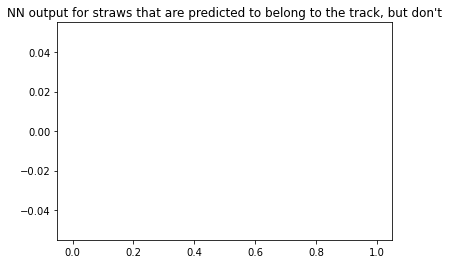

seed 2 in detector middle


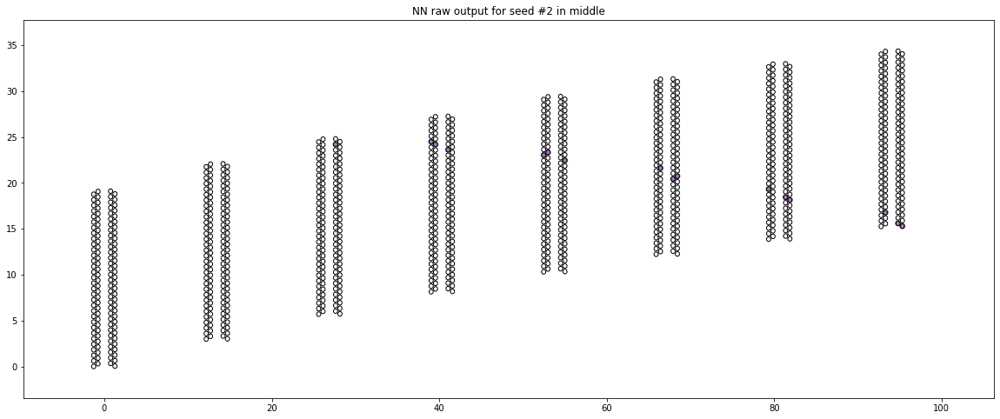

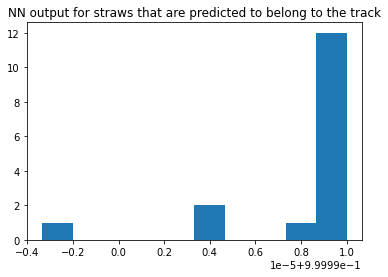

RMS = 0.0000


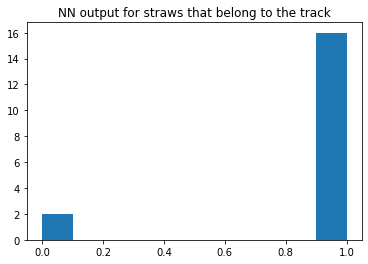

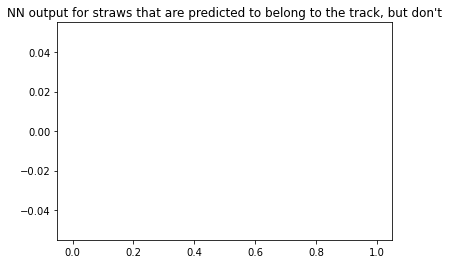

seed 0 in detector back


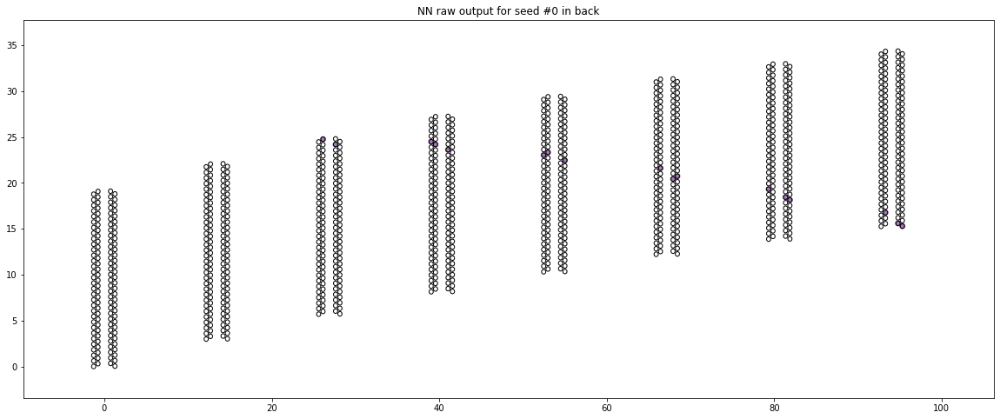

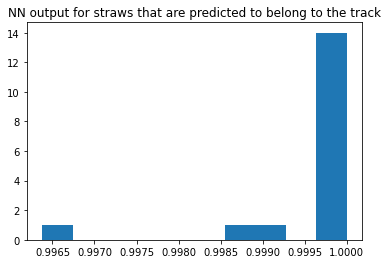

RMS = 0.0009


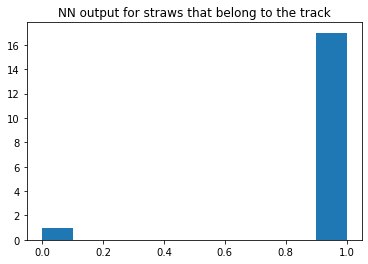

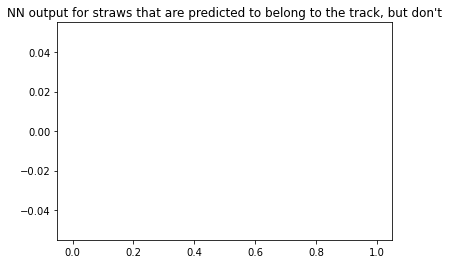

seed 1 in detector back


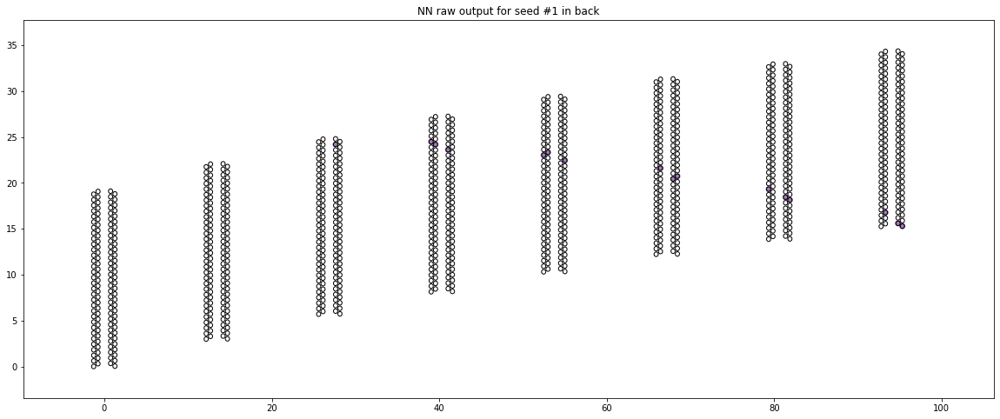

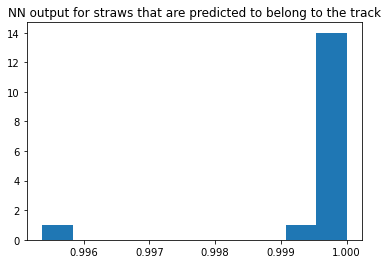

RMS = 0.0011


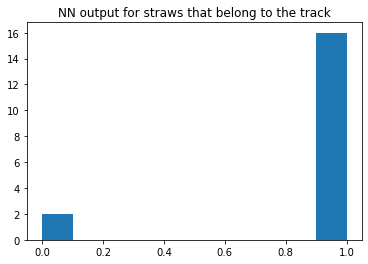

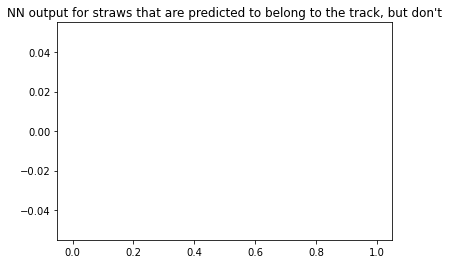

seed 2 in detector back


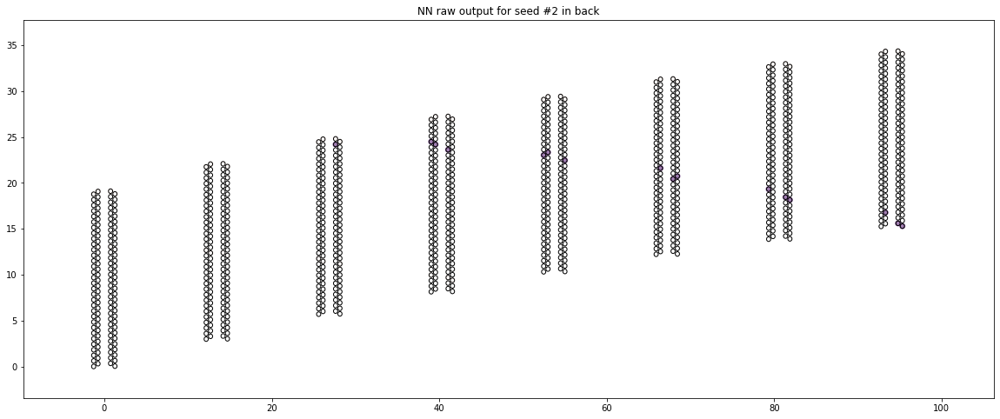

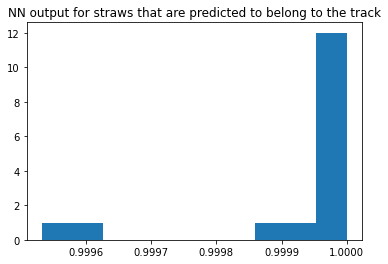

RMS = 0.0001


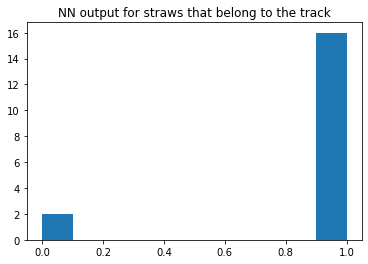

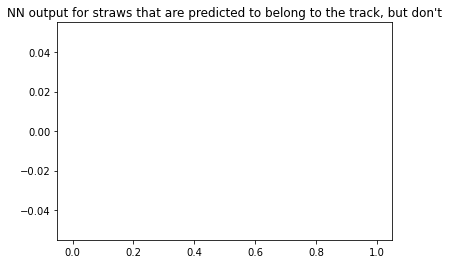

 Event # 6


No handles with labels found to put in legend.


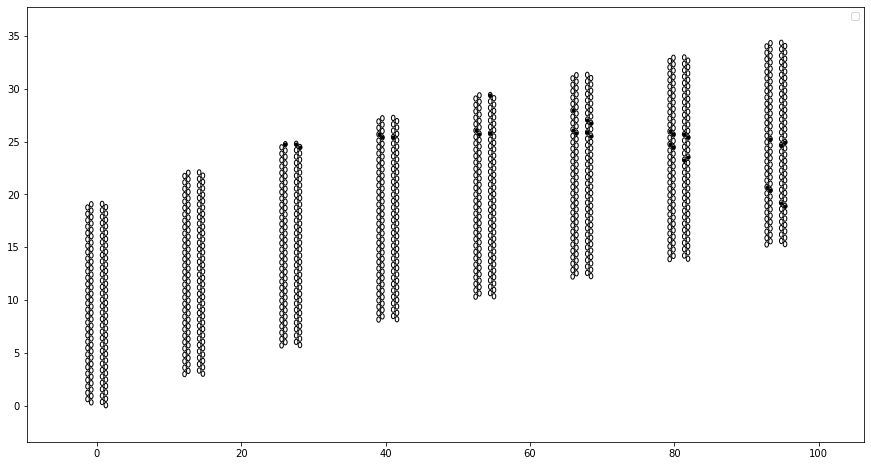

1 seeds in front
2 seeds in middle
2 seeds in back
seed 0 in detector front


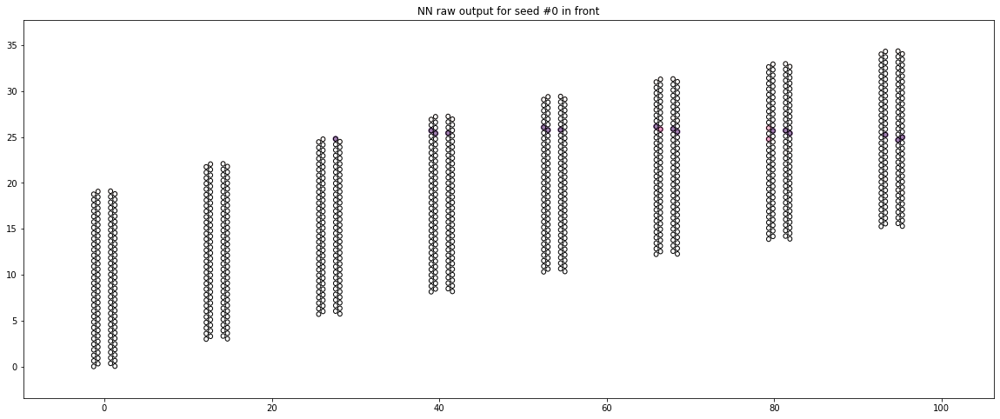

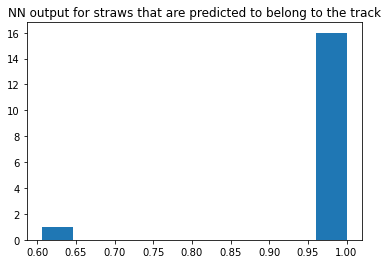

RMS = 0.0925


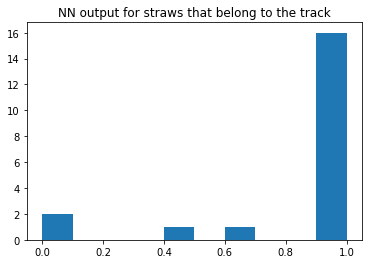

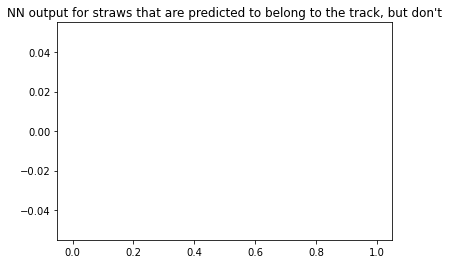

seed 0 in detector middle


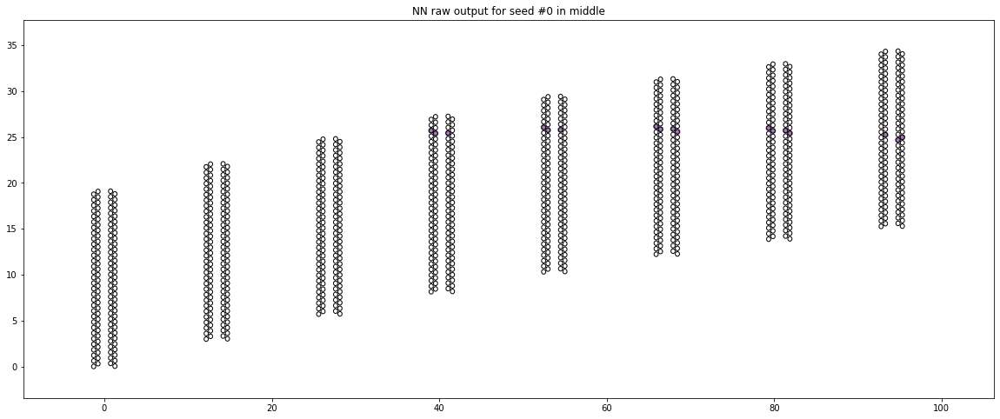

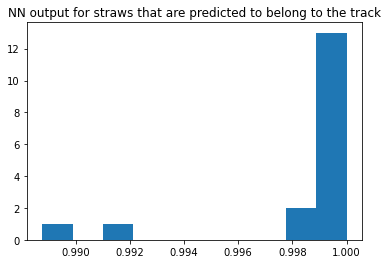

RMS = 0.0032


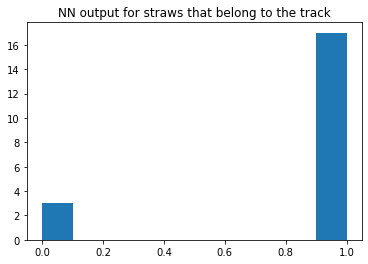

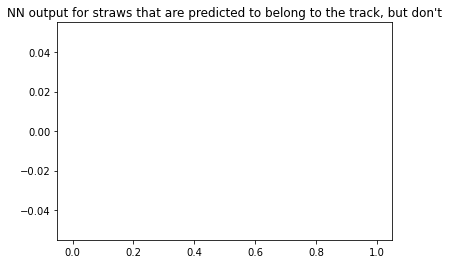

seed 1 in detector middle


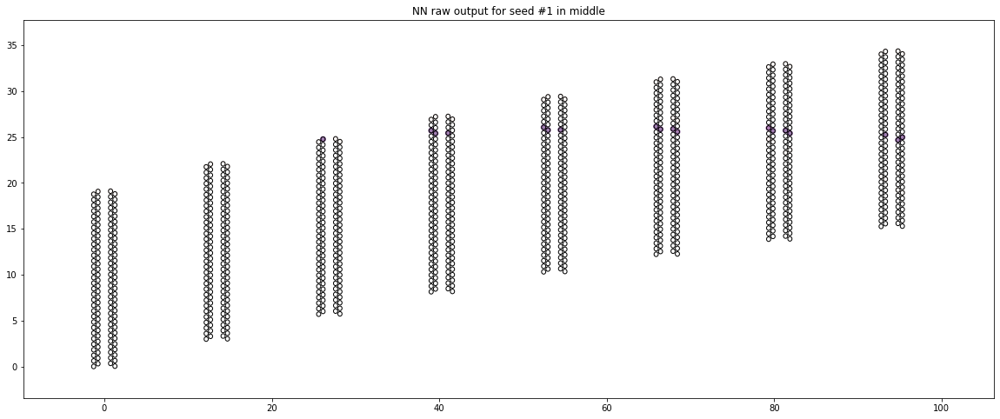

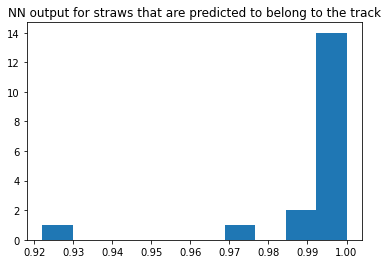

RMS = 0.0184


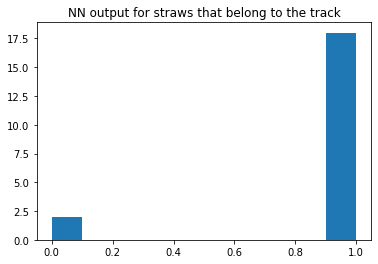

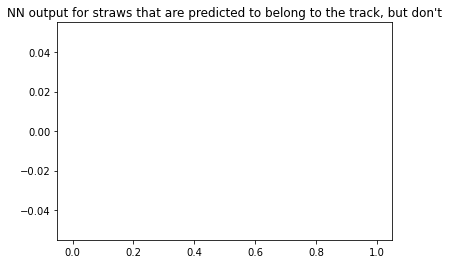

seed 0 in detector back


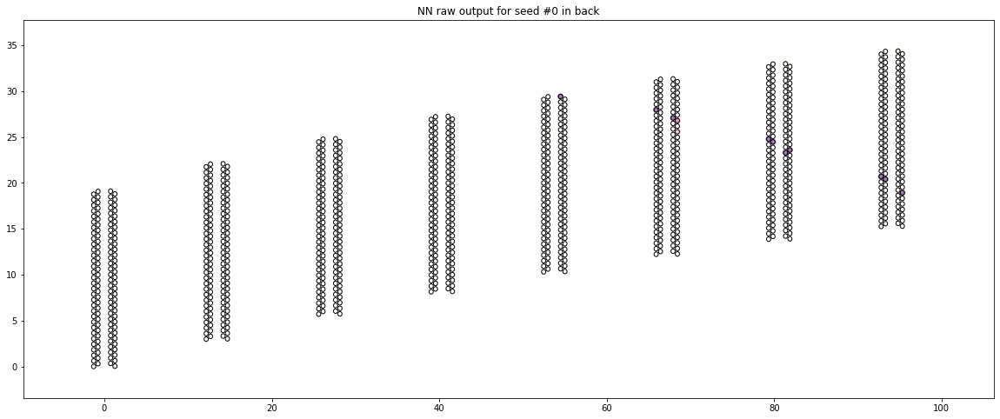

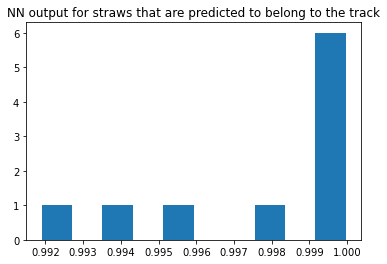

RMS = 0.0028


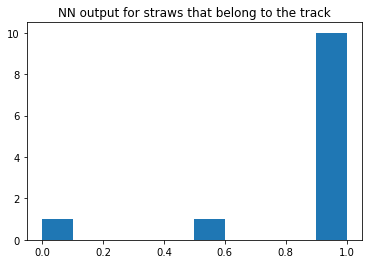

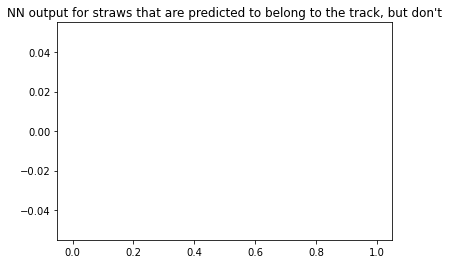

seed 1 in detector back


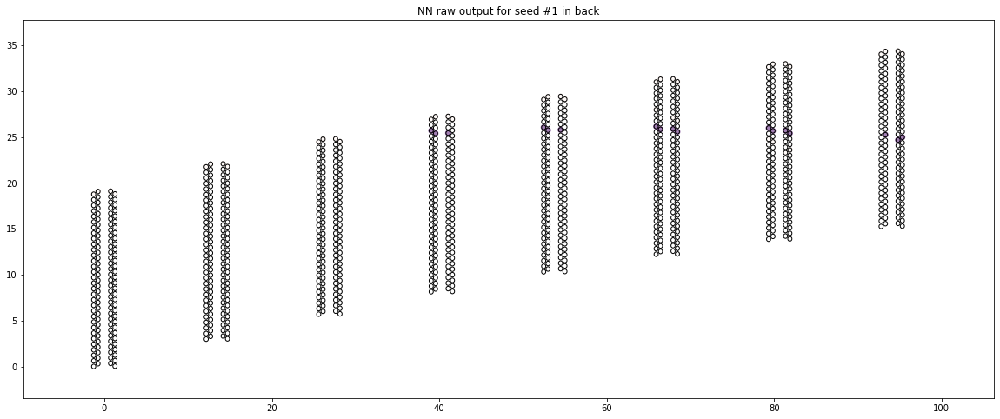

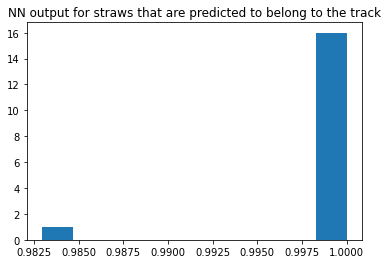

RMS = 0.0040


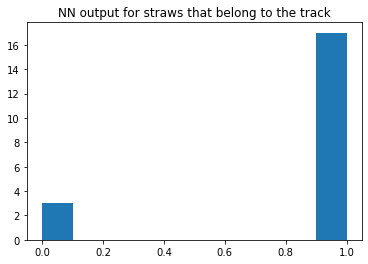

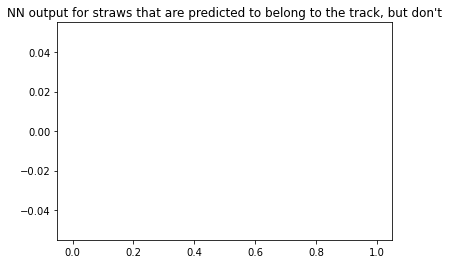

 Event # 7


No handles with labels found to put in legend.


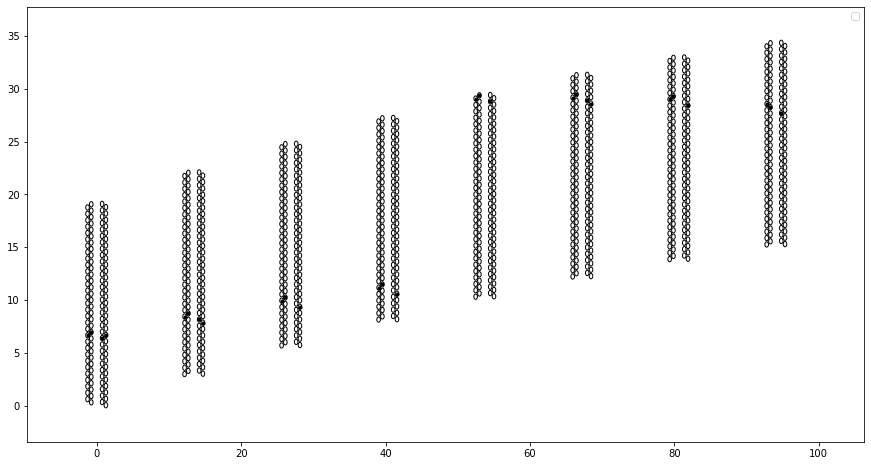

3 seeds in front
2 seeds in middle
3 seeds in back
seed 0 in detector front


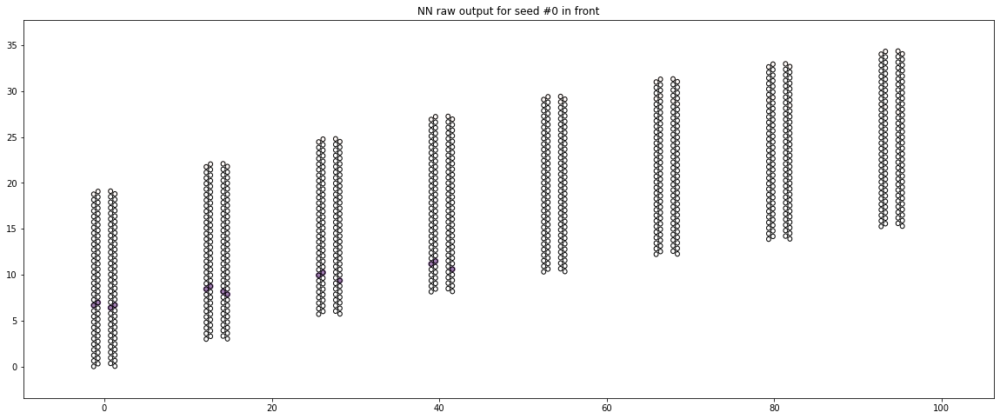

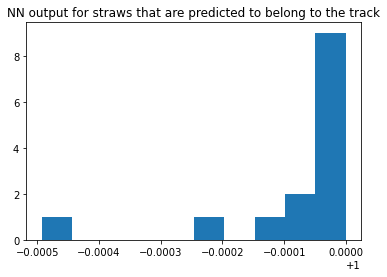

RMS = 0.0001


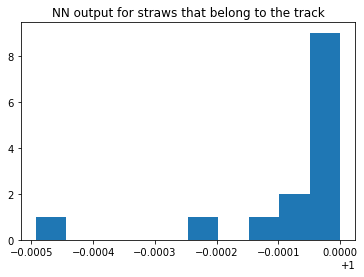

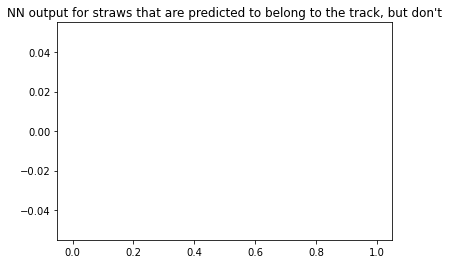

seed 1 in detector front


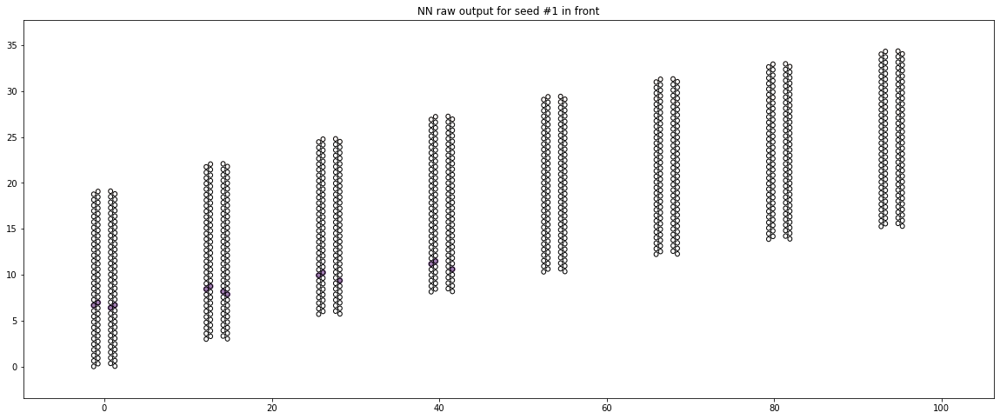

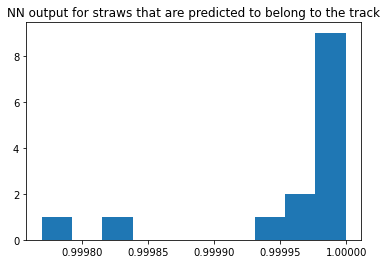

RMS = 0.0001


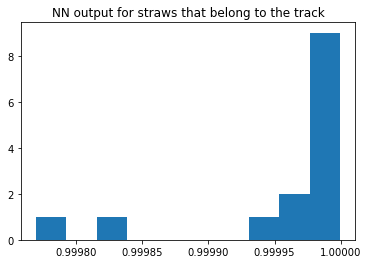

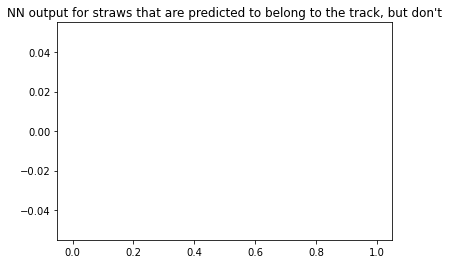

seed 2 in detector front


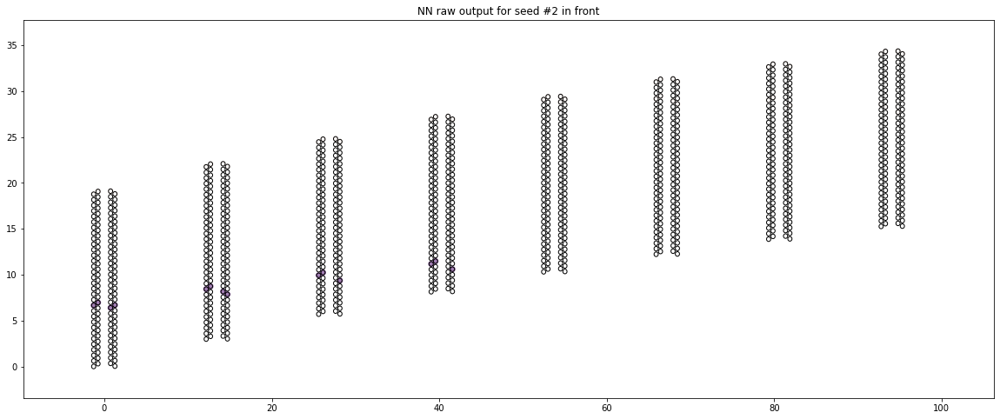

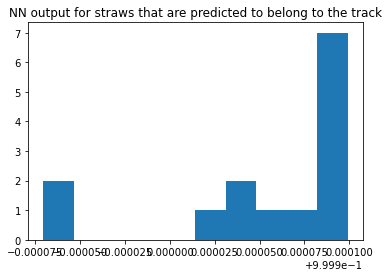

RMS = 0.0001


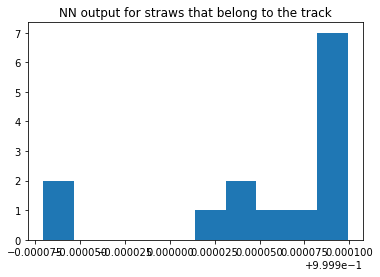

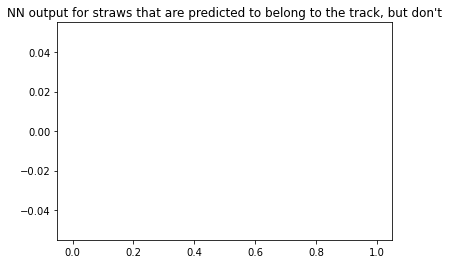

seed 0 in detector middle


KeyboardInterrupt: 

In [39]:
range_start=2
for i_evt in range(range_start,range_start+10):
    print(' Event #', i_evt)
    plot_event_NNoutput(evts_hits_test[i_evt],evts_ids_test[i_evt])

 Event # 2
Event truth:


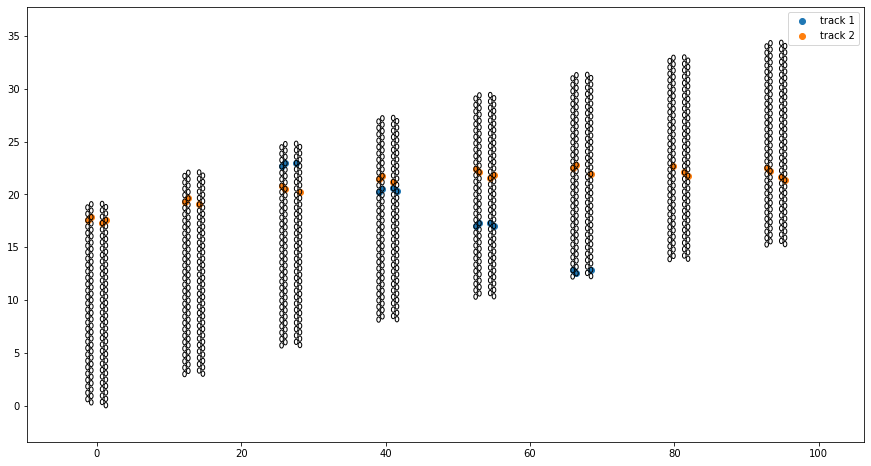

Searching for golden seeds
processing seed  0
min prediction =  0.9215231537818909
rms prediction =  0.014808858965246436
nhits_track =  27.0
processing seed  1
min prediction =  0.9332187175750732
rms prediction =  0.012564939257793069
nhits_track =  27.0
processing seed  2
min prediction =  0.7732687592506409
rms prediction =  0.04352383024845374
nhits_track =  26.0
processing seed  3
min prediction =  0.9063185453414917
rms prediction =  0.024607615553716083
nhits_track =  13.0
processing seed  4
min prediction =  0.9871587753295898
rms prediction =  0.003846482358771117
nhits_track =  14.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.8420478105545044
rms prediction =  0.029816084215034563
nhits_track =  27.0
processing seed  6
min prediction =  0.9951629638671875
rms prediction =  0.0013585987695832473
nhits_track =  13.0
Accepting GOLDEN track with seed id #6

processing seed  7
min prediction =  0.9186352491378784
rms prediction =  0.015549755873

model_input for seed 1 layer 8 before hit removal :  [ 0. 26.  0.  0. 29.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  8 28 4
Removing golden hit (8,28) at loc4 from seed 1
model_input for that seed layer after removal :  [ 0. 26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
model_input for seed 1 layer 9 before hit removal :  [ 0. 25.  0.  0. 29.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  9 28 4
Removing golden hit (9,28) at loc4 from seed 1
model_input for that seed layer after removal :  [ 0. 25.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
model_input for seed 1 layer 10 before hit removal :  [29.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  10 28 0
Removing golden hit (10,28) at loc0 from seed 1
model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 1 layer 13 before hit removal :  [ 0. 21.  0. 23.  0.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  13 20 1
Removing golden hit (13,2

No handles with labels found to put in legend.


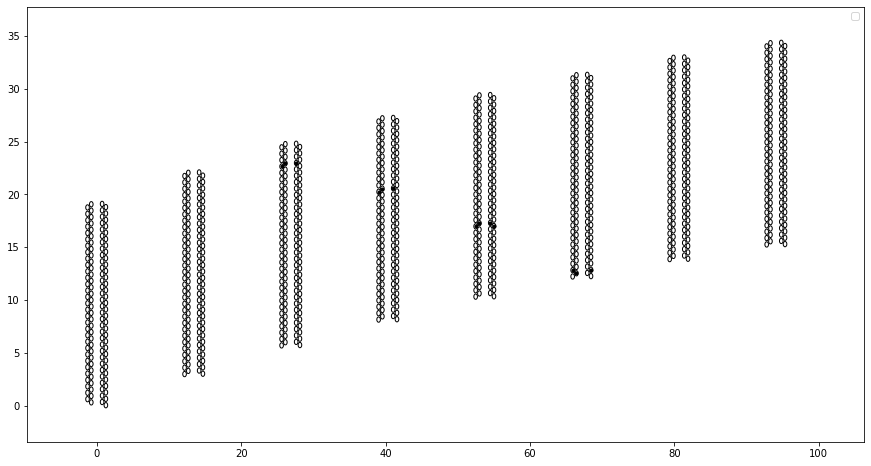

processing new good seed  8
best seed, max prediction min, [merged seeds] :  8 0.9885828495025635 [8]
model input for seed_id 0 : 
 [[ 0.  0.  0.  0. 30.  0.  0.  0.  0.  0.  1.  0.]
 [ 0.  0.  0.  0.  0. 30.  0.  0.  0.  0.  0.  1.]
 [ 0. 29.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0. 30.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0. 28.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 28.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 27.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 25.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 25.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 23.  0.  0. 21.  0.  0.  0.  0.  0.  0.]
 [ 0. 23.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 21. 22.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 21.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 21.  0.  0.  0.  0.  0.  0.  0.]
 

No handles with labels found to put in legend.


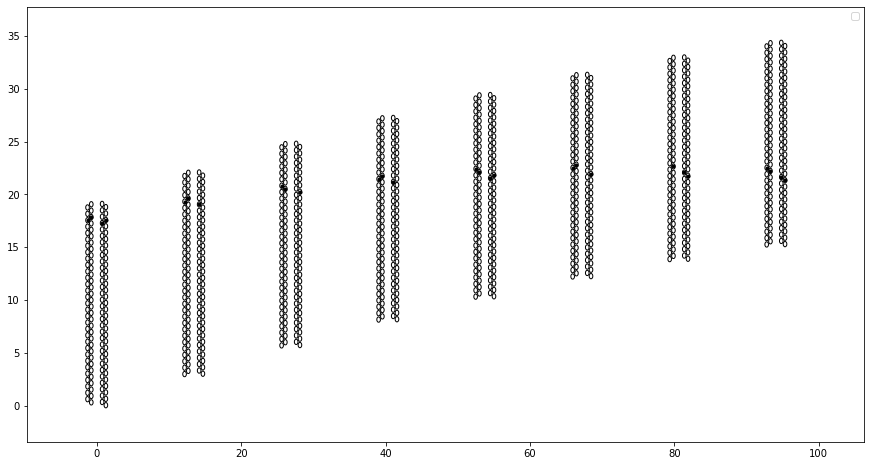

Searching for golden seeds
processing seed  6
min prediction =  0.7852656245231628
rms prediction =  0.0763491455691203
nhits_track =  14.0
processing seed  8
min prediction =  0.6223781704902649
rms prediction =  0.11059492952263579
nhits_track =  20.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 0,  1,  2,  3,  4,  5,  6,  8,  8,  9,  9, 10, 11, 12, 12, 13, 13,
       14, 14, 15, 16, 16, 17, 17, 18, 18, 19, 19, 20, 20, 21, 21, 23, 23,
       25, 26, 27, 28, 29, 30, 31]), array([ 2,  0,  2,  4,  5,  1,  0,  1,  5,  1,  2,  3,  4,  2,  3,  1,  3,
        1,  3,  0,  5, 11,  5, 11,  3,  9,  3,  9,  2,  3,  0,  5,  1,  2,
        0,  4,  5,  3,  5,  0,  2]))
Seed #1, hits:  (array([ 0,  1,  2,  3,  4,  5,  6,  8,  9, 11, 12, 12, 13, 14, 14, 15, 16,
       16, 17, 17, 18, 18, 19, 19, 20, 21, 23, 25, 26, 27, 28, 29, 30, 31]), array([ 4,  2,  0,  4,  3,  3,  4,  5,  0,  3,  2,  5,  0,  0,  3,  0,  5,
       11,  2,  8,  

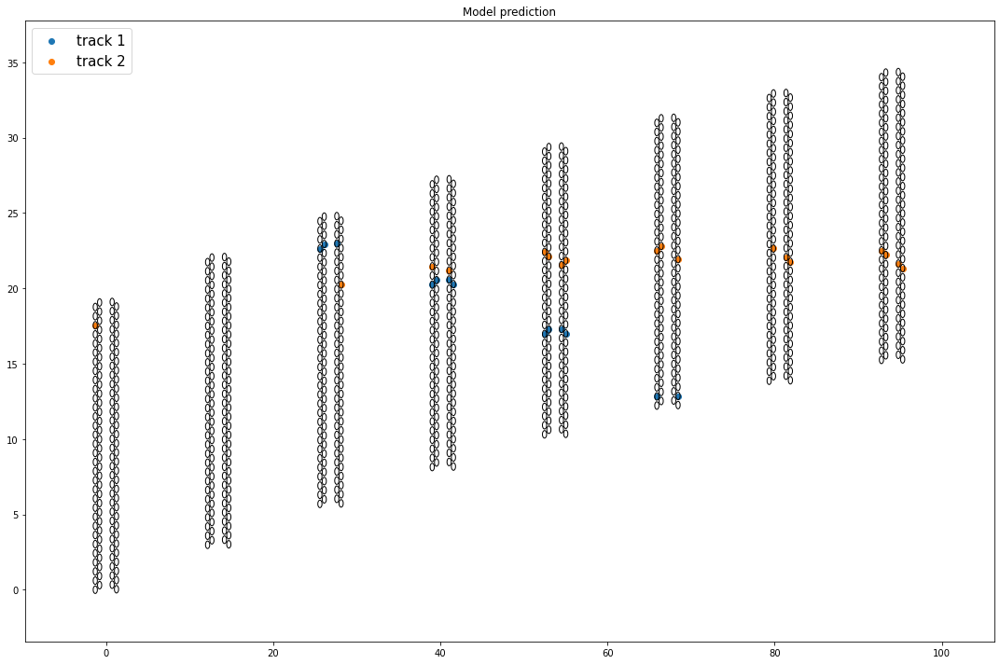

 Event # 3
Event truth:


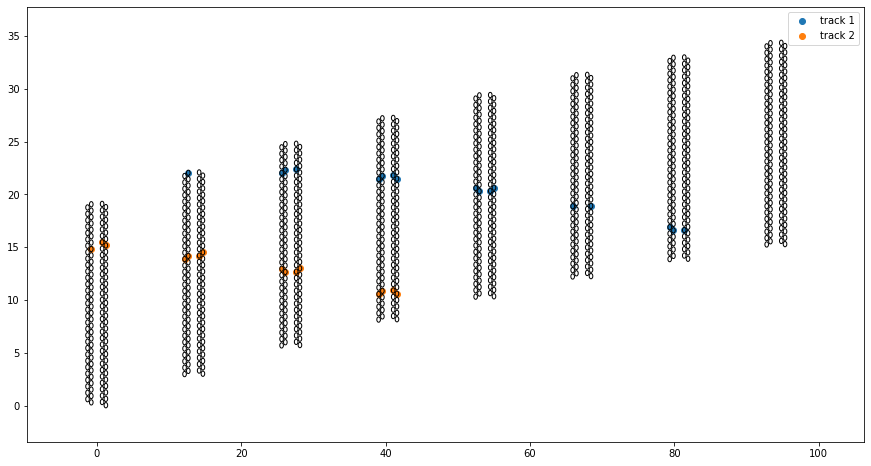

Searching for golden seeds
processing seed  0
min prediction =  0.9943510293960571
rms prediction =  0.0014699941564690147
nhits_track =  15.0
Accepting GOLDEN track with seed id #0

processing seed  1
min prediction =  0.998852014541626
rms prediction =  0.0003503251902174941
nhits_track =  15.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.9940027594566345
rms prediction =  0.0014847241258032148
nhits_track =  15.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.999944806098938
rms prediction =  1.575752352336577e-05
nhits_track =  16.0
Accepting GOLDEN track with seed id #3

processing seed  4
min prediction =  0.9993579983711243
rms prediction =  0.00018974414335876
nhits_track =  15.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.9990676045417786
rms prediction =  0.00031040666431620236
nhits_track =  16.0
Accepting GOLDEN track with seed id #5

processing seed  6
min prediction =  0.9

No handles with labels found to put in legend.


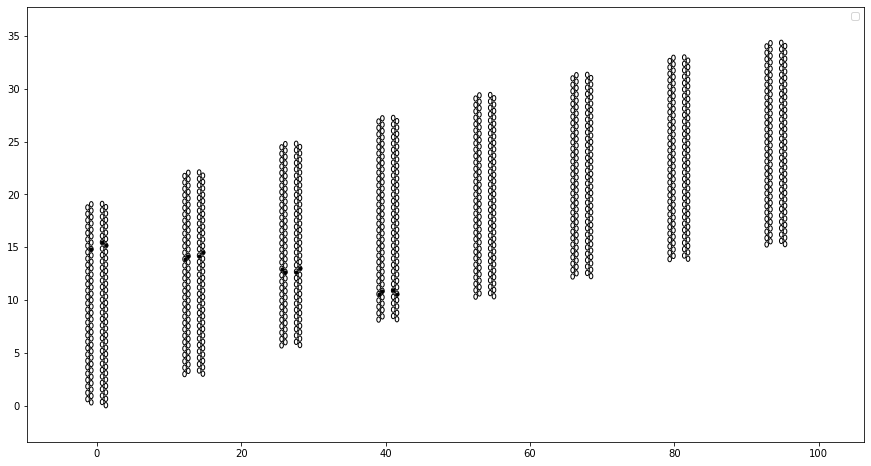

processing new good seed  3
best seed, max prediction min, [merged seeds] :  3 0.999944806098938 [3]
model input for seed_id 4 : 
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 25.  0.  0.  0.  0.  0.  1.]
 [26.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0. 26.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0. 19.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0. 19.  0. 32.  0.  0.  0.  1.  0.  0.  0.]
 [ 0.  0.  0. 19.  0.  0.  0.  0.  0.  1.  0.  0.]
 [20.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 28. 13.  0.  0.  0.  0.  0.  1.  0.]
 [ 0.  0. 28.  0. 12.  0.  0.  0.  0.  0.  1.  0.]
 [12.  0.  0. 28.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0. 13.  0.  0.  0.  0.  0.  1.  0.  0.  0.]
 [ 5.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.  0.  1.  0.  0.  0.]
 [ 0.  0.  5.  0.  0.  0.  0.  0.  1.  0.  0.  0.]
 [ 0. 18.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [

No handles with labels found to put in legend.


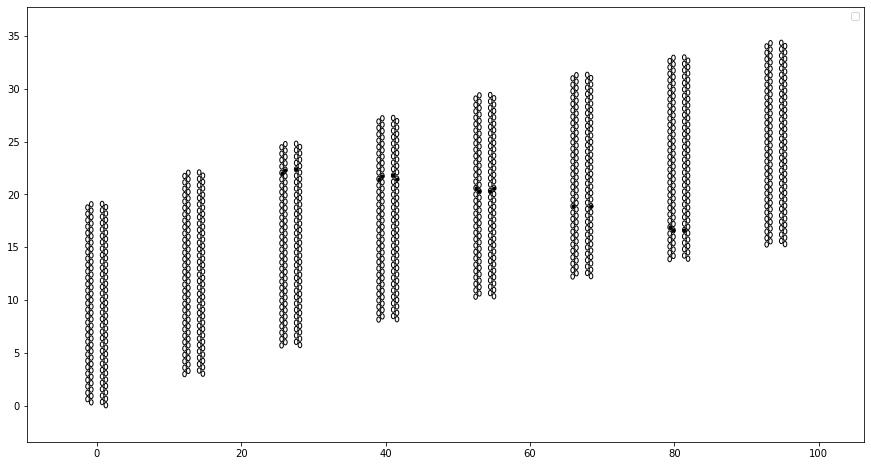

Searching for golden seeds
processing seed  4
min prediction =  0.9242300987243652
rms prediction =  0.01876693306718979
nhits_track =  15.0
processing seed  6
min prediction =  0.9798420667648315
rms prediction =  0.004930781553135207
nhits_track =  16.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 1,  1,  2,  2,  3,  3,  4,  4,  5,  5,  5,  6,  6,  7,  7,  8,  8,
        9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15]), array([ 5, 11,  0,  6,  1,  7,  1,  7,  2,  4,  8,  3,  9,  0,  6,  4, 10,
        4, 10,  0,  6,  2,  8,  0,  6,  1,  7,  2,  8,  2,  8]))
Seed #1, hits:  (array([ 5,  6,  8,  9, 10, 12, 12, 13, 13, 14, 14, 15, 15, 16, 17, 18, 19,
       20, 23, 24, 25, 26]), array([ 2,  5,  3,  3,  4,  3,  9,  4, 10,  5, 11,  0,  6,  1,  3,  4,  1,
        0,  0,  3,  5,  1]))
Seed #2, hits:  (array([ 5,  6,  8,  8,  9,  9, 10, 10, 12, 12, 13, 13, 14, 14, 15, 15, 16,
       16, 17, 17, 18, 18, 19, 19, 20, 

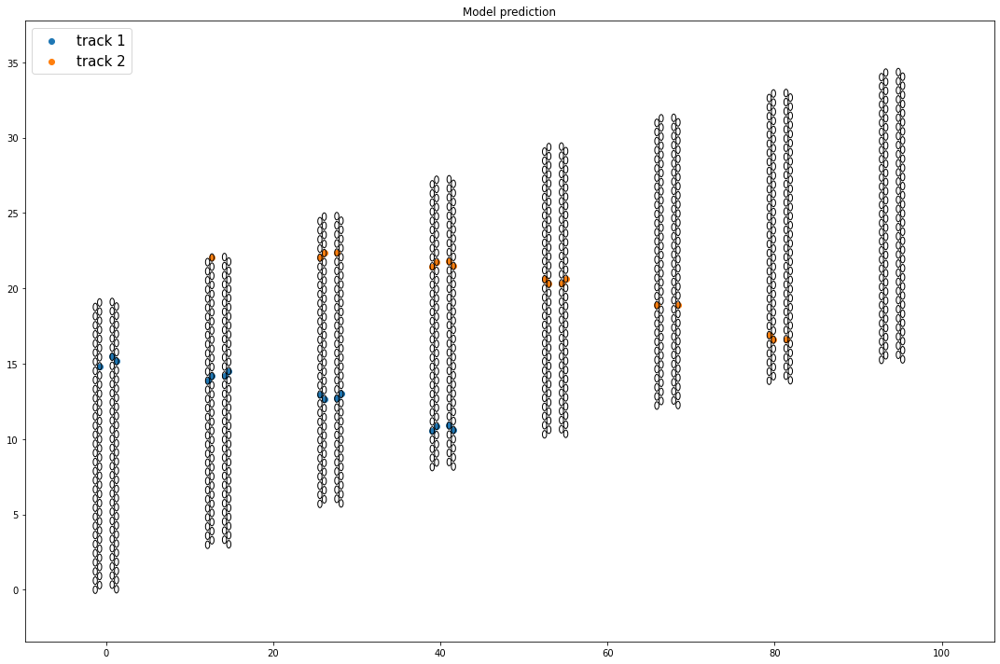

 Event # 4
Event truth:


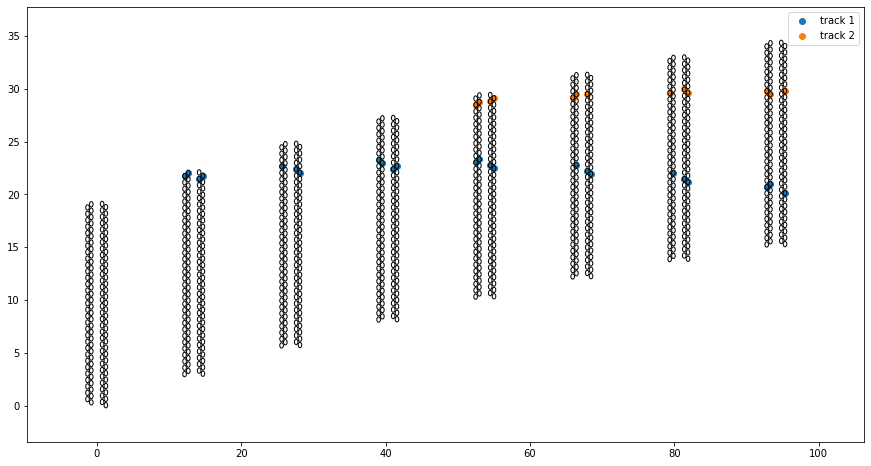

Searching for golden seeds
processing seed  0
min prediction =  0.9989663362503052
rms prediction =  0.00029236912688332677
nhits_track =  22.0
Accepting GOLDEN track with seed id #0

processing seed  1
min prediction =  0.9801585078239441
rms prediction =  0.004600957061966381
nhits_track =  22.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.9962430000305176
rms prediction =  0.0008964710540089784
nhits_track =  21.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.9995132684707642
rms prediction =  0.00010521463541782452
nhits_track =  22.0
Accepting GOLDEN track with seed id #3

processing seed  4
min prediction =  0.9994966983795166
rms prediction =  0.00012931273493431149
nhits_track =  13.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.9992227554321289
rms prediction =  0.00022069380631157255
nhits_track =  12.0
Accepting GOLDEN track with seed id #5

processing seed  6
min prediction 

model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 5 layer 15 before hit removal :  [ 0.  0.  0.  0. 25.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  15 24 4
Removing golden hit (15,24) at loc4 from seed 5
model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 5 layer 16 before hit removal :  [ 0.  0. 31.  0.  0. 22.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  16 21 5
Removing golden hit (16,21) at loc5 from seed 5
model_input for that seed layer after removal :  [ 0.  0. 31.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
model_input for seed 5 layer 17 before hit removal :  [ 0.  0. 31.  0. 22.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  17 21 4
Removing golden hit (17,21) at loc4 from seed 5
model_input for that seed layer after removal :  [ 0.  0. 31.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
model_input for seed 5 layer 18 before hit removal :  [ 0. 31.  0.  0.

No handles with labels found to put in legend.


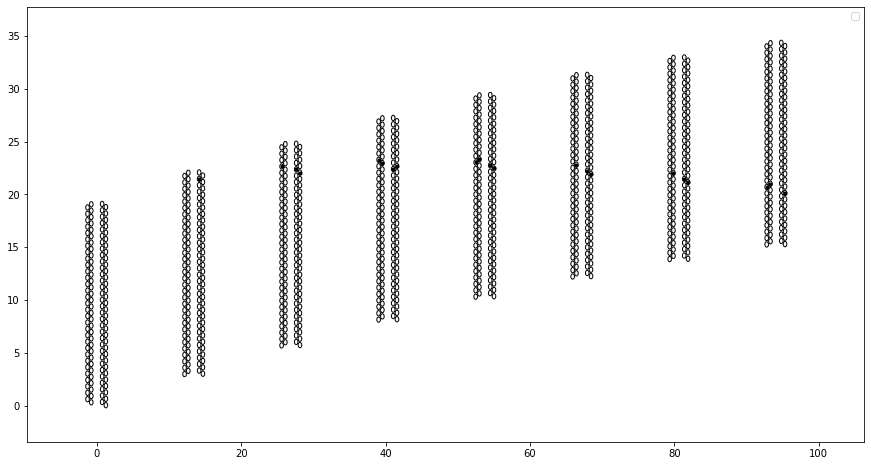

processing new good seed  4
best seed, max prediction min, [merged seeds] :  4 0.9994966983795166 [4]
model input for seed_id 5 : 
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 32.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [32.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 31.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 

No handles with labels found to put in legend.


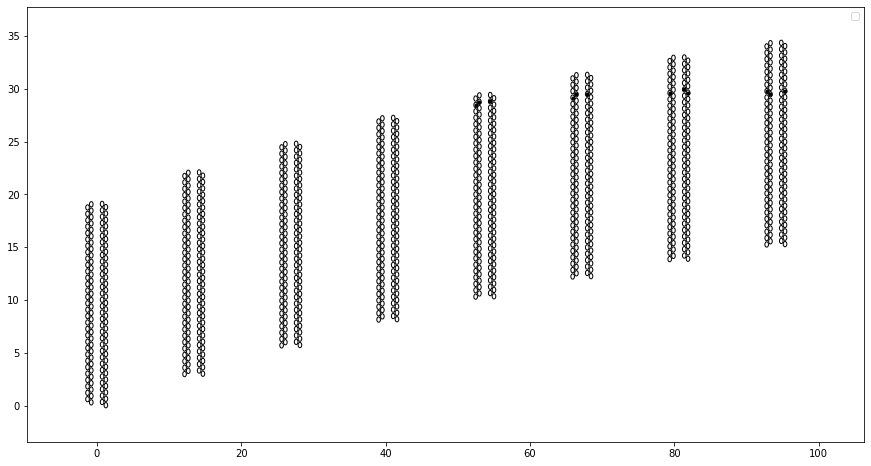

Searching for golden seeds
processing seed  9
min prediction =  0.9777847528457642
rms prediction =  0.005543414625715898
nhits_track =  21.0
processing seed  10
min prediction =  0.6422640085220337
rms prediction =  0.1072890225836572
nhits_track =  12.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 4,  5,  6,  7,  8, 10, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16,
       17, 17, 18, 18, 19, 19, 20, 21, 21, 22, 22, 23, 24, 25, 26, 26, 27,
       27, 28, 28, 29, 29, 31, 31]), array([ 0,  0,  2,  1,  4,  4,  5,  0,  6,  4, 10,  2,  8,  0,  6,  0,  5,
        2,  5,  3,  4,  1,  3,  2,  0,  3,  3,  5,  0,  4,  0,  2,  3,  0,
        2,  3,  5,  0,  5,  4,  5]))
Seed #1, hits:  (array([ 4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 15, 16, 16, 17, 17, 18, 18,
       19, 19, 20, 21, 21, 22, 22, 23, 24, 25, 26, 26, 27, 27, 28, 28, 29,
       29, 31, 31]), array([2, 5, 5, 2, 0, 2, 2, 1, 5, 4, 2, 1, 7, 3, 9, 0, 6, 1, 7, 2, 0, 4,
 

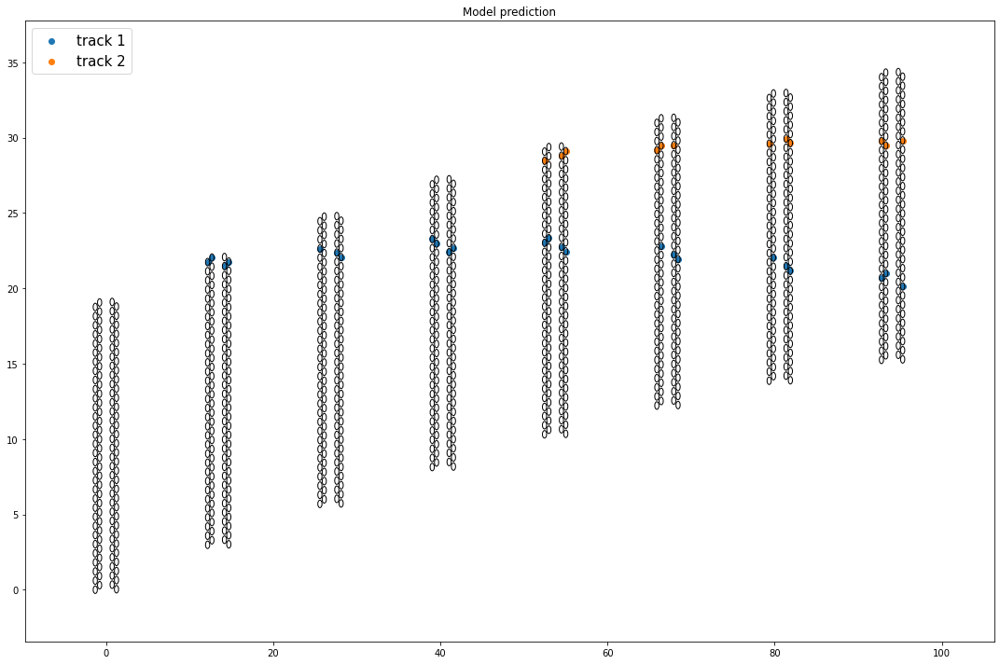

 Event # 5
Event truth:


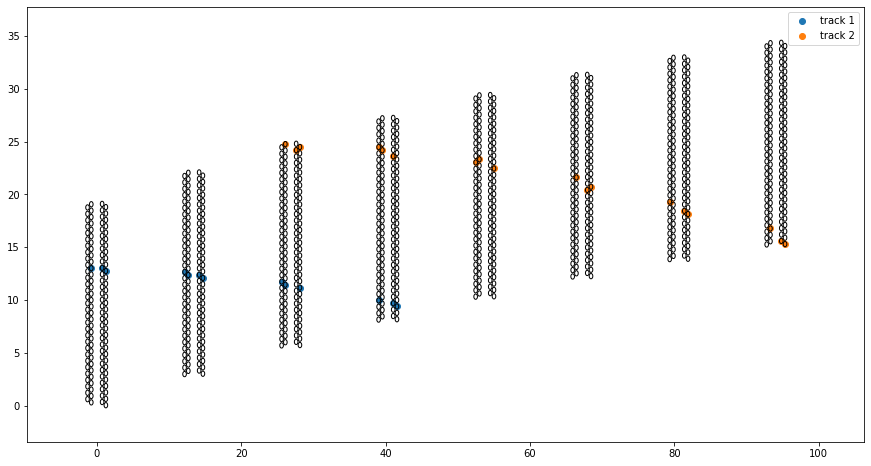

Searching for golden seeds
processing seed  0
min prediction =  0.9970170259475708
rms prediction =  0.0011011853273303557
nhits_track =  13.0
Accepting GOLDEN track with seed id #0

processing seed  1
min prediction =  0.999122679233551
rms prediction =  0.00023840748726561612
nhits_track =  13.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.9972718358039856
rms prediction =  0.0007143441385676268
nhits_track =  13.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.997549831867218
rms prediction =  0.0005743361769114734
nhits_track =  17.0
Accepting GOLDEN track with seed id #3

processing seed  4
min prediction =  0.9997439980506897
rms prediction =  6.7241252184854e-05
nhits_track =  13.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.9970495700836182
rms prediction =  0.0007089359408628204
nhits_track =  16.0
Accepting GOLDEN track with seed id #5

processing seed  6
min prediction =  0.9

model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 8 layer 4 before hit removal :  [ 0.  0.  0. 17.  0.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  4 16 3
Removing golden hit (4,16) at loc3 from seed 8
model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 8 layer 5 before hit removal :  [ 0.  0.  0.  0.  0. 16.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  5 15 5
Removing golden hit (5,15) at loc5 from seed 8
model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 8 layer 6 before hit removal :  [ 0.  0. 16.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
golden layer/straw/hit :  6 15 2
Removing golden hit (6,15) at loc2 from seed 8
model_input for that seed layer after removal :  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
model_input for seed 8 layer 7 before hit removal :  [ 0.  0.  0.  0.  0. 16.  0.  0.  0.  0.  0.  0.]


No handles with labels found to put in legend.


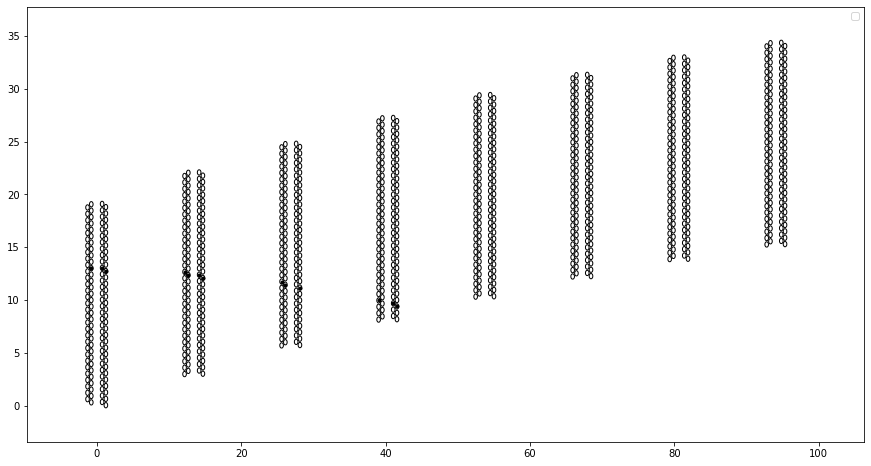

processing new good seed  3
best seed, max prediction min, [merged seeds] :  3 0.997549831867218 [3]
model input for seed_id 4 : 
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 22.  0.  0.  0.  0.  0.  1.  0.]
 [ 0.  0.  0. 22.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0. 22.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0. 17.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0. 16.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0. 16.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [16.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 11.  0.  0.  0.  0.  0.  1.  0.  0.]
 [10. 32.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 31.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 10. 32.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 4.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  3.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0.  0.  0. 22.  0.  0.  0.  0.  0.  0.]
 [

No handles with labels found to put in legend.


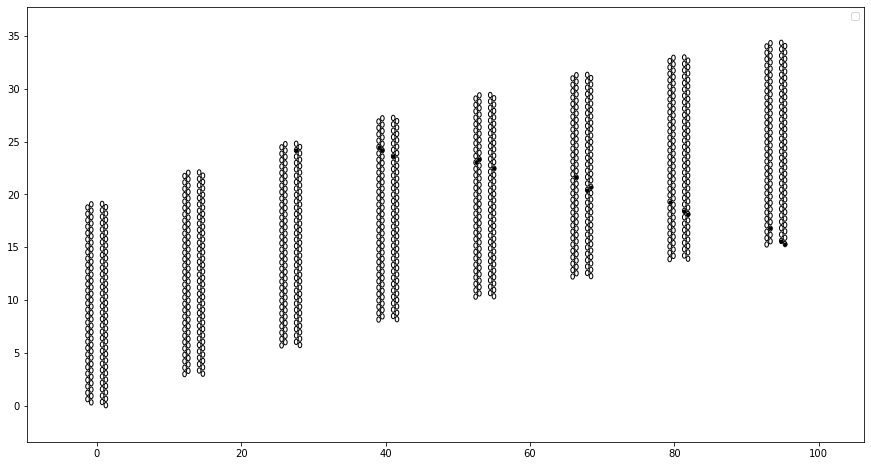

Searching for golden seeds
processing seed  4
min prediction =  0.985160231590271
rms prediction =  0.003951167552287835
nhits_track =  13.0
processing seed  6
min prediction =  0.9834856986999512
rms prediction =  0.004442813453037737
nhits_track =  16.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 1,  1,  2,  2,  3,  3,  4,  4,  5,  5,  6,  6,  7,  7,  8,  8,  9,
        9, 11, 11, 11, 12, 12, 14, 14, 15, 15]), array([ 4, 10,  3,  9,  3,  9,  3,  9,  3,  9,  1,  7,  0,  6,  3,  9,  0,
        6,  1,  2,  7,  0,  6,  1,  7,  3,  9]))
Seed #1, hits:  (array([ 9, 10, 11, 12, 12, 13, 13, 14, 14, 16, 17, 19, 21, 22, 23, 24, 26,
       27, 29, 30, 31]), array([ 1,  2,  2,  5, 11,  3,  9,  1,  7,  5,  1,  4,  4,  3,  0,  0,  2,
        5,  2,  4,  5]))
Seed #2, hits:  (array([ 9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 16, 16, 17, 17, 19,
       19, 21, 21, 22, 22, 23, 23, 24, 24, 26, 26, 27, 27, 29, 29, 30, 30,
    

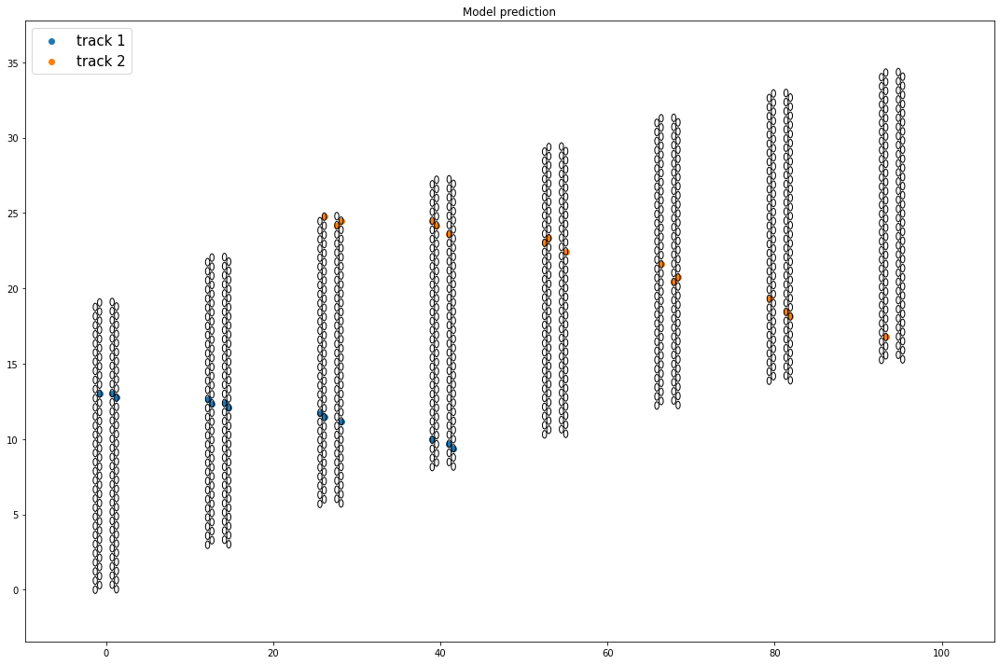

 Event # 6
Event truth:


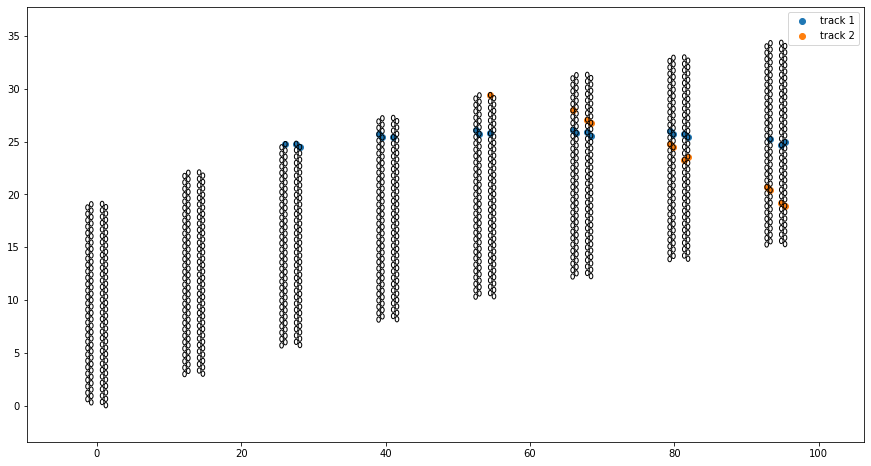

Searching for golden seeds
processing seed  0
min prediction =  0.8217660784721375
rms prediction =  0.0418988764277101
nhits_track =  17.0
processing seed  1
min prediction =  0.985535740852356
rms prediction =  0.0035253814136514197
nhits_track =  17.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.759212851524353
rms prediction =  0.06164459969228345
nhits_track =  17.0
processing seed  3
min prediction =  0.9664337038993835
rms prediction =  0.010583846281528607
nhits_track =  11.0
processing seed  4
min prediction =  0.9835101366043091
rms prediction =  0.004386969024460621
nhits_track =  17.0
Accepting GOLDEN track with seed id #4

newly found good seeds :  [1 4]
their predictions mins :  [0.98553574 0.98351014]
processing new good seed  1
best seed, max prediction min, [merged seeds] :  1 0.985535740852356 [1]
model input for seed_id 0 : 
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  

No handles with labels found to put in legend.


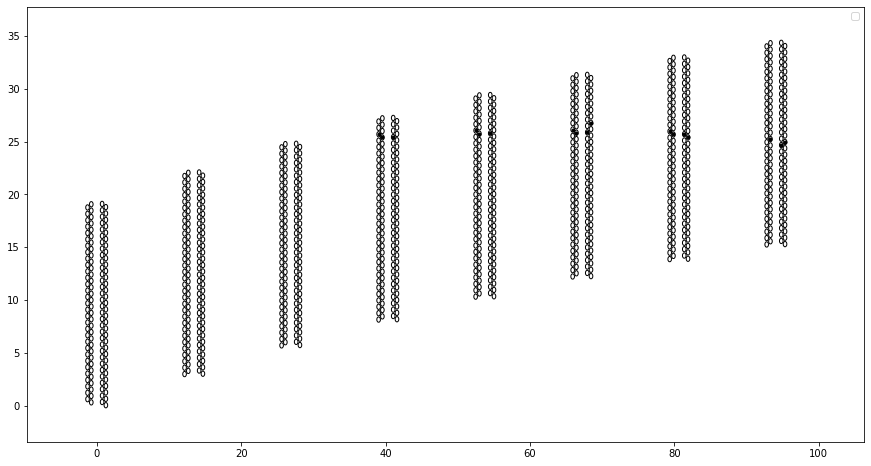

Searching for golden seeds
processing seed  0
 -- Less than 7 predicted hits, skipping seed 
processing seed  1
min prediction =  0.9954296350479126
rms prediction =  0.0011901710345101051
nhits_track =  16.0
processing seed  3
min prediction =  0.6943456530570984
rms prediction =  0.10532717096399252
nhits_track =  9.0
newly found good seeds :  []
their predictions mins :  []


 Merging silver seeds

removed_seed_ids :  [2, 4]
good_track_ids :  [1]
processing seed id # 0
processing seed id # 1
uncertain layers, straws ::
 [] []
min prediction =  0.9954296350479126
rms prediction =  0.0011901710345101051
nhits_track =  16.0
Cutoff: Removing hit at (9,31)
Cutoff: Removing hit at (10,31)
Cutoff: Removing hit at (11,31)
Cutoff: Removing hit at (18,31)
Cutoff: Removing hit at (20,26)
Cutoff: Removing hit at (22,24)
Cutoff: Removing hit at (24,18)
Cutoff: Removing hit at (25,17)
Cutoff: Removing hit at (26,15)
Cutoff: Removing hit at (27,16)
Cutoff: Removing hit at (28,9)
Cutoff: Removing h

No handles with labels found to put in legend.


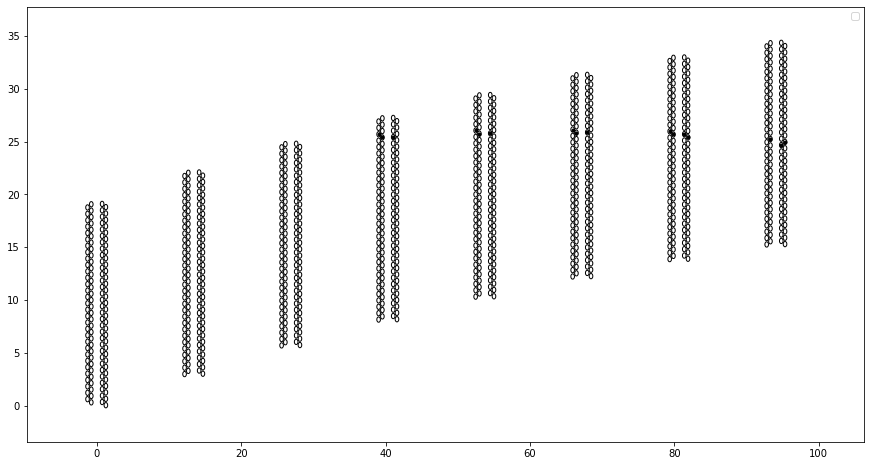

processing seed id # 3
uncertain layers, straws ::
 [23 25 26 27] [24 17 15 16]
removing seed, 4 uncertain hits
Found all good tracks!!
model input after merge_seeds : 
Seed #0, hits:  (array([12, 12, 13, 13, 14, 14, 16, 16, 17, 17, 18, 18, 20, 21, 22, 23, 23,
       24, 25, 26, 27, 29, 29, 30, 30, 31, 31]), array([ 5, 11,  1,  7,  5, 11,  5, 11,  0,  6,  1,  7,  1,  2,  3,  0,  1,
        4,  3,  4,  1,  0,  6,  3,  9,  4, 10]))
Seed #1, hits:  (array([ 9, 10, 11, 12, 13, 14, 16, 16, 17, 17, 18, 18, 20, 20, 21, 22, 22,
       23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 29, 29, 30, 30, 31, 31]), array([ 0,  3,  1,  2,  3,  3,  5, 11,  5, 11,  2,  8,  1,  2,  4,  2,  4,
        1,  3,  2,  4,  0,  4,  3,  5,  0,  5,  3,  2,  4,  1,  3,  3,  5]))
good seed_ids :  [1]


 Disambiguating hits

processing good seed id # 1
model input:  [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.

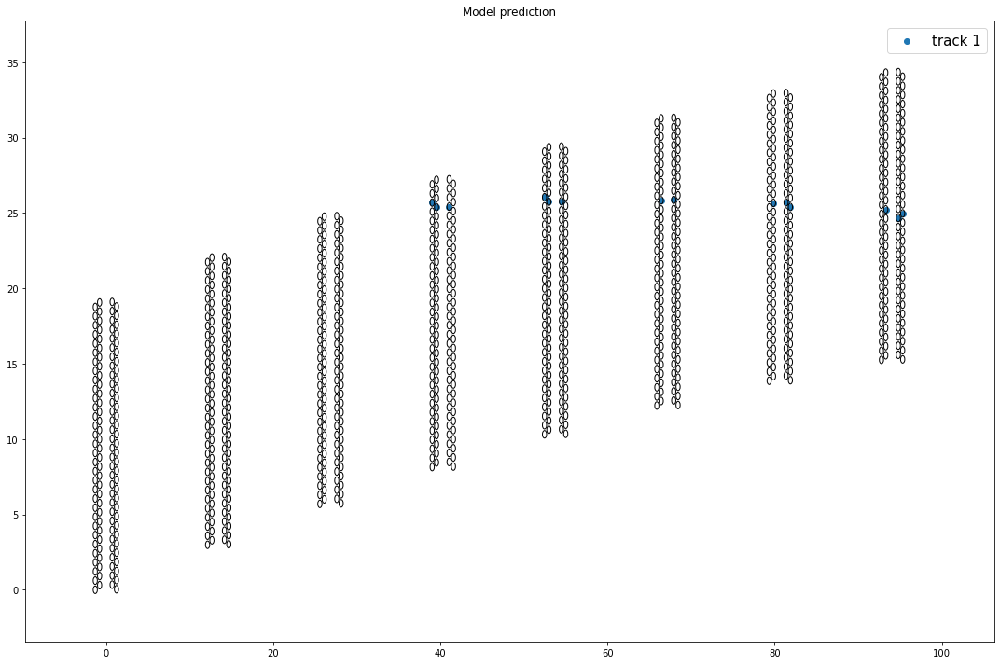

 Event # 7
Event truth:


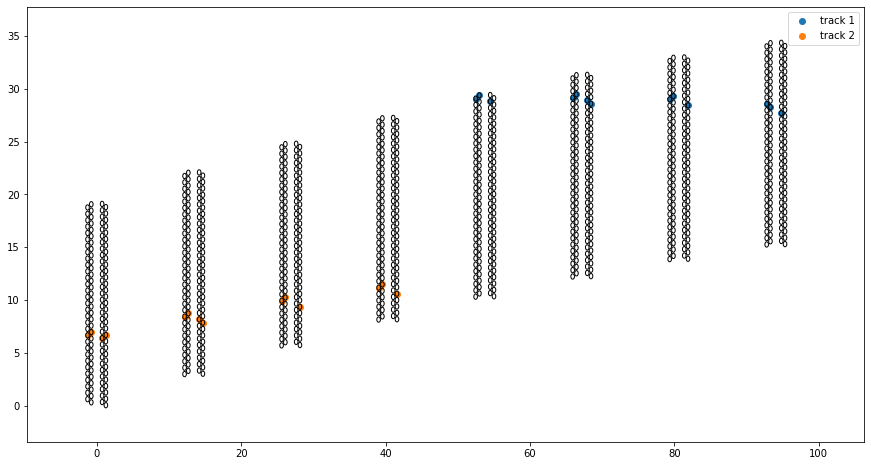

Searching for golden seeds
processing seed  0
min prediction =  0.9997816681861877
rms prediction =  6.964276126694764e-05
nhits_track =  14.0
Accepting GOLDEN track with seed id #0

processing seed  1
min prediction =  0.9995951056480408
rms prediction =  0.00011197737464346412
nhits_track =  14.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.9977964162826538
rms prediction =  0.0005888270604889476
nhits_track =  14.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.9955021739006042
rms prediction =  0.0013636222283786102
nhits_track =  14.0
Accepting GOLDEN track with seed id #3

processing seed  4
min prediction =  0.9999991655349731
rms prediction =  2.983678448836631e-07
nhits_track =  11.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.997946560382843
rms prediction =  0.0005960096828890793
nhits_track =  12.0
Accepting GOLDEN track with seed id #5

processing seed  6
min prediction =  

No handles with labels found to put in legend.


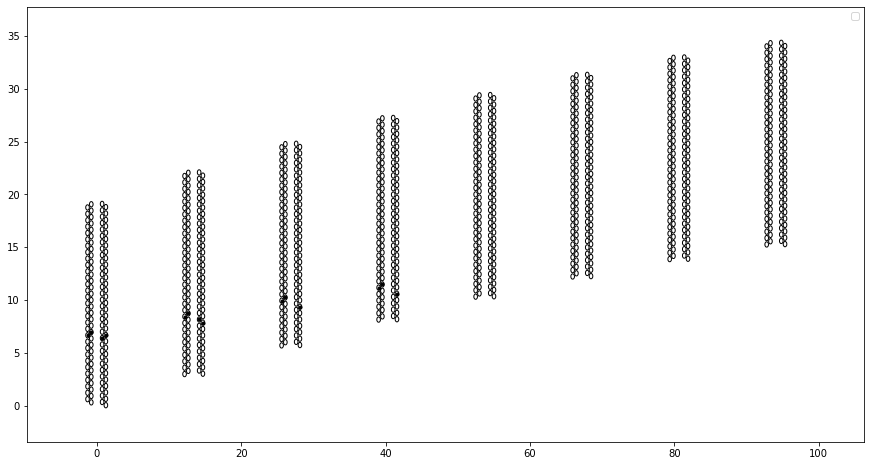

processing new good seed  4
best seed, max prediction min, [merged seeds] :  4 0.9999991655349731 [4]
model input for seed_id 0 : 
 [[ 0.  0.  0.  0.  0. 12.  0.  0.  0.  0.  0.  1.]
 [ 0.  0.  0. 12.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0. 11.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0. 12.  0.  0.  0.  0.  0.  1.  0.  0.  0.]
 [ 0.  0.  0.  0. 10.  0.  0.  0.  0.  0.  1.  0.]
 [10.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  8.  0.  0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  6.  0.  0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  0.  6.  0.  0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 5.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0. 32.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 

No handles with labels found to put in legend.


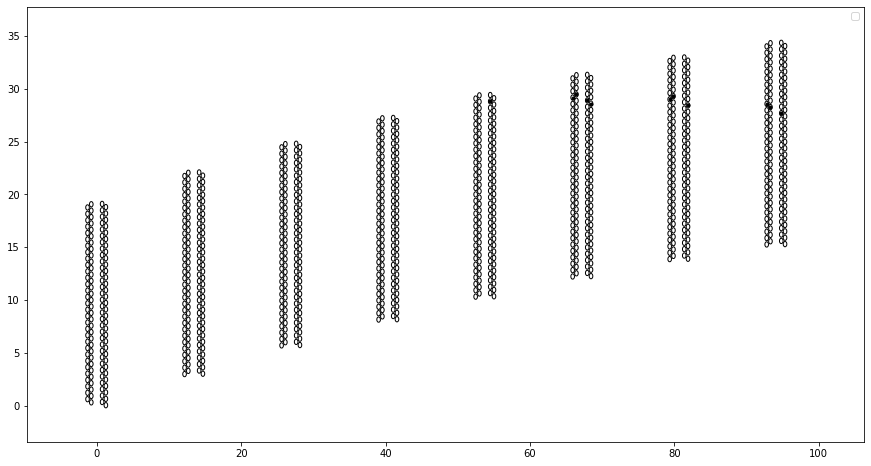

Searching for golden seeds
processing seed  0
min prediction =  0.9999196529388428
rms prediction =  2.6842458823669625e-05
nhits_track =  14.0
processing seed  4
min prediction =  0.9993189573287964
rms prediction =  0.00019347480638592327
nhits_track =  11.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 11, 12, 12, 13, 13, 15, 15,
       16, 17, 18, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30]), array([3, 2, 2, 1, 5, 3, 0, 5, 4, 5, 1, 0, 6, 2, 8, 3, 9, 5, 2, 2, 2, 5,
       1, 2, 4, 2, 0, 5, 3, 4]))
Seed #1, hits:  (array([16, 16, 17, 17, 18, 18, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25,
       25, 27, 27, 28, 28, 29, 29, 30, 30]), array([ 2,  8,  4, 10,  5, 11,  4, 10,  2,  8,  0,  6,  2,  8,  0,  6,  5,
       11,  1,  7,  2,  8,  5, 11,  1,  7]))
good seed_ids :  [0, 4]


 Disambiguating hits

processing good seed id # 0
model input:  [[ 0.  0.  0.  0.  0. 12.  0.  0.  0.  0. 

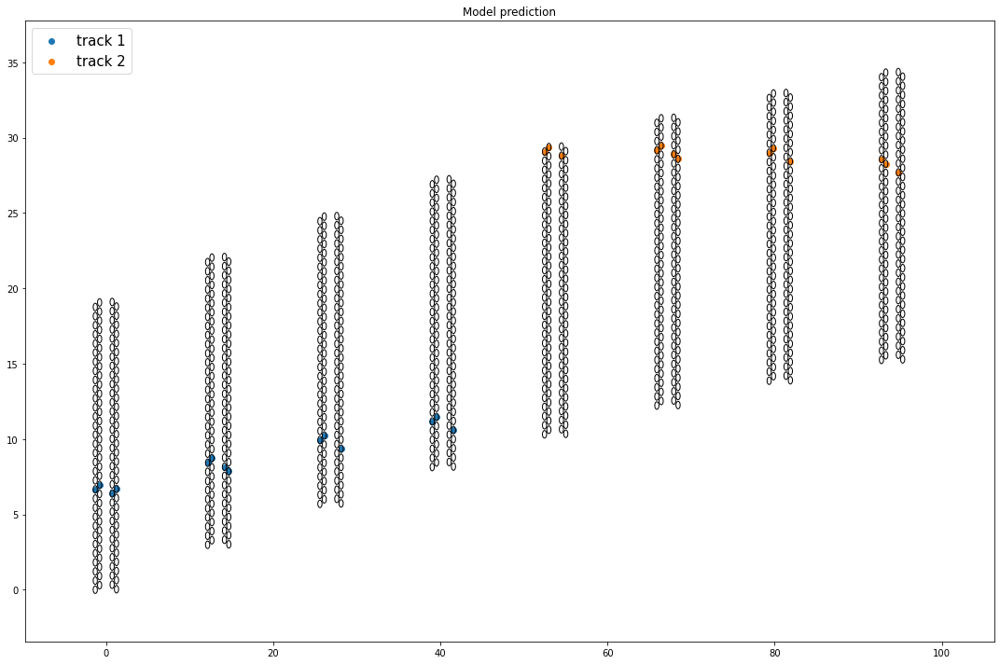

 Event # 8
Event truth:


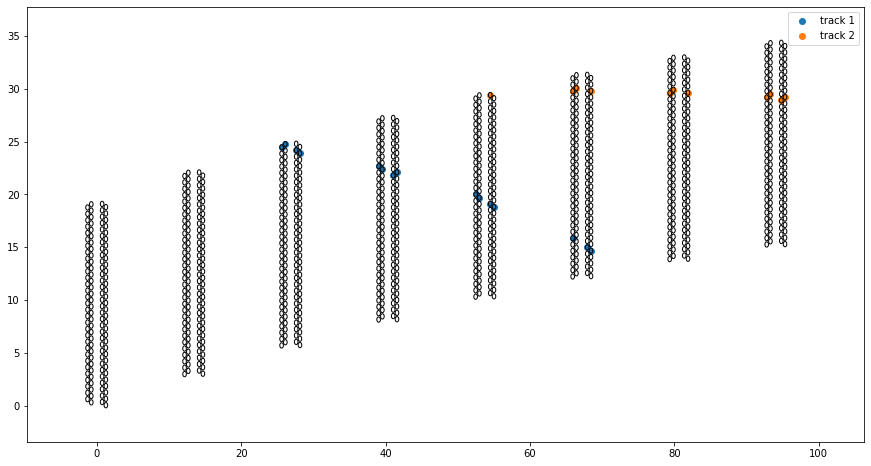

Searching for golden seeds
processing seed  0
min prediction =  0.9839065074920654
rms prediction =  0.004527091874482669
nhits_track =  13.0
Accepting GOLDEN track with seed id #0

processing seed  1
min prediction =  0.999688982963562
rms prediction =  0.00012118502602282479
nhits_track =  13.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.9998703002929688
rms prediction =  3.403132496048807e-05
nhits_track =  14.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.9987479448318481
rms prediction =  0.00037305794682997504
nhits_track =  13.0
Accepting GOLDEN track with seed id #3

processing seed  4
min prediction =  0.9990063309669495
rms prediction =  0.0003056996032027486
nhits_track =  10.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.9994774460792542
rms prediction =  0.00017518888951781867
nhits_track =  10.0
Accepting GOLDEN track with seed id #5

processing seed  6
min prediction = 

No handles with labels found to put in legend.


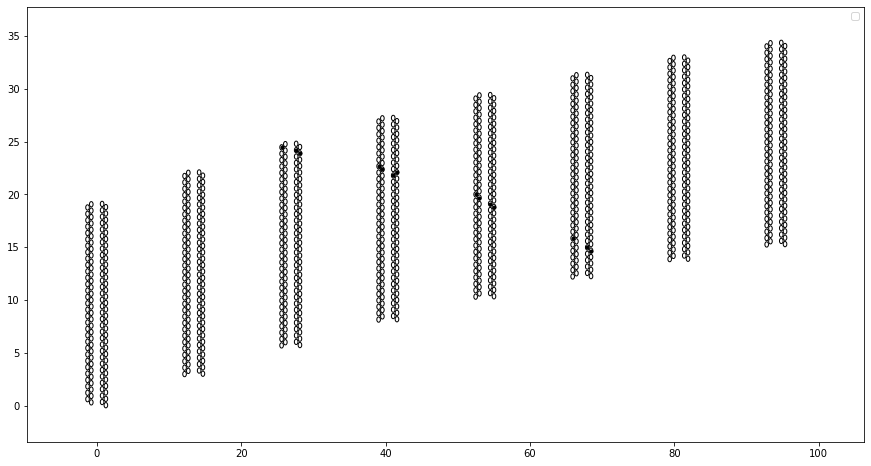

processing new good seed  4
best seed, max prediction min, [merged seeds] :  4 0.9990063309669495 [4]
model input for seed_id 2 : 
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 32.  0.  0.  0.  0.  0.  1.]
 [ 0.  0. 32.  0.  0.  0.  0.  0.  1.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 31.  0.  0.  0.  0.  0.  1.]
 [ 0. 31.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [25.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [24.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [23.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 24.  0.  0.  0.  0.  0.  1.  0.]
 [ 0. 17.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 

No handles with labels found to put in legend.


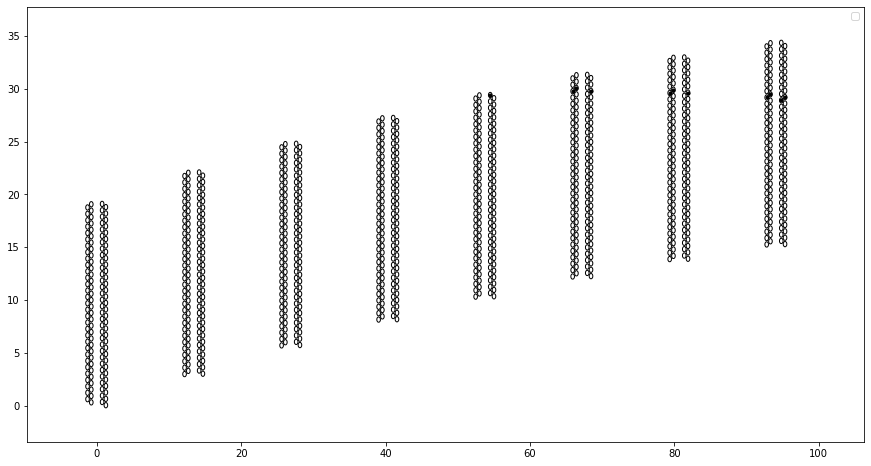

Searching for golden seeds
processing seed  2
min prediction =  0.9712113738059998
rms prediction =  0.011171942024426682
nhits_track =  14.0
processing seed  6
min prediction =  0.9775656461715698
rms prediction =  0.0063299061168261474
nhits_track =  11.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 8,  9, 10, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 17, 18, 18, 19,
       20, 20, 21, 22, 23, 23, 24, 25, 27, 28, 29, 30, 31]), array([ 4,  0,  4,  2,  5, 11,  3,  9,  0,  6,  5, 11,  3,  0,  1,  3,  4,
        0,  1,  2,  5,  1,  3,  4,  1,  5,  4,  1,  0,  5]))
Seed #1, hits:  (array([ 8,  8,  9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16,
       16, 17, 17, 18, 18, 19, 19, 20, 20, 22, 22, 23, 23]), array([ 5, 11,  2,  8,  5, 11,  1,  7,  0,  6,  0,  6,  0,  6,  4, 10,  1,
        7,  4, 10,  1,  7,  3,  9,  5, 11,  5, 11,  0,  6]))
good seed_ids :  [2, 6]


 Disambiguating hits

processing good seed id #

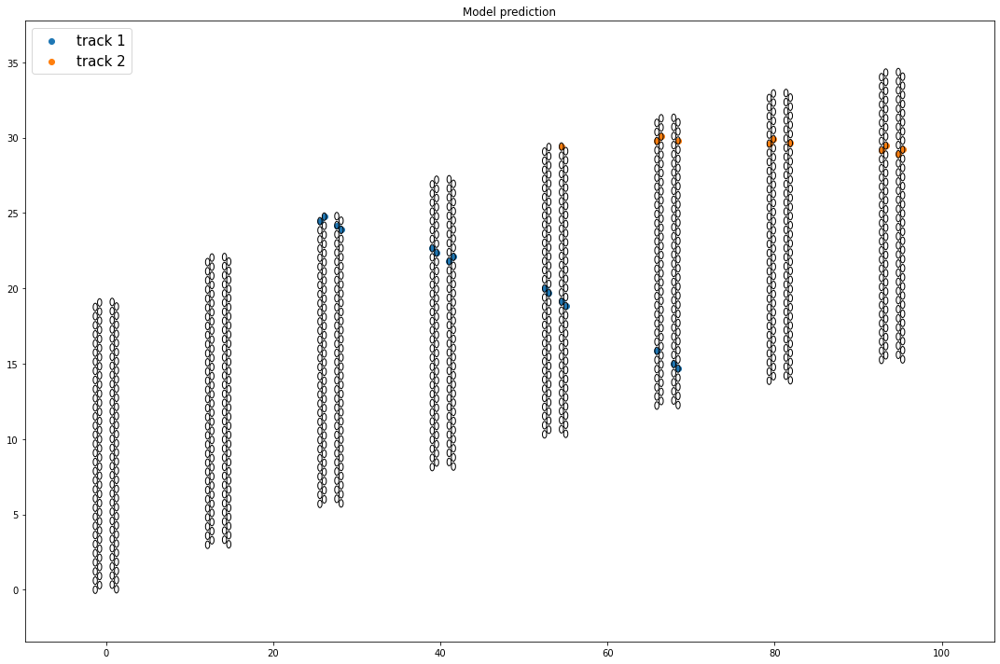

 Event # 9
Event truth:


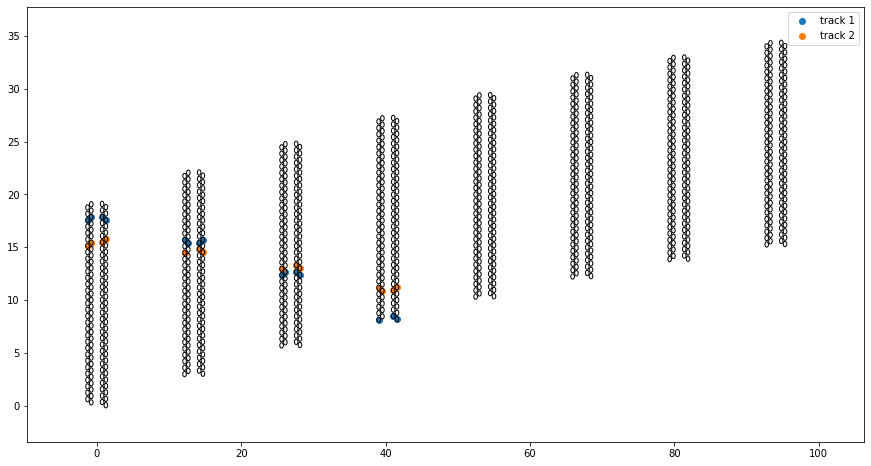

Searching for golden seeds
processing seed  0
min prediction =  0.7015421390533447
rms prediction =  0.09401428981847873
nhits_track =  16.0
processing seed  1
min prediction =  0.7640575766563416
rms prediction =  0.08274038974945898
nhits_track =  14.0
processing seed  2
min prediction =  0.759299099445343
rms prediction =  0.06302324073056614
nhits_track =  14.0
processing seed  3
min prediction =  0.9707051515579224
rms prediction =  0.010493927761552398
nhits_track =  14.0
newly found good seeds :  []
their predictions mins :  []


 Merging silver seeds

removed_seed_ids :  []
good_track_ids :  []
processing seed id # 0
uncertain layers, straws ::
 [ 5  6  8  9 10] [20 19 12 11 12]
removing seed, 5 uncertain hits
processing seed id # 1
uncertain layers, straws ::
 [6 8 9] [20 12 11]
removing seed, 3 uncertain hits
processing seed id # 2
uncertain layers, straws ::
 [11] [11]
min prediction =  0.759299099445343
rms prediction =  0.06302324073056614
nhits_track =  14.0
Cutoff: Remov

No handles with labels found to put in legend.


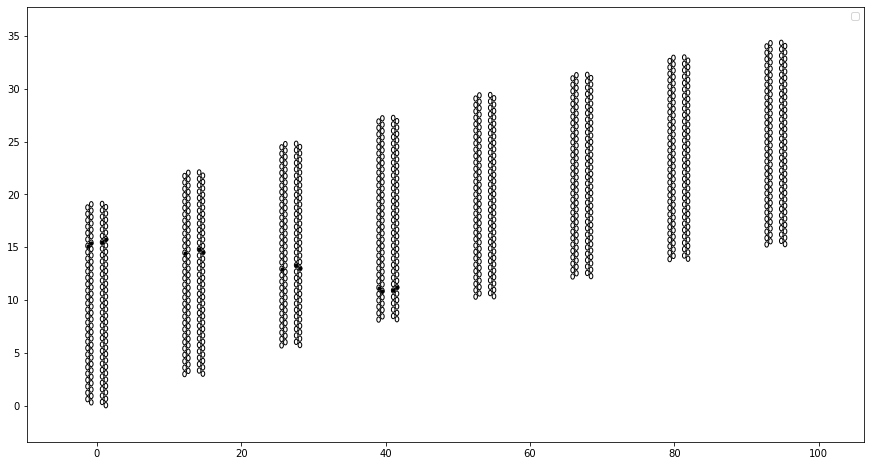

Searching for golden seeds
processing seed  2
min prediction =  0.9969096779823303
rms prediction =  0.0007851565539816645
nhits_track =  14.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.9657504558563232
rms prediction =  0.012057162300067276
nhits_track =  14.0
newly found good seeds :  [2]
their predictions mins :  [0.99690968]
processing new good seed  2
best seed, max prediction min, [merged seeds] :  2 0.9969096779823303 [2]
model input for seed_id 3 : 
 [[ 0.  0.  0.  0. 26.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 26.  0.  0.  0.  0.  0.  0.  0.]
 [26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 27.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 13.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 

No handles with labels found to put in legend.


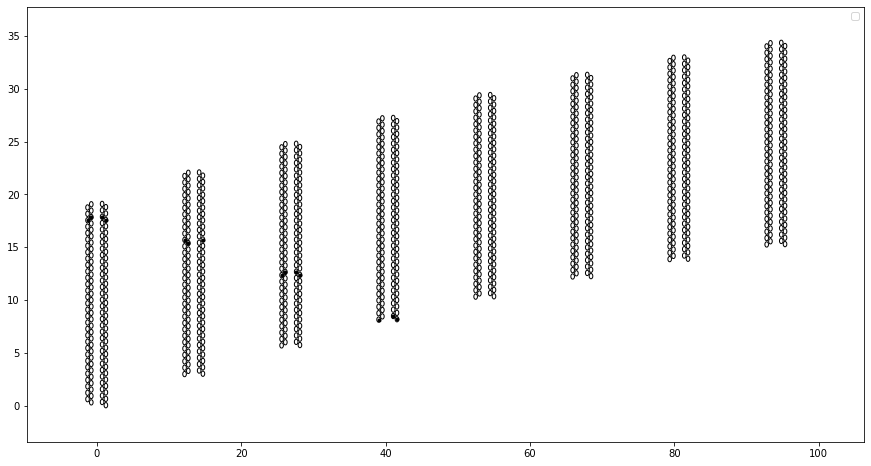

model input after merge_seeds : 
Seed #0, hits:  (array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 12, 14, 14, 15, 15]), array([ 2,  1,  4,  3,  4,  0,  5,  1,  4,  5,  3,  5, 11,  2,  8,  0,  6]))
Seed #1, hits:  (array([ 0,  1,  2,  3,  4,  6,  7,  8, 10, 11, 12, 12, 13, 13, 14, 14, 15,
       15]), array([ 4,  4,  0,  5,  0,  1,  1,  5,  1,  5,  3,  9,  5, 11,  1,  7,  0,
        6]))
good seed_ids :  [3, 2]


 Disambiguating hits

processing good seed id # 3
model input:  [[ 0.  0.  0.  0. 26.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 26.  0.  0.  0.  0.  0.  0.  0.]
 [26.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 27.  0.  0.  0.  0.  0.  0.]
 [20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 20.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 13.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 

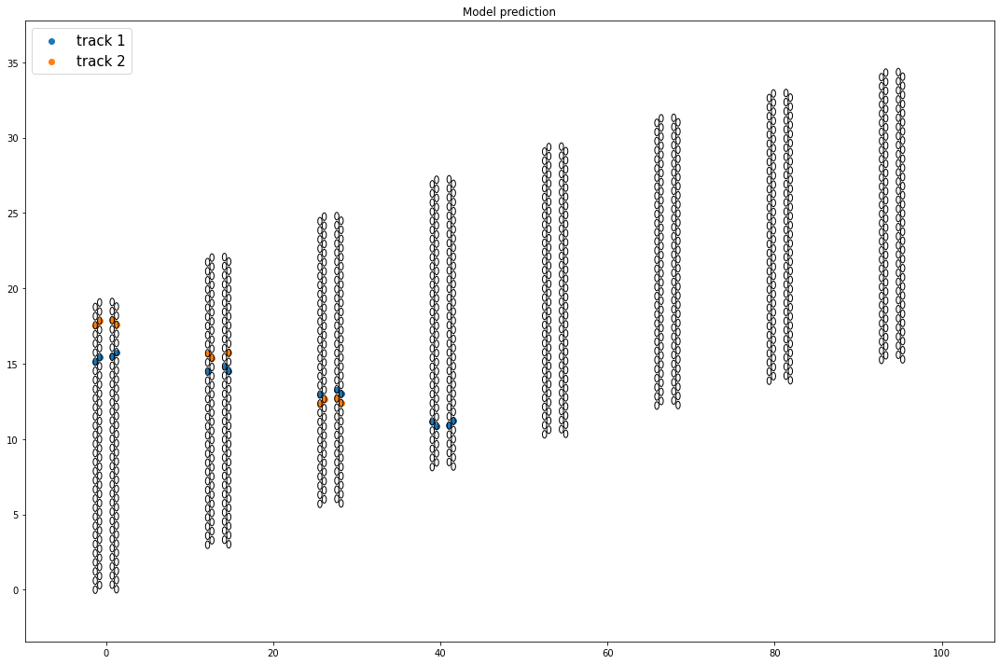

 Event # 10
Event truth:


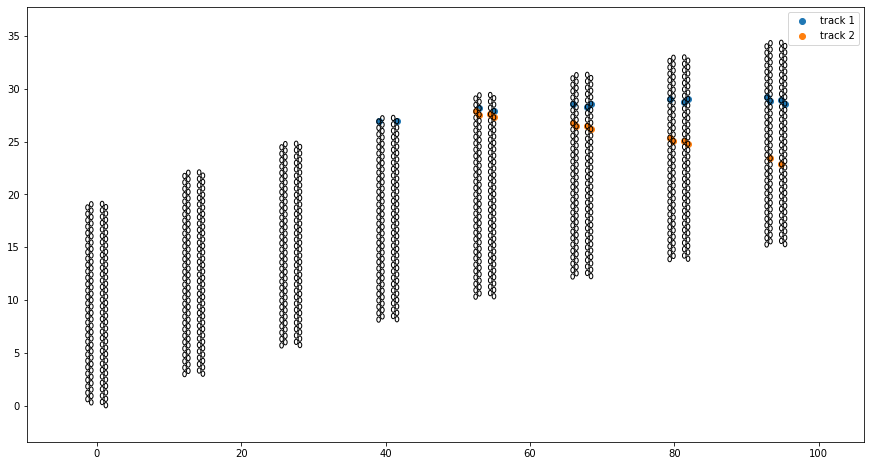

Searching for golden seeds
processing seed  0
min prediction =  0.773707389831543
rms prediction =  0.06400078821587003
nhits_track =  14.0
processing seed  1
min prediction =  0.8929499983787537
rms prediction =  0.02809148193981769
nhits_track =  13.0
processing seed  2
min prediction =  0.7663055062294006
rms prediction =  0.06183595149392004
nhits_track =  13.0
processing seed  3
min prediction =  0.7639660239219666
rms prediction =  0.06509056760613545
nhits_track =  12.0
processing seed  4
min prediction =  0.8847959637641907
rms prediction =  0.031952423017735314
nhits_track =  12.0
newly found good seeds :  []
their predictions mins :  []


 Merging silver seeds

removed_seed_ids :  []
good_track_ids :  []
processing seed id # 0
uncertain layers, straws ::
 [16 17] [29 28]
min prediction =  0.773707389831543
rms prediction =  0.06400078821587003
nhits_track =  14.0
Cutoff: Removing hit at (12,31)
Cutoff: Removing hit at (15,31)
Cutoff: Removing hit at (19,29)
Cutoff: Removing h

No handles with labels found to put in legend.


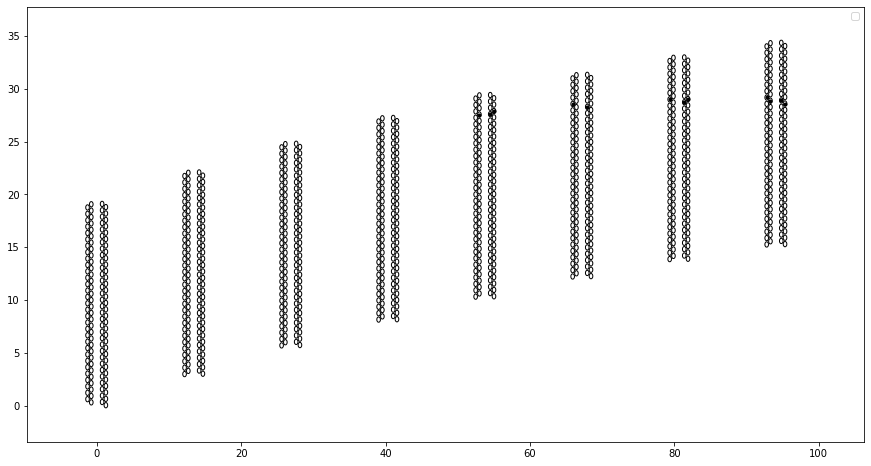

Found all good tracks!!
model input after merge_seeds : 
good seed_ids :  [3]


 Disambiguating hits

processing good seed id # 3
model input:  [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0

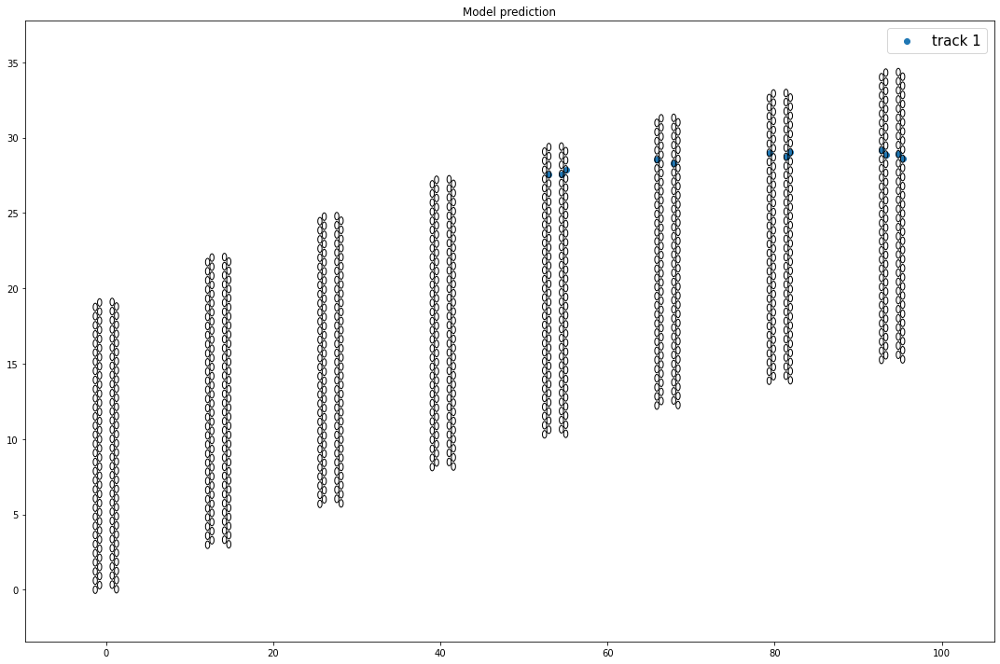

 Event # 11
Event truth:


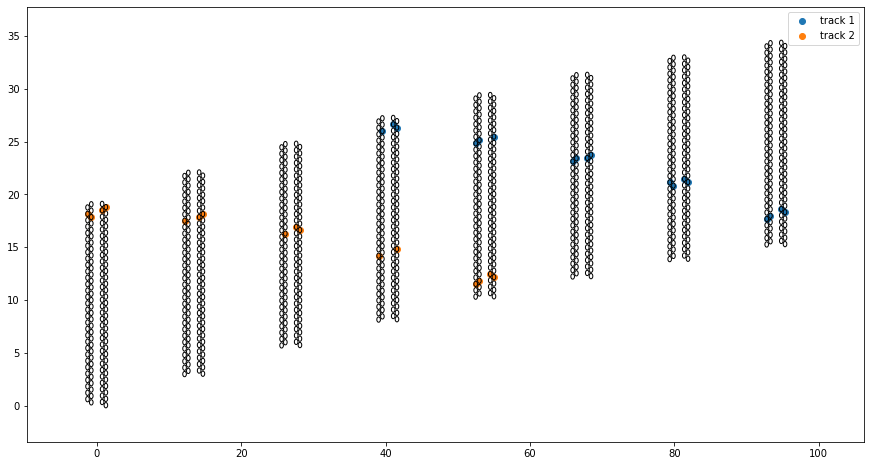

Searching for golden seeds
processing seed  0
min prediction =  0.9900074005126953
rms prediction =  0.0029850025840927256
nhits_track =  16.0
Accepting GOLDEN track with seed id #0

processing seed  1
min prediction =  0.9993295669555664
rms prediction =  0.00019639380018066113
nhits_track =  15.0
Accepting GOLDEN track with seed id #1

processing seed  2
min prediction =  0.9995816349983215
rms prediction =  0.00015164099175999165
nhits_track =  15.0
Accepting GOLDEN track with seed id #2

processing seed  3
min prediction =  0.9998483657836914
rms prediction =  4.17426887570135e-05
nhits_track =  18.0
Accepting GOLDEN track with seed id #3

processing seed  4
min prediction =  0.9978773593902588
rms prediction =  0.0005268913325271193
nhits_track =  15.0
Accepting GOLDEN track with seed id #4

processing seed  5
min prediction =  0.9969810843467712
rms prediction =  0.0006869106929064362
nhits_track =  18.0
Accepting GOLDEN track with seed id #5

processing seed  6
min prediction = 

 [[ 0.  0.  0. 31.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 30.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [31.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 32.  0.  0.  0.  0.  0.  0.  0.  0.]
 [25.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 25.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 26.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 18.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 19.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 19.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 11.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 30.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 31.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 31.  0. 12.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  3. 25.  0.  0.  0.  0.  0.  0.]
 [ 3. 25.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.]
 [26.  0.  0.  0.  4.  0.  0. 

No handles with labels found to put in legend.


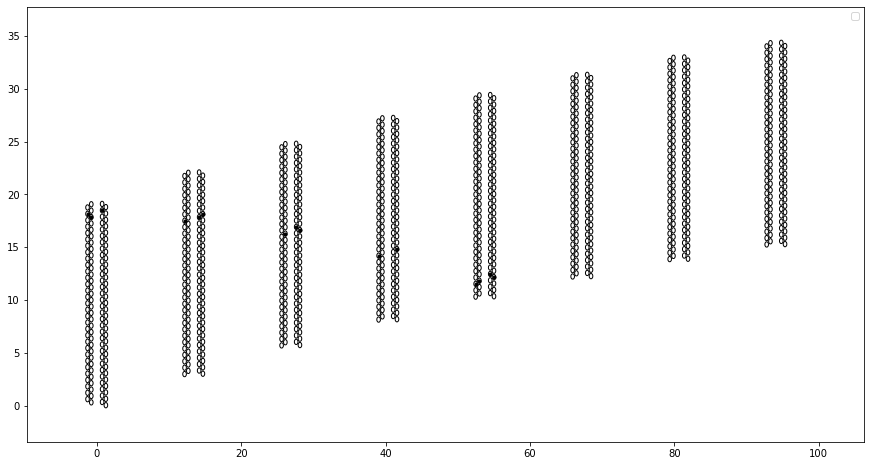

processing new good seed  3
best seed, max prediction min, [merged seeds] :  3 0.9998483657836914 [3]
model input for seed_id 2 : 
 [[31.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0. 30.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0. 31.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0.  0. 32.  0.  0.  0.  0.  0.  1.  0.]
 [ 0.  0.  0. 25.  0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [25.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [26.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. 18.  0.  0.  0.  0.  0.  1.  0.  0.  0.]
 [19.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 19.  0.  0.  0.  0.  0.  1.  0.  0.]
 [11.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [30.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 31.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 12. 31.  0.  0.  0.  0.  0.  0.  0.]
 [25.  0.  0.  0.  0.  3.  0.  0.  0.  0.  0.  1.]
 

No handles with labels found to put in legend.


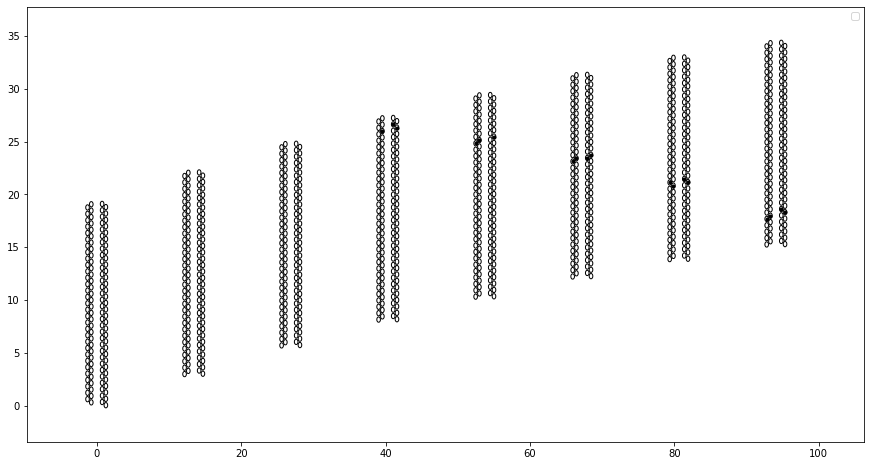

Searching for golden seeds
processing seed  2
min prediction =  0.9935185313224792
rms prediction =  0.002019649885829845
nhits_track =  15.0
processing seed  3
min prediction =  0.9837169647216797
rms prediction =  0.003766099557111222
nhits_track =  18.0
newly found good seeds :  []
their predictions mins :  []
model input after merge_seeds : 
Seed #0, hits:  (array([ 9, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 19, 19, 20, 20, 21, 21,
       22, 22, 23, 23, 24, 24, 25, 25, 26, 26, 27, 27, 28, 28, 29, 29, 30,
       30, 31, 31]), array([ 3,  5, 11,  2,  8,  0,  6,  3,  9,  1,  7,  3,  9,  4, 10,  2,  8,
        4, 10,  0,  6,  4, 10,  4, 10,  4, 10,  0,  6,  5, 11,  3,  9,  5,
       11,  5, 11]))
Seed #1, hits:  (array([ 0,  1,  2,  3,  4,  6,  7,  9, 10, 11, 12, 13, 14, 15, 15, 16, 16,
       17, 17, 18, 18, 19, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31]), array([ 2,  1,  2,  2,  2,  2,  3,  4,  2,  1,  5,  1,  5,  4,  5,  5, 11,
        0,  6,  5, 11,  3,  9,  5,  3,

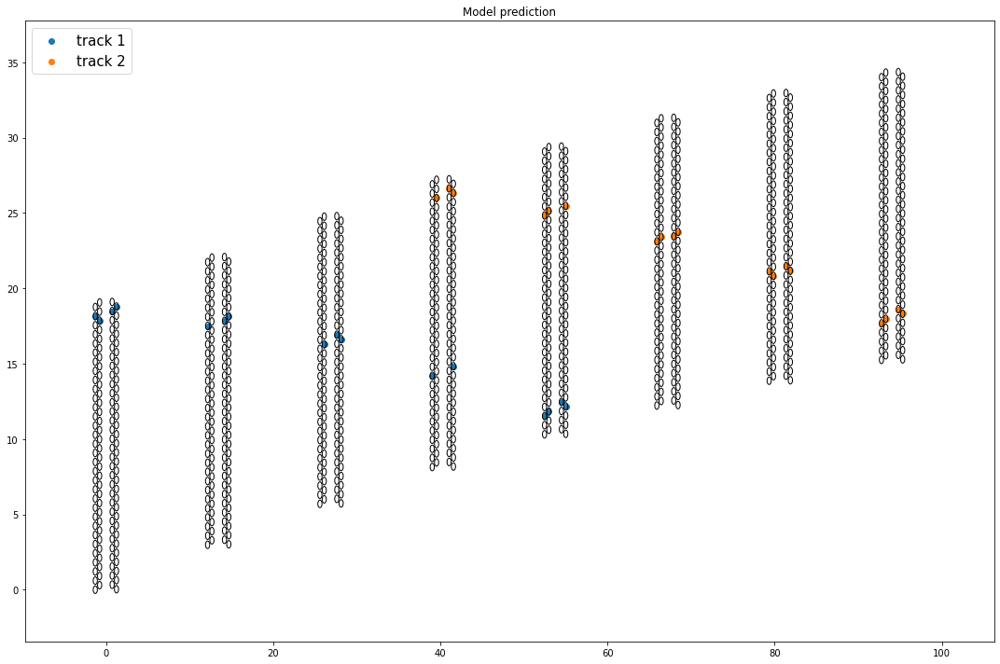

In [115]:
range_start=2
for i in range(range_start,range_start+10):
    print(' Event #', i)
    plot_event_and_prediction(evts_hits_test[i], evts_ids_test[i], figsize=(15,10), verbose=2)

## Build scoring function


In [37]:
def score_function(true_ids, predicted_ids, verbose=False):
    '''
    Calculate an accuracy score based on hits within events, which belong to seeded tracks.
    Both true and predicted ids are of shape (n_evts, length, width).
    Accuracy score is calculated as the fraction of correctly assigned hits.
    '''
    n_trackhits, n_trackhits_correct=0,0
    n_predicted,n_predicted_correct=0,0
    
    n_evts=true_ids.shape[0]
    n_print=max(1,int(n_evts/10))
    for i_evt in range(n_evts):
        if (i_evt%n_print)==0:
            print('scoring event #%d'%i_evt)
        
        ## get all true track ids in this event
        track_ids = [i for i in np.unique(true_ids[i_evt]) if i>0]
        if len(track_ids)==0: continue
        ## get all predicted ids in this event
        pred_ids = [i for i in np.unique(predicted_ids[i_evt]) if i>0]
        
        for pred_id in pred_ids:
            # get all hits that are predicted to be in the same track
            pred_layers,pred_straws=np.where(predicted_ids[i_evt]==pred_id)
            n_predicted += len(pred_layers)
            
            # get the real track that corresponds to this (ambiguity?)
            trackhit_ids, counts = np.unique(true_ids[i_evt][pred_layers,pred_straws], return_counts=True)
            most_id=np.argmax(counts)
            track_id = trackhit_ids[most_id]
            
            ''' ** Alt way to get track_id: **
            track_id=0
            for idx in track_ids:
                layers,straws=np.where(true_ids[i_evt]==idx)
                n_hits=len(layers)
                if np.sum(predicted_ids[i_evt][layers,straws])>(n_hits/2.):
                    n_trackhits+=n_hits
                    track_id=idx
                    break
            '''
            
            # get how many of the predicted_ids are correct:
            n_predicted_correct += len( np.where( true_ids[i_evt][pred_layers,pred_straws]==track_id )[0] )
            
            ## Hits in the real track:
            layers,straws=np.where(true_ids[i_evt]==track_id)
            n_trackhits += len(layers)
            
            # how many of these are predicted correctly
            n_trackhits_correct += len( np.where( predicted_ids[i_evt][layers,straws]==pred_id )[0] )
                
                
    if n_trackhits==0:
        print('No tracks found in events passed')
        return 0
    if n_predicted==0:
        print('No predicted tracks found in events passed')
        return 0

    
    print('Fraction of track hits identified correctly: ', n_trackhits_correct/n_trackhits)
    print('Fractional error (wrongly assigned hits): ', 1-n_predicted_correct/n_predicted)
    return n_predicted_correct/n_predicted



In [38]:
start_time = time.time()

predicted_ids=predict_events(evts_hits_test)#,verbose=1)
score_function(evts_ids_test, predicted_ids )

end_time = time.time()
print('time: ', end_time - start_time)

n_tracks=0
for predicted_id in predicted_ids:
    n_tracks += np.max(predicted_id)
print('Total tracks found: ', n_tracks)

predicting event #0
predicting event #100

No seeds in model input

No seeds in model input
predicting event #200
predicting event #300

No seeds in model input

No seeds in model input
predicting event #400

No seeds in model input
predicting event #500
predicting event #600

No seeds in model input
predicting event #700
predicting event #800

No seeds in model input
predicting event #900
scoring event #0
scoring event #100
scoring event #200
scoring event #300
scoring event #400
scoring event #500
scoring event #600
scoring event #700
scoring event #800
scoring event #900
Fraction of track hits identified correctly:  0.938317886771495
Fractional error (wrongly assigned hits):  0.017946668604228777
time:  424.19900918006897
Total tracks found:  1815.0


Initially::
Fraction of track hits identified correctly:  0.8210176657104031
Fractional error (wrongly assigned hits):  0.03224887876414895
time:  521.8165469169617
Total tracks found:  2090.0

After overly-aggressive removal of uncertainty::
Fraction of track hits identified correctly:  0.9428410000470832
Fractional error (wrongly assigned hits):  0.0038304646303850554
time:  415.5956540107727
Total tracks found:  1366.0

Overly-aggressive + relaxing the seed nearby hits requirement:
Fraction of track hits identified correctly:  0.9627702351104593
Fractional error (wrongly assigned hits):  0.0032812576521866754
time:  426.5461766719818
Total tracks found:  1374.0

Now without the very aggressive removal, but still removing more uncertainty than originally:
Fraction of track hits identified correctly:  0.912070454152996
Fractional error (wrongly assigned hits):  0.01817979031898287
time:  505.94100189208984
Total tracks found:  1841.0

Small tweaks, and 1 less iteration to reduce time
Fraction of track hits identified correctly:  0.9364848661022492
Fractional error (wrongly assigned hits):  0.014868893815457529
time:  442.1521649360657
Total tracks found:  1754.0

After big reworking in the seeds, to choose optimal seed to merge in (and other things changed on the way):
Fraction of track hits identified correctly:  0.930265199083992
Fractional error (wrongly assigned hits):  0.012003765887337203
time:  432.0821371078491
Total tracks found:  1698.0

* With quick training: 0.937  
* With pre-trained: 0.75  
    * about the same with the real straw locations  
* Pre-trained, with extra training: 0.956
* Most accurate : 0.905

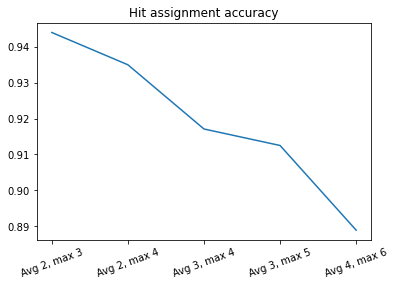

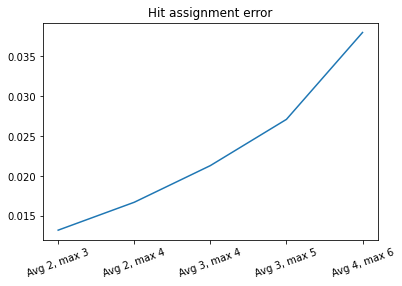

In [125]:
labels=['Avg 2, max 3', 'Avg 2, max 4',  'Avg 3, max 4', 'Avg 3, max 5', 'Avg 4, max 6']

full_acc  = [0.944,0.935,0.9171,0.9125,0.8889]
full_err  = [0.0132,0.0167,0.0213,0.0271,0.038]

plt.plot(full_acc)
plt.title('Hit assignment accuracy')
plt.xticks(np.arange(5), labels, rotation=20)  # Set text labels and properties.
plt.show()
plt.plot(full_err)
plt.title('Hit assignment error')
plt.xticks(np.arange(5), labels, rotation=20)  # Set text labels and properties.
plt.show()

## Notes on current status

The LSTM-based NN does pretty good with the realistic geometry and some difficult events in the dataset.

### Issues
Still some issues, some events are not perfect in ways that look improvable.  
* Difficulties arise when tracks are superimposed and close to each other. At that point both the seed-based searches for thesse tracks have not great results, and the seed merging algorithm is having troubles.
* Difficulties for some reason near the edge of the detector. Connection between successive modules can be lost, resulting in a shorter track candidate that is missing some modules, even when there are no other tracks in the event. 
* It is a little more difficult to get a good prediction from seeds that are later in the detector and need to be extrapolated backwards.

### Improvements needed
1) Add seeds as categorical variable. There are still a few cases where the seed hits are not selected, in difficult cases.
2) Prepare to add another feature variable for hit time. That should add more discrimination in high occupancy, and better track separation overall.
3) Improve training by adding weights to events according to their number of hits.
4) Add extra NN, each specializing in seeds from beginning/middle/end of the detector. That should improve performance for seeds late in the detector.

In [ ]:
'''
as used in the HEPTrkX

## prepare training input and labels
train_events = np.zeros((n_training_events, 1, det.length, det.width))
train_targets = -99 * np.ones((n_training_events, det.length, det.width))
train_weights = np.zeros((n_training_events, det.length, det.width))

for i_event in range(n_training_events):
    train_events[i_event,0] = np.clip( sum( tracks[:num_tracks] ), 0, 1)
    event_targets = np.asarray(targets[:num_tracks])
    train_targets[n,:num_tracks] = event_targets[event_targets[:,0].argsort()] # sort by first column
    train_weights[n,:num_tracks] = np.ones((num_tracks))
'''



In [ ]:

'''
def build_model_1():
    """Test model.  Consists of several convolutional layers followed by dense layers and an LSTM"""
    input_layer = layers.Input(shape=events_hits[0].shape)
    layer = layers.Convolution1D(8, 3, 3, border_mode='same')(input_layer)
    layer = layers.Activation('relu')(layer)
    layer = layers.Convolution1D(8, 3, 3, border_mode='same')(layer)
    layer = layers.Activation('relu')(layer)
    #layer = layers.MaxPooling2D(pool_size=(2,2))(layer) ## no pooling layers - they will reduce the dimension
    layer = layers.Convolution1D(32, 3, 3, border_mode='same')(layer)
    layer = layers.Activation('relu')(layer)
    layer = layers.Convolution1D(32, 3, 3, border_mode='same')(layer)
    layer = layers.Activation('relu')(layer)
    layer = layers.Dense(400)(layer)
    layer = layers.RepeatVector(mean_tracks)(layer)
    layer = layers.LSTM(400, return_sequences=True)(layer)
    output_layer = layers.TimeDistributed(layers.Dense(2))(layer)
    outputs = layers.Dense(original_dim, activation="sigmoid")(x)

    model = models.Model(input=input_layer, output=output_layer)
    model.compile(loss='mean_squared_error', optimizer='Adam')
    return model

model = Sequential()
model.add(Conv1D(64, 
                 kernel_size=3, 
                 activation="relu", 
                 padding='same',
                 input_shape=(X_train.shape[1],X_train.shape[2])))
model.add(Conv1D(32, 
                 kernel_size=3, 
                 activation="relu",
                 padding='same'))
'''

### Test layers

In [20]:
conv_layer_input = Conv1D(40, kernel_size=3, 
                          activation='relu',
                          padding='same',
                          input_shape=events_hits[0].shape ) (events_hits)
conv_layer_input.shape

TensorShape([48663, 30, 40])

In [25]:
from keras.layers import Activation
activation=Activation('relu')(conv_layer_input)
activation.shape

TensorShape([48663, 30, 40])

In [30]:
from keras.layers import MaxPooling1D
maxpooling=MaxPooling1D(pool_size=2,strides=1,padding='same')(activation)
maxpooling.shape


TensorShape([48663, 30, 40])

In [295]:
conv_layer_middle = Conv1D(det.width, kernel_size=3, 
                          activation='relu',
                          padding='same' ) (conv_layer_input)
conv_layer_middle.shape

TensorShape([9745, 30, 50])

In [68]:
train_data_2D=np.asarray(events_hits)
dim1,dim2,dim3=train_data_2D.shape[:3]
train_data_2D=train_data_2D.reshape(dim1, dim2, dim3,1)
input_shape=train_data_2D.shape

conv2D_layer_input = Conv2D(40, kernel_size=(3,3), 
                          activation='relu',
                          padding='same',
                          input_shape=input_shape ) (train_data_2D)
conv2D_layer_input.shape

TensorShape([48663, 30, 50, 40])